In [1]:
!pip install biopython
!pip install dmslogo
!pip install fastcluster
!pip install wordcloud
!pip install bottleneck
!pip install adjustText

from google.colab import output
output.clear()

In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import gzip
from functools import partial
import ast
import dmslogo

import arviz as az
import seaborn as sns
import scipy.cluster.hierarchy as hierarchy
import scipy.sparse as sparse
import scipy.stats as stats
from scipy.ndimage import gaussian_filter1d
import warnings

import Bio
from Bio import motifs
from operator import itemgetter

import networkx as nx
from networkx.algorithms import bipartite

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import (random_split, DataLoader, TensorDataset, ConcatDataset)

from tqdm.auto import tqdm
tqdm.pandas()

pd.set_option('display.max_columns', None)

if torch.cuda.is_available():
    use_cuda = True
    torch.backends.cudnn.benchmark = True
    print(f'GPU available: {torch.cuda.get_device_name(0)} ({torch.cuda.device_count()} count)')
else:
    print('No GPU available')

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

import pickle
import fastcluster
from scipy.cluster.hierarchy import dendrogram, leaves_list
from wordcloud import WordCloud, STOPWORDS
from matplotlib.colors import LinearSegmentedColormap

from adjustText import adjust_text
import matplotlib.patheffects as PathEffects

No GPU available


In [ ]:
class constants():
    def __init__(self):
        self.STANDARD_NT = ['A','C','G','T']
        self.DNA_COMPLEMENTS = {'A':'T', 'G':'C', 'T':'A', 'C':'G'}
constants = constants()

class utils():
    @staticmethod
    def pad_pssm(row, pad_len=24, column_name='pssm'):
        padded_pssm = np.zeros((4, pad_len))
        padded_pssm[:, 0:row['length']] = row[column_name]
        return padded_pssm

    @staticmethod
    def pad_seq_tensor(seq_tensor, pad_len=217, dim=-1):
        assert seq_tensor.shape[dim] <= pad_len
        padded_tensor = torch.zeros((4, pad_len))
        padded_tensor[:, 0:seq_tensor.shape[dim]] = seq_tensor
        return padded_tensor

    @staticmethod
    def dna2tensor(sequence_str, vocab_list=constants.STANDARD_NT):
        seq_tensor = np.zeros((len(vocab_list), len(sequence_str)))
        for letterIdx, letter in enumerate(sequence_str):
            seq_tensor[vocab_list.index(letter), letterIdx] = 1
        seq_tensor = torch.Tensor(seq_tensor)
        return seq_tensor

    @staticmethod
    def row_dna2tensor(row, in_column_name='padded_seq' , vocab=['A', 'C', 'G', 'T']):
        sequence_str = row[in_column_name]
        seq_idxs = torch.tensor([vocab.index(letter) for letter in sequence_str])
        sequence_tensor = F.one_hot(seq_idxs, num_classes=4).transpose(1,0)
        return sequence_tensor.type(torch.float32)

    @staticmethod
    def append_zero_tensor(row, in_column_name='seq_tensor', target_len=217):
        seq__tensor = row[in_column_name]
        num_zeros = target_len - seq__tensor.shape[-1]
        zeros = torch.zeros((4, num_zeros))
        padded_seq = torch.cat( (seq__tensor, zeros), dim=-1 )
        return padded_seq

    @staticmethod
    def reverse_complement_onehot(x, nt_order=constants.STANDARD_NT,
                              complements=constants.DNA_COMPLEMENTS):
        comp_alphabet = [ complements[nt] for nt in nt_order ]
        permutation = [ nt_order.index(nt) for nt in comp_alphabet ]
        return torch.flip(x[..., permutation, :], dims=[-1])

    @staticmethod
    def append_zero_tensor(row, in_column_name='seq_tensor', target_len=217):
        seq__tensor = row[in_column_name]
        num_zeros = target_len - seq__tensor.shape[-1]
        zeros = torch.zeros((4, num_zeros))
        padded_seq = torch.cat( (seq__tensor, zeros), dim=-1 )
        return padded_seq

def counts_to_ppm(in_tensor):
    motif = in_tensor.div( in_tensor.sum(0) )
    return motif

def ppm_to_pwm(in_tensor,bkg=[0.25,0.25,0.25,0.25]):
    motif = in_tensor.div(torch.tensor(bkg).unsqueeze(1)).log2()
    return motif

def ppm_to_U(in_tensor):
    return (in_tensor.log2() * in_tensor).sum(0).mul(-1.)

def ppm_to_IC(in_tensor):
    return in_tensor * ppm_to_U( in_tensor ).mul(-1.).add(2.)

def tensor_to_pandas(in_tensor, tokens=constants.STANDARD_NT, colors=['green','orange','red','blue']):
    data = []
    my_array = in_tensor.cpu().numpy()
    for nt, score_vec,color in zip(tokens,[ sub_a for sub_a in my_array ],colors):
         _ = [ data.append([j,nt,score,color]) for j,score in enumerate(score_vec) ]
    return pd.DataFrame(data=data,columns=['site', 'letter', 'height','color'])

def matrix_to_dms(in_tensor, ax=None, y_max=2, fontaspect=.55, widthscale=0.8,
                  axisfontscale=0.6, heightscale=0.8, colors=['green','blue','orange','red']):
    motif = tensor_to_pandas(in_tensor, colors=colors)
    fig, ax = dmslogo.draw_logo(data=motif,
                                x_col='site',
                                letter_col='letter',
                                letter_height_col='height',
                                color_col='color',
                                ax=ax,
                                fixed_ymax=y_max,
                                fontaspect=fontaspect,
                                widthscale=widthscale,
                                axisfontscale=axisfontscale,
                                heightscale=heightscale)
    return fig, ax

class utils():
    @staticmethod
    def dna2tensor(sequence_str, vocab_list=constants.STANDARD_NT):
        seq_tensor = np.zeros((len(vocab_list), len(sequence_str)))
        for letterIdx, letter in enumerate(sequence_str):
            seq_tensor[vocab_list.index(letter), letterIdx] = 1
        seq_tensor = torch.Tensor(seq_tensor)
        return seq_tensor

def string_to_numpy(text, dtype=None):
    """
    Convert text into 1D or 2D arrays using np.matrix().
    The result is returned as an np.ndarray.
    """
    import re
    text = text.strip()
    # Using a regexp, decide whether the array is flat or not.
    # The following matches either: "[1 2 3]" or "1 2 3"
    is_flat = bool(re.match(r"^(\[[^\[].+[^\]]\]|[^\[].+[^\]])$",
                            text, flags=re.S))
    # Replace newline characters with semicolons.
    text = text.replace("]\n", "];")
    # Prepare the result.
    result = np.asarray(np.matrix(text, dtype=dtype))
    return result.flatten() if is_flat else result

def double_pad_seq_tensor(seq_tensor, pad_len=25):
    total_out_len = 2*pad_len + seq_tensor.shape[-1] - 2
    padded_tensor = torch.zeros((4, total_out_len))
    tensor_start = pad_len-1
    tensor_stop = tensor_start + seq_tensor.shape[-1]
    padded_tensor[..., tensor_start:tensor_stop] = seq_tensor
    return padded_tensor

def str2tensor(array_string):
    return torch.tensor([float(item) for item in array_string.lstrip('[[ ').rstrip(' ]]').split(' ') if item != ''])

# Load HOCOMOCO & JASPAR motif (for naming)"

In [ ]:
file_path = '/content/drive/MyDrive/data/tf_motifs/HOCOMOCO_and_JASPAR_processed_TF_info.txt'

tf_df = pd.read_csv(file_path, sep=' ', low_memory=False)

df_array_columns = ['pfm', 'pwm', 'pwm_rc', 'pssm', 'pssm_rc', 'icm', 'icm_rc', 'padded_pssm', 'padded_pssm_rc']
for df_array_column in tqdm(df_array_columns):
    tf_df[df_array_column] = tf_df.apply(lambda x: string_to_numpy(x[df_array_column]), axis=1)

  0%|          | 0/9 [00:00<?, ?it/s]

# Load BODA2 library

In [ ]:
#--- BODA library
boda2_df = pd.read_csv('/content/drive/MyDrive/data/BODA2_MPRA/BODA2_MPRA_results_pred_contributions_v1.txt', sep=" ", low_memory=False)
no_controls_df = boda2_df[boda2_df['method'].notnull()].reset_index(drop=True)

#For sorting purposes
no_controls_df = no_controls_df.sort_values('ID').reset_index(drop=True)

sequence_column_name = 'sequence'
contribution_columns = ['contrib_K562', 'contrib_HepG2', 'contrib_SKNSH']
onehot_sequences = torch.stack([utils.dna2tensor(seq) for seq in tqdm(no_controls_df[sequence_column_name].tolist())])

contribution_tensor = []
for contribution_column in tqdm(contribution_columns):
    flat_contributions = torch.stack([str2tensor(contributions).repeat(4,1) \
                                      for contributions in no_controls_df[contribution_column]])
    contribution_tensor.append(flat_contributions * onehot_sequences)
contribution_tensor = torch.stack(contribution_tensor)

  0%|          | 0/117900 [00:00<?, ?it/s]

  0%|          | 0/3 [00:00<?, ?it/s]

In [ ]:
# predictions = no_controls_df[['K562_pred_aggreg', 'HepG2_pred_aggreg', 'SKNSH_pred_aggreg']].to_numpy()
# contrib_sums = contribution_tensor.sum(dim=[-2,-1]).T

# cell_colors = ['#00A79D', '#FBB040', '#ED1C24']

# for i in range(3):
#     plt.figure(figsize=(5,5))
#     plt.scatter(predictions[:,i], contrib_sums[:,i], marker='.', s=1, alpha=0.1, color=cell_colors[i])
#     plt.xlabel('Prediction')
#     plt.ylabel('Contribution sum')
#     plt.axis('equal')
#     plt.show()

In [ ]:
# malinois_naturals = boda2_df[boda2_df['method'] == 'gs'].reset_index(drop=True)
# malinois_natural_id2cell = dict(zip(malinois_naturals['ID'], malinois_naturals['target_cell']))
# torch.save(malinois_natural_id2cell, 'malinois_natural_id2cell.pt')

# Load MEME motif files

In [ ]:
#--- STREME processed
file_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/STREME_min8_TFs_processed.txt'
boda2_streme_tfs_logos = pd.read_csv(file_path, sep=' ', low_memory=False)

df_array_columns = ['pfm', 'pwm', 'pwm_rc', 'pssm', 'pssm_rc', 'icm', 'icm_rc', 'padded_pssm', 'padded_pssm_rc']
for df_array_column in tqdm(df_array_columns):
    boda2_streme_tfs_logos[df_array_column] = boda2_streme_tfs_logos.apply(lambda x: string_to_numpy(x[df_array_column]), axis=1)

motif_list = boda2_streme_tfs_logos['name'].tolist()

#--- FIMO
fimo_df = pd.read_csv('/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/fimo_min8.tsv', sep='\t')
fimo_df = fimo_df[:-3].reset_index(drop=True)

#--- TOMTOMs
tomtom_hocomoco = pd.read_csv('/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/tomtom_min8.tsv', sep='\t')
tomtom_hocomoco = tomtom_hocomoco[:-3].reset_index(drop=True)

tomtom_jaspar = pd.read_csv('/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/tomtom_jaspar_min8.tsv', sep='\t')
tomtom_jaspar = tomtom_jaspar[:-3].reset_index(drop=True)

  0%|          | 0/9 [00:00<?, ?it/s]

In [ ]:
#--- Short name dict
name2shortname_dict = dict(zip(tf_df['name'], tf_df['short_name']))

#--- HOCOMOCO TOMTOM
tomtom_hocomoco['short_name'] = tomtom_hocomoco.progress_apply(lambda x: name2shortname_dict[x['Target_ID']], axis=1)

tomtom_hocomoco_firsts = tomtom_hocomoco.drop_duplicates(subset='Query_ID', keep='first').reset_index(drop=True)
tomtom_hocomoco_firsts.rename({'Query_ID': 'motif_id'}, axis=1, inplace=True)

#--- JASPAR TOMTOM
tomtom_jaspar['short_name'] = tomtom_jaspar.progress_apply(lambda x: name2shortname_dict[x['Target_ID']], axis=1)
tomtom_jaspar = tomtom_jaspar[tomtom_jaspar['short_name'].str.isupper()].reset_index(drop=True)

tomtom_jaspar_firsts = tomtom_jaspar.drop_duplicates(subset='Query_ID', keep='first').reset_index(drop=True)
tomtom_jaspar_firsts.rename({'Query_ID': 'motif_id'}, axis=1, inplace=True)
tomtom_jaspar_firsts['Target_ID'] = tomtom_jaspar_firsts[['short_name', 'Target_ID']].agg('_'.join, axis=1)

#--- Merge
boda2_streme_tfs_logos.rename({'short_name': 'motif_id'}, axis=1, inplace=True)

boda2_streme_tfs = boda2_streme_tfs_logos.merge(tomtom_hocomoco_firsts, on='motif_id', how='outer')
boda2_streme_tfs = boda2_streme_tfs.merge(tomtom_jaspar_firsts, on='motif_id', how='outer')

  0%|          | 0/1443 [00:00<?, ?it/s]

  0%|          | 0/1689 [00:00<?, ?it/s]

In [ ]:
#--- Get best match between HOCOMOCO and JASPAR
best_E_value_column = boda2_streme_tfs[['E-value_x', 'E-value_y']].idxmin(axis=1).tolist()

min_E_value_tags = [z.split('_')[1] for z in best_E_value_column]

best_E_values = []
best_E_value_ids = []
best_E_value_shorts = []
for i, tag in enumerate(min_E_value_tags):
    row_tf = boda2_streme_tfs.iloc[i]
    best_E_values.append(row_tf[f'E-value_{tag}'])
    best_E_value_ids.append(row_tf[f'Target_ID_{tag}'])
    best_E_value_shorts.append(row_tf[f'short_name_{tag}'])

boda2_streme_tfs['E_value_best'] = best_E_values
boda2_streme_tfs['Target_ID_best'] = best_E_value_ids
boda2_streme_tfs['short_name_best'] = best_E_value_shorts

In [ ]:
ultimate_ids = []
for i in range(len(boda2_streme_tfs)):
    row_df = boda2_streme_tfs.iloc[i]
    if row_df['E_value_best'] < 0.1:
        short_name = row_df['short_name_best']
        ultimate_id = f'({short_name}) M{i+1}'
    else:
        ultimate_id = f'M{i+1}'
    ultimate_ids.append(ultimate_id)

boda2_streme_tfs['ultimate_id'] = ultimate_ids

In [ ]:
formal_ids = []
for i in range(len(boda2_streme_tfs)):
    row_df = boda2_streme_tfs.iloc[i]
    if row_df['E_value_best'] < 0.1:
        formal_name = row_df['Target_ID_best']
        ultimate_id = f'Motif-{i+1} ({formal_name})'
    else:
        ultimate_id = f'Motif-{i+1}'
    formal_ids.append(ultimate_id)

boda2_streme_tfs['formal_id'] = formal_ids

In [ ]:
fimo_df = pd.read_csv('/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/fimo_min8.tsv', sep='\t')
fimo_df = fimo_df[:-3].reset_index(drop=True)

In [ ]:
fimo_df['start'] = fimo_df['start'].to_numpy() - 1 #np.maximum(0, fimo_df['start'].to_numpy() - 1)
fimo_df['stop'] = fimo_df['stop'].to_numpy() + 0 #np.minimum(200, fimo_df['stop'].to_numpy() + 0)
fimo_df['start'] = fimo_df['start'].astype(int)
fimo_df['stop'] = fimo_df['stop'].astype(int)

# Get motif contributions

In [ ]:
A = set(no_controls_df['ID'].tolist())
B = set(fimo_df['sequence_name'].unique())
C = A - A.intersection(B) #
D = B - B.intersection(A)

print(len(C), len(D))

common_seqs = sorted(A.intersection(B))
len(common_seqs)

992 2060


116908

In [ ]:
fimo_df = fimo_df[fimo_df['sequence_name'].isin(common_seqs)].sort_values('sequence_name').reset_index(drop=True)
seq_list = no_controls_df['ID'].tolist()

all_motif_contributions = []
for motif_id in tqdm(motif_list):
    motif_fimo_df = fimo_df[fimo_df['motif_id'] == motif_id]
    motif_starts = motif_fimo_df['start'].tolist()
    motif_stops = motif_fimo_df['stop'].tolist()

    id2idx_dict = dict(zip(no_controls_df['ID'], no_controls_df.index))

    motif_seq_ids = motif_fimo_df['sequence_name'].tolist()
    seq_idxs = [id2idx_dict[id] for id in motif_seq_ids]

    motif_contributions = []
    iterator = zip(seq_idxs, zip(motif_starts, motif_stops))
    for seq_idx, (start, stop) in iterator:
        motif_contributions.append(contribution_tensor[:, seq_idx, ..., start:stop])
    all_motif_contributions.append(torch.stack(motif_contributions).sum(dim=[2,3]).mean(dim=0))

all_motif_contributions = torch.stack(all_motif_contributions)

  0%|          | 0/82 [00:00<?, ?it/s]

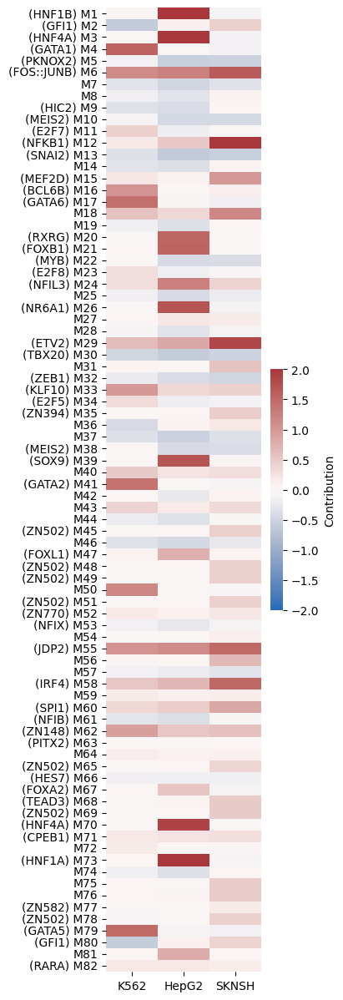

In [ ]:
motif_labels = boda2_streme_tfs['ultimate_id'].tolist()
plt.figure(figsize=(3,15))
sns.heatmap(all_motif_contributions, vmin=-2, vmax=2, cmap="vlag",
            cbar_kws={'label': 'Contribution', "shrink": .25})
plt.yticks(np.arange(0, len(motif_list))+0.5, labels=motif_labels)
plt.xticks(np.arange(3)+0.5, labels=['K562', 'HepG2', 'SKNSH'])
plt.show()

In [ ]:
boda2_streme_tfs[['contrib_K562', 'contrib_HepG2', 'contrib_SKNSH']] = all_motif_contributions.numpy()

In [ ]:
(boda2_streme_tfs[['contrib_K562', 'contrib_HepG2', 'contrib_SKNSH']].mean(axis=1) > 0).sum()

55

In [ ]:
#boda2_streme_tfs.to_csv("/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/STREME_min8_TFs_merge.txt", index=None, sep=' ')

# Motif similarity

In [ ]:
PSSMs = torch.Tensor(np.stack(boda2_streme_tfs['padded_pssm'].tolist(), axis=0))
PSSMs_rc = torch.Tensor(np.stack(boda2_streme_tfs['padded_pssm_rc'].tolist(), axis=0))
filters = torch.cat([PSSMs, PSSMs_rc])

In [ ]:
icm_column = {0: 'icm', 1:'icm_rc'}
num_motifs = len(boda2_streme_tfs)

pearsons = np.zeros((num_motifs, num_motifs))
for motif_idx in tqdm(range(num_motifs)):
    motif_ref_id = boda2_streme_tfs.iloc[motif_idx]['ultimate_id']

    in_icm = torch.Tensor(boda2_streme_tfs_logos.iloc[motif_idx]['icm'])
    padded_icm = double_pad_seq_tensor(in_icm, pad_len=16)

    scan_scores = F.conv1d(padded_icm.view(1,4,-1), filters)
    values, indices = scan_scores.max(dim=-1)
    values, indices = values.numpy().flatten(), indices.numpy().flatten()

    stacked_values = np.stack([values[:num_motifs], values[num_motifs:]])
    stacked_indices = np.stack([indices[:num_motifs], indices[num_motifs:]])
    rc_flags = stacked_values.argmax(axis=0)

    for i in range(num_motifs):
        motif_match_id = boda2_streme_tfs.iloc[i]['ultimate_id']
        rc_flag = rc_flags[i]
        position = stacked_indices[rc_flag, i]
        match_icm = torch.Tensor(boda2_streme_tfs_logos.iloc[i][icm_column[rc_flag]])
        padded_match_icm = torch.zeros_like(padded_icm)
        padded_match_icm[:, position:position+match_icm.shape[1]] = match_icm
        pearson = np.corrcoef(padded_icm.flatten().numpy(), padded_match_icm.flatten().numpy())[0, 1]
        pearsons[motif_idx, i] = max(pearson, 0)

pearsons = np.maximum(pearsons, pearsons.T)

  0%|          | 0/82 [00:00<?, ?it/s]

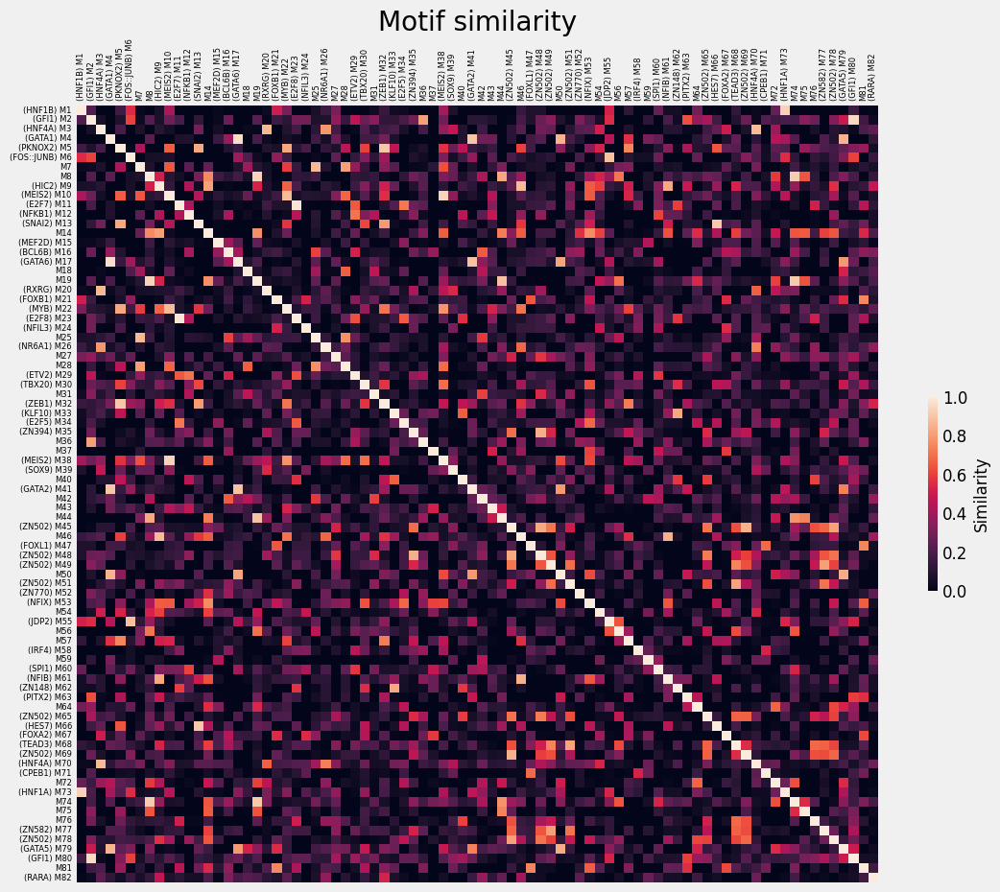

In [ ]:
all_ticks = np.arange(0, num_motifs) + 0.5
# mask = np.zeros_like(pearsons, dtype=bool)
# mask[np.triu_indices_from(mask)] = True
motif_labels = boda2_streme_tfs['ultimate_id']

with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=(12,10))
    g = sns.heatmap(pearsons, cbar_kws={'label': 'Similarity', "shrink": .25})
    plt.xticks(all_ticks, labels=motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    plt.title('Motif similarity')
    plt.show()

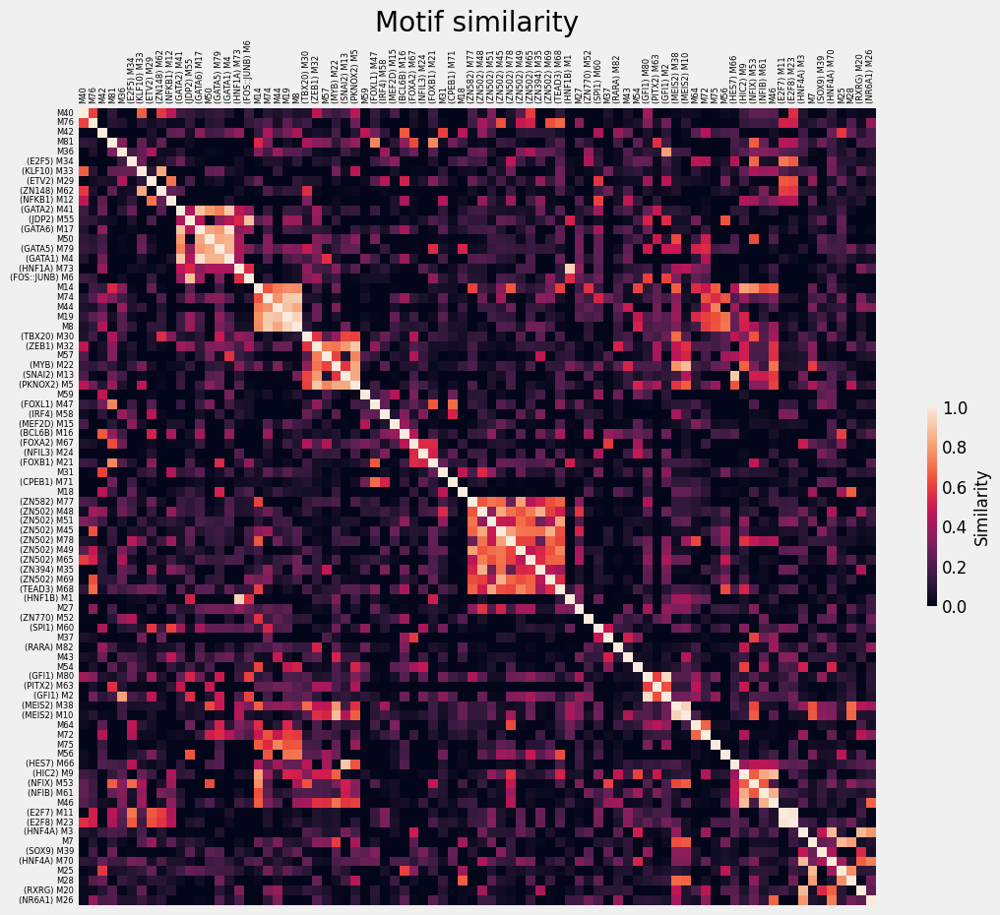

In [ ]:
from sklearn.datasets import make_biclusters
from sklearn.cluster import SpectralCoclustering, SpectralBiclustering
from sklearn.metrics import consensus_score

#--- Coclustering ---
figsize = (12, 10)

in_matrix = 1 - pearsons

num_clusters = 25
random_state = 0

cluster_model = SpectralCoclustering(n_clusters=num_clusters, random_state=random_state)
cluster_model.fit(in_matrix)

idx_ordering = np.argsort(cluster_model.row_labels_)
fit_data = in_matrix[np.ix_(idx_ordering, idx_ordering)]

clustered_motif_idxs = idx_ordering
clustered_motif_labels = [motif_labels[k] for k in clustered_motif_idxs]

with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(1-fit_data, square=True, cbar_kws={'label': 'Similarity', "shrink": .25})
    plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)

    plt.title("Motif similarity")
    plt.show()

# Topic assignments

In [ ]:
# hepg2_1 = '#993404'
# hepg2_2 = '#d95f0e'
# hepg2_3 = '#fe9929'
# k562_1 = '#41b6c4'
# k562_2 = '#253494'
# sknsh_1 = '#D500FF' # '#FF00D0' #
# sknsh_2 = '#FF0004'
# sknsh_3 = '#FF5CB0' # #fddaec
# extra_1 = '#fed9a6'
# extra_2 = '#ccebc5'
# extra_3 = '#ffffcc'
# extra_4 = '#e5d8bd'
# extra_5 = '#decbe4'
# blank   = '#f2f2f2'

# new_lab = ['Rep', 'H-1', 'S-1', 'K-1', 'M-1', 'H-2', 'S-2', 'M-2', 'M-3', 'S-3']
# coloring = { k:c for k,c in zip(new_lab,[extra_1, hepg2_1, sknsh_1, k562_1, extra_2, hepg2_2, sknsh_2, extra_4, extra_5, sknsh_3])}

# coloring = {
#     'M-1': (0.984313725490196, 0.7058823529411765, 0.6823529411764706, 1.0),
#     'H-1': (0.6, 0.20392156862745098, 0.01568627450980392, 1.0),
#     'S-2': (1.0, 0.0, 0.01568627450980392, 1.0),
#     'K-2': (0.1450980392156863, 0.20392156862745098, 0.5803921568627451, 1.0),
#     'M-2': (0.996078431372549, 0.8509803921568627, 0.6509803921568628, 1.0),
#     'H-2': (0.8509803921568627, 0.37254901960784315, 0.054901960784313725, 1.0),
#     'S-1': (0.8352941176470589, 0.0, 1.0, 1.0),
#     'M-3': (1.0, 1.0, 0.8, 1.0),
#     'M-4': (0.8980392156862745, 0.8470588235294118, 0.7411764705882353, 1.0),
#     'S-3': (1.0, 0.3607843137254902, 0.6901960784313725, 1.0),
#     'K-1': (0.2549019607843137, 0.7137254901960784, 0.7686274509803922, 1.0),
#     'M-5': (0.7019607843137254, 0.803921568627451, 0.8901960784313725, 1.0),
#     'M-6': (0.8, 0.9215686274509803, 0.7725490196078432, 1.0),
#     'M-7': (0.8705882352941177, 0.796078431372549, 0.8941176470588236, 1.0)
#     }

# coloring = {
#     'M-1': (0.984313725490196, 0.7058823529411765, 0.6823529411764706, 1.0),
#     'K-2': (0.1803921568627451, 0.2549019607843137, 0.7333333333333333, 1.0),
#     'S-2': (1.0, 0.0, 0.01568627450980392, 1.0),
#     'H-2': (0.8509803921568627, 0.37254901960784315, 0.054901960784313725, 1.0),
#     'M-2': (1.0, 1.0, 0.8, 1.0),
#     'M-3': (1.0, 0.7490196078431373, 0.0, 1.0),
#     'S-1': (0.8352941176470589, 0.0, 1.0, 1.0),
#     'H-1': (0.6, 0.20392156862745098, 0.01568627450980392, 1.0),
#     'S-3': (1.0, 0.3607843137254902, 0.6901960784313725, 1.0),
#     'K-3': (0.23921568627450981, 1.0, 0.5686274509803921, 1.0),
#     'M-4': (0.8705882352941177, 0.796078431372549, 0.8941176470588236, 1.0),
#     'M-5': (0.996078431372549, 0.8509803921568627, 0.6509803921568628, 1.0),
#     'K-1': (0.21176470588235294, 0.792156862745098, 0.8588235294117647, 1.0),
#     'M-6': (0.7019607843137254, 0.803921568627451, 0.8901960784313725, 1.0),
#     }

coloring = {'(Topic-0, ID-M-1)': (0.984313725490196, 0.7058823529411765, 0.6823529411764706, 1.0),
            '(Topic-1, ID-K-1)': (0.027450980392156862, 0.06666666666666667, 0.8, 1.0),
            '(Topic-2, ID-S-2)': (1.0, 0.0, 0.01568627450980392, 1.0),
            '(Topic-3, ID-H-1)': (0.6, 0.20392156862745098, 0.01568627450980392, 1.0),
            '(Topic-4, ID-M-2)': (1.0, 1.0, 0.8, 1.0),
            '(Topic-5, ID-H-3)': (1.0, 0.7490196078431373, 0.0, 1.0),
            '(Topic-6, ID-S-1)': (0.8352941176470589, 0.0, 1.0, 1.0),
            '(Topic-7, ID-H-2)': (0.8509803921568627, 0.37254901960784315, 0.054901960784313725, 1.0),
            '(Topic-8, ID-S-3)': (1.0, 0.3607843137254902, 0.6901960784313725, 1.0),
            '(Topic-9, ID-K-3)': (0.054901960784313725, 0.6823529411764706, 0.5450980392156862, 1.0),
            '(Topic-10, ID-M-3)': (0.8, 0.9215686274509803, 0.7725490196078432, 1.0),
            '(Topic-11, ID-M-4)': (0.8705882352941177, 0.796078431372549, 0.8941176470588236, 1.0),
            '(Topic-12, ID-K-2)': (0.2, 0.8549019607843137, 0.9254901960784314, 1.0),
            '(Topic-13, ID-K-4)': (0.5568627450980392, 0.9529411764705882, 0.30980392156862746, 1.0),
}
pal = sns.color_palette(coloring.values())
pal

[(0.984313725490196, 0.7058823529411765, 0.6823529411764706),
 (0.027450980392156862, 0.06666666666666667, 0.8),
 (1.0, 0.0, 0.01568627450980392),
 (0.6, 0.20392156862745098, 0.01568627450980392),
 (1.0, 1.0, 0.8),
 (1.0, 0.7490196078431373, 0.0),
 (0.8352941176470589, 0.0, 1.0),
 (0.8509803921568627, 0.37254901960784315, 0.054901960784313725),
 (1.0, 0.3607843137254902, 0.6901960784313725),
 (0.054901960784313725, 0.6823529411764706, 0.5450980392156862),
 (0.8, 0.9215686274509803, 0.7725490196078432),
 (0.8705882352941177, 0.796078431372549, 0.8941176470588236),
 (0.2, 0.8549019607843137, 0.9254901960784314),
 (0.5568627450980392, 0.9529411764705882, 0.30980392156862746)]

In [ ]:
# #temp_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_topic_modeling/boda_nmf_model_min8.pkl'
# temp_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_topic_modeling/boda_nmf_model (3).pkl'
# with open(temp_path, 'rb') as f:
#     nmf = pickle.load(f)

# topic_weights = nmf.components_

# motif_clusters = fastcluster.linkage(topic_weights.T, metric='euclidean', method='average')
# motif_order    = [ f'STREME-{i+1}' for i in leaves_list(motif_clusters) ]

# normal_topic_weights = topic_weights / topic_weights.sum(axis=1).reshape(-1,1)
# topic_contributions = np.matmul(normal_topic_weights, all_motif_contributions.numpy())

# clustered_topic_idxs = leaves_list(motif_clusters)

# plt.figure(figsize=(3,4))
# sns.heatmap(topic_contributions, vmin=-2, vmax=2, cmap="vlag",
#             cbar_kws={'label': 'Contribution', "shrink": .25})
# plt.xticks(np.arange(3)+0.5, labels=['K562', 'HepG2', 'SKNSH'], rotation=0)
# plt.yticks(np.arange(len(coloring))+0.5, labels=coloring.keys(), rotation=0)
# plt.show()

# topic_contributions

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator NMF from version 1.0.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


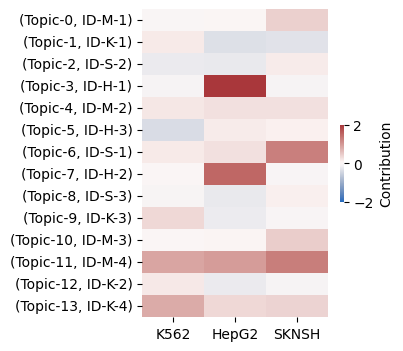

array([[-0.03181809,  0.01667648,  0.43311306],
       [ 0.18471474, -0.3440337 , -0.32479978],
       [-0.22159916, -0.24062746,  0.16635093],
       [-0.09662367,  2.63931577, -0.10001342],
       [ 0.20857965,  0.26874032,  0.27365646],
       [-0.39090314,  0.16529023,  0.09909277],
       [ 0.17188409,  0.26903877,  1.25087032],
       [-0.02604588,  1.50819366, -0.06418928],
       [-0.08231586, -0.24618513,  0.11752026],
       [ 0.34942507, -0.20512392, -0.06939809],
       [-0.00987506,  0.03437285,  0.45645689],
       [ 0.86640422,  0.95452428,  1.26592473],
       [ 0.19744088, -0.22108843, -0.09761721],
       [ 0.8013108 ,  0.35028894,  0.39807527]])

In [ ]:
temp_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_topic_modeling/boda_nmf_model_min8.pkl'
with open(temp_path, 'rb') as f:
    nmf = pickle.load(f)

topic_weights = nmf.components_

motif_clusters = fastcluster.linkage(topic_weights.T, metric='euclidean', method='average')
motif_order    = [ f'STREME-{i+1}' for i in leaves_list(motif_clusters) ]

normal_topic_weights = topic_weights / topic_weights.sum(axis=1).reshape(-1,1)
topic_contributions = np.matmul(normal_topic_weights, all_motif_contributions.numpy())

clustered_topic_idxs = leaves_list(motif_clusters)

plt.figure(figsize=(3,4))
sns.heatmap(topic_contributions, vmin=-2, vmax=2, cmap="vlag",
            cbar_kws={'label': 'Contribution', "shrink": .25})
plt.xticks(np.arange(3)+0.5, labels=['K562', 'HepG2', 'SKNSH'], rotation=0)
plt.yticks(np.arange(len(coloring))+0.5, labels=coloring.keys(), rotation=0)
plt.show()

topic_contributions

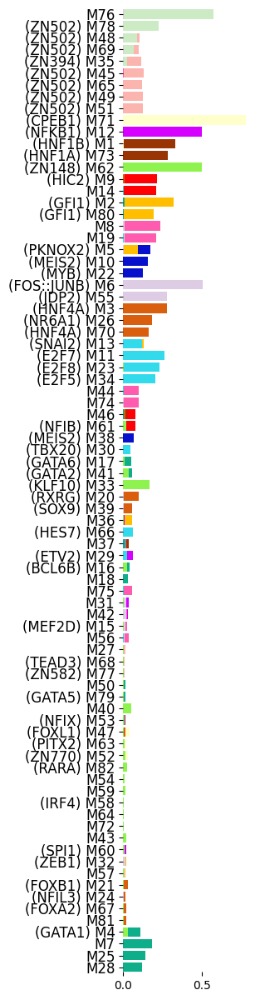

In [ ]:
idx_clustering = clustered_topic_idxs #clustered_topic_idxs #clustered_motif_idxs

clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]
num_topics = topic_weights.shape[0]

#weights = topic_weights / topic_weights.sum(axis=0) #.reshape(1,-1)
#weights = np.log(topic_weights + 1)
weights = normal_topic_weights.copy()
weights = weights[:, np.ix_(idx_clustering)].reshape(num_topics, -1)

plt.figure(figsize=(2,15))
for topic_idx in range(num_topics):
    plt.barh(clustered_motif_labels, weights[topic_idx, :], color=pal[topic_idx])

#plt.legend([b1, b2], ["Naturals", "Synthetics"], title="Group", fontsize=16)
#plt.xlabel('Topic assignment', fontsize=12)
plt.gca().invert_yaxis()
#plt.gca().invert_xaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.xticks([])
#plt.yticks([])
# plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.tick_params(axis='y', which='both', labelleft='off', labelright='on')
#plt.savefig(f"/content/drive/MyDrive/figures/motif_topic_weights.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()

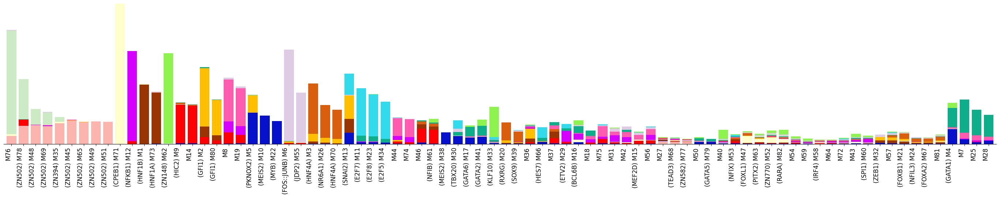

In [ ]:
#weights = topic_weights / topic_weights.sum(axis=0) #.reshape(1,-1)
#weights = topic_weights
weights = normal_topic_weights.copy()
weights = weights[:, np.ix_(idx_clustering)].reshape(num_topics, -1)

example_df = pd.DataFrame(weights.T)

ax = example_df.plot.bar(stacked=True,
                    figsize=(35,5),
                    width=.8,
                    color=pal,
                    fontsize='x-small',
                    edgecolor='black',
                    linewidth=0.0,
                    legend=False
                    )
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.set_xticklabels(clustered_motif_labels, rotation=90, ha='right', fontsize=12)
#ax.legend(bbox_to_anchor=(1,1), fontsize='medium', labelspacing=0.5, frameon=False)
plt.yticks([])
plt.show()

In [ ]:
words = []
for i in range(num_motifs):
    row = boda2_streme_tfs.iloc[i]
    ultimate_id = row['ultimate_id']
    name_type = len(ultimate_id.split(' '))
    if name_type == 1:
        name = f'M{i+1}' #row['name'].split('-')[1] #row['name'].split('-')[1] #f'motif_{i}' #row['name'].split('-')[1]
        words.append(name)
    else:
        name = row['short_name_best']
        words.append(name)

In [ ]:
def CustomCmap(from_rgb,to_rgb):
    # from color r,g,b
    r1,g1,b1 = from_rgb
    # to color r,g,b
    r2,g2,b2 = to_rgb
    cdict = {'red': ((0, r1, r1),
                   (1, r2, r2)),
           'green': ((0, g1, g1),
                    (1, g2, g2)),
           'blue': ((0, b1, b1),
                   (1, b2, b2))}
    return LinearSegmentedColormap('custom_cmap', cdict)

#custom_cmap = CustomCmap([0.3, 0.3, 0.3], [0, 0, 0])

custom_cmap = CustomCmap([1, 1, 1], [1, 1, 1])
#custom_cmap = CustomCmap([0, 0, 0], [0, 0, 0])

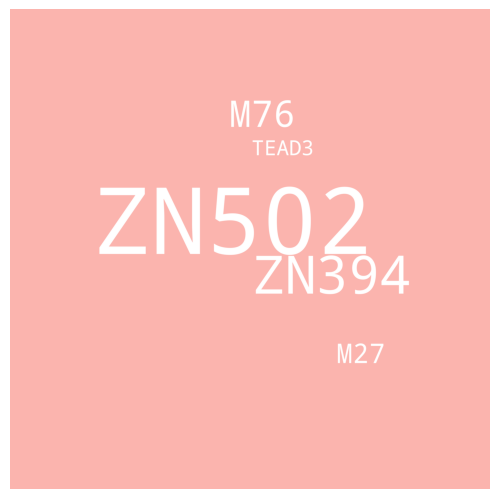

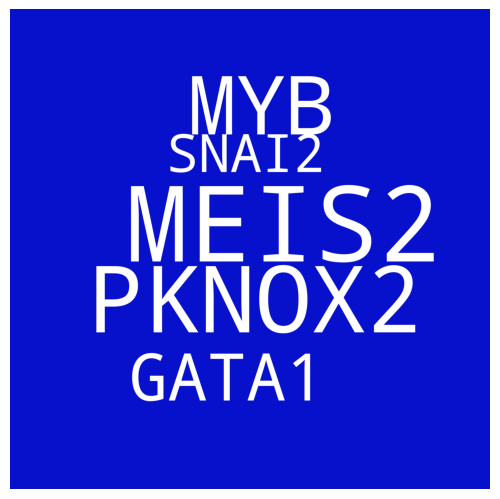

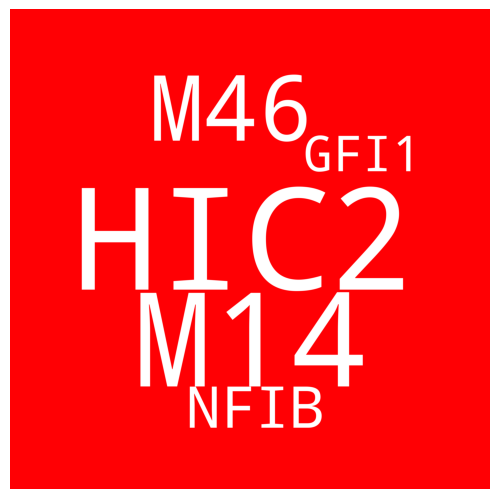

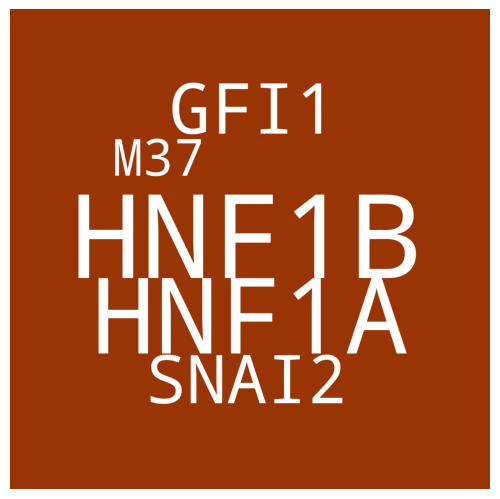

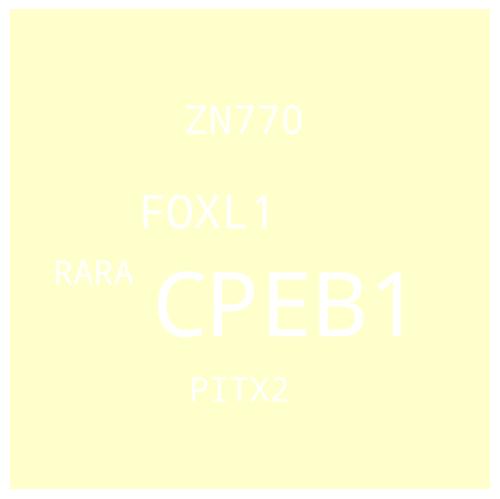

...

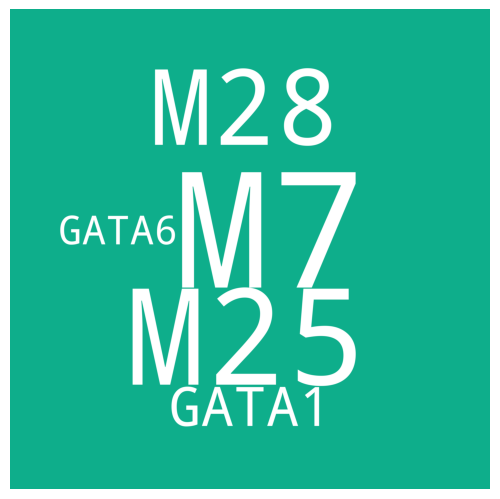

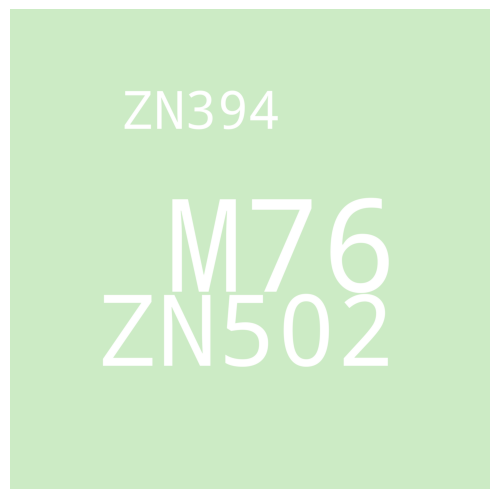

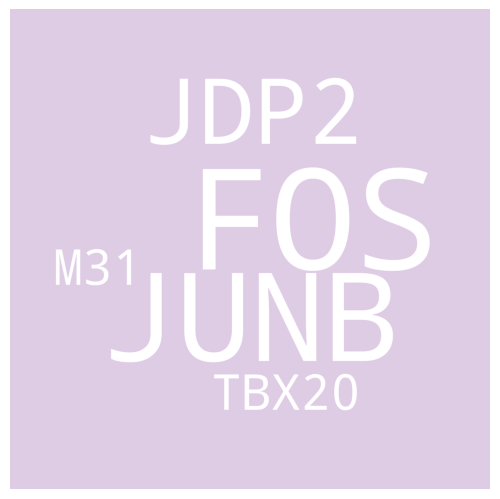

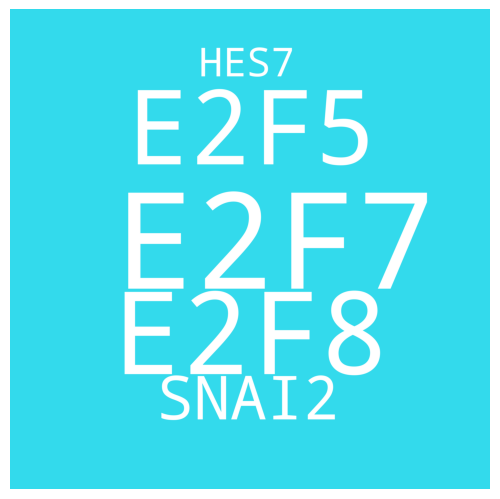

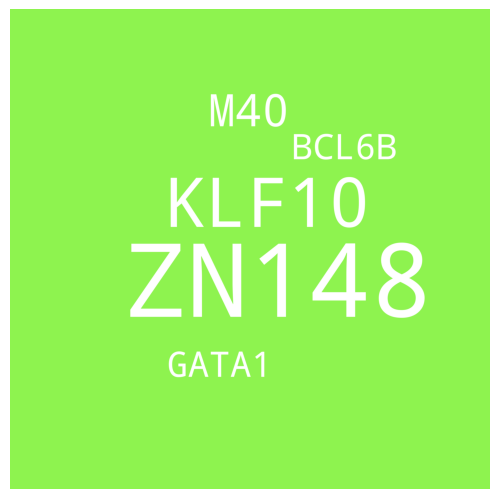

In [ ]:
colors = [mpl.colors.to_hex(x) for x in list(coloring.values())]

x, y = np.ogrid[:300, :300]
mask = (x - 150) ** 2 + (y - 150) ** 2 > 130 ** 2
mask = 255 * mask.astype(int)
for topic_ix in range(num_topics):
    word_frequencies = (100 * np.round(normal_topic_weights[topic_ix, :], 2)).astype(int)
    text = []
    for word_frequency, word in zip(word_frequencies, words):
        text += word_frequency * [word]
    text = " ".join(text)

    word_cloud = WordCloud(
            # width=2000,
            # height=2000,
            scale=10,
            random_state=0,
            background_color=colors[topic_ix],
            colormap=custom_cmap, #"gray",
            collocations=False,
            stopwords=STOPWORDS,
            max_words=5,
            #repeat=True,
            prefer_horizontal=1,
            mask=mask,
            ).generate(text)

    plt.gca().set_axis_off()
    plt.subplots_adjust(top = 1, bottom = 0, right = 1, left = 0,
                hspace = 0, wspace = 0)
    plt.imshow(word_cloud)
    #plt.axis("off")
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(plt.NullLocator())
    plt.gca().yaxis.set_major_locator(plt.NullLocator())
    #plt.savefig(f"/content/drive/MyDrive/figures/word_clouds/white_pdf/topic_{topic_ix}.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
    plt.show()

# Clustered motif contributions

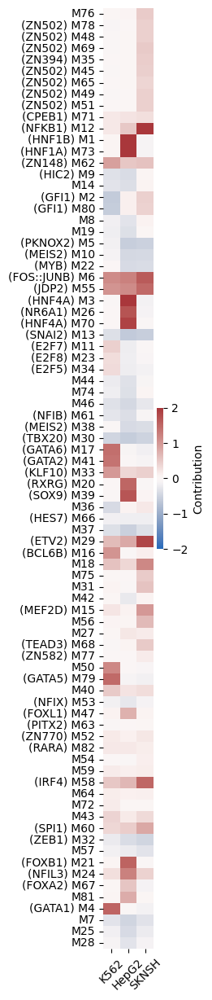

In [ ]:
idx_clustering = clustered_topic_idxs #clustered_motif_idxs

motif_labels = boda2_streme_tfs['ultimate_id'].tolist()
clustered_motif_labels = [motif_labels[k] for k in idx_clustering]

plt.figure(figsize=(1,15))
sns.heatmap(all_motif_contributions.numpy()[np.ix_(idx_clustering), :].reshape(-1,3), vmin=-2, vmax=2, cmap="vlag",
            cbar_kws={'label': 'Contribution', "shrink": .15})
plt.yticks(np.arange(0, len(idx_clustering))+0.5, labels=clustered_motif_labels, ha='right')
plt.xticks(np.arange(3)+0.5, labels=['K562', 'HepG2', 'SKNSH'], rotation=45)
#plt.savefig(f"/content/drive/MyDrive/figures/motif_contributions.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()

In [ ]:
for i in range(num_clusters):
    idxs = np.where(cluster_model.biclusters_[0][i])[0]
    if len(idxs):
        cluster_idxs = [int(np.where(clustered_motif_idxs == idx)[0]) for idx in idxs]
        cluster_labels = [clustered_motif_labels[i] for i in sorted(cluster_idxs)]
        print(cluster_labels)

['M76', '(ZN502) M78']
['(ZN502) M48']
['(ZN502) M69', '(ZN394) M35', '(ZN502) M45', '(ZN502) M65', '(ZN502) M49', '(ZN502) M51', '(CPEB1) M71']
['(NFKB1) M12', '(HNF1B) M1', '(HNF1A) M73', '(ZN148) M62', '(HIC2) M9', 'M14', '(GFI1) M2', '(GFI1) M80']
['M8', 'M19', '(PKNOX2) M5', '(MEIS2) M10', '(MYB) M22']
['(FOS::JUNB) M6', '(JDP2) M55', '(HNF4A) M3', '(NR6A1) M26', '(HNF4A) M70', '(SNAI2) M13']
['(E2F7) M11', '(E2F8) M23', '(E2F5) M34', 'M44', 'M74', 'M46', '(NFIB) M61', '(MEIS2) M38', '(TBX20) M30', '(GATA6) M17', '(GATA2) M41']
['(KLF10) M33', '(RXRG) M20', '(SOX9) M39', 'M36', '(HES7) M66', 'M37', '(ETV2) M29', '(BCL6B) M16', 'M18', 'M75']
['M31', 'M42']
['(MEF2D) M15', 'M56', 'M27', '(TEAD3) M68', '(ZN582) M77', 'M50']
['(GATA5) M79', 'M40', '(NFIX) M53']
['(FOXL1) M47', '(PITX2) M63']
['(ZN770) M52', '(RARA) M82', 'M54', 'M59']
['(IRF4) M58', 'M64', 'M72', 'M43', '(SPI1) M60']
['(ZEB1) M32', 'M57']
['(FOXB1) M21', '(NFIL3) M24', '(FOXA2) M67', 'M81', '(GATA1) M4', 'M7', 'M25', 

# Motif usage

In [ ]:
row_filter_1 = boda2_df['method'].isin(['DHS', 'gs', 'sa', 'al']) & (boda2_df['round'] == 0)

precise_library_df = boda2_df[row_filter_1 | (boda2_df['method'] == 'fsp') ].reset_index(drop=True)
print(len(precise_library_df))

natural_methods = ['DHS', 'gs']
#natural_methods = ['gs']
#natural_methods = ['DHS']

num_naturals = precise_library_df['method'].isin(natural_methods).sum()
num_synthetics = precise_library_df['method'].isin(['sa', 'al', 'fsp']).sum()
num_all_seqs = len(precise_library_df)
num_naturals, num_synthetics, num_all_seqs

75000


(24000, 51000, 75000)

In [ ]:
natural_pcts = []
synthetic_pcts = []
total_pcts = []
for motif_id in tqdm(motif_list):
    hit_seqs = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    motif_boda2_df = precise_library_df[precise_library_df['ID'].isin(hit_seqs)].reset_index(drop=True)
    motif_num_naturals = motif_boda2_df['method'].isin(natural_methods).sum()
    motif_num_synthetics = motif_boda2_df['method'].isin(['sa', 'al', 'fsp']).sum()
    natural_pcts.append(motif_num_naturals/num_naturals)
    synthetic_pcts.append(motif_num_synthetics/num_synthetics)
    total_pcts.append(len(motif_boda2_df)/num_all_seqs)

  0%|          | 0/82 [00:00<?, ?it/s]

In [ ]:
print(synthetic_pcts[3], natural_pcts[3])
print(synthetic_pcts[3]  /natural_pcts[3])
print(synthetic_pcts[2], natural_pcts[2])
print(synthetic_pcts[2] / natural_pcts[2])
print('')
print(synthetic_pcts[1], natural_pcts[1])
print(synthetic_pcts[1] / natural_pcts[1])
print(synthetic_pcts[9], natural_pcts[9])
print(synthetic_pcts[9] / natural_pcts[9])

0.23752941176470588 0.11508333333333333
2.0639775099033097
0.21841176470588236 0.10883333333333334
2.006846230069363

0.27515686274509804 0.035166666666666666
7.824365765263452
0.23933333333333334 0.034375
6.962424242424242


In [ ]:
#---- X-fold occurrence
for fold in range(5):
    num_over_fold = (np.array(synthetic_pcts) / np.array(natural_pcts) >= fold).sum()
    print(fold, num_over_fold)

print('')

for fold in range(5):
    num_over_fold = (np.array(natural_pcts) / np.array(synthetic_pcts) >= fold).sum()
    print(fold, num_over_fold)

fold = 2
motif_set_1 = set(np.where(np.array(synthetic_pcts) / np.array(natural_pcts) >= fold)[0])
len(motif_set_1)

for fold in range(5):
    num_over_fold = (np.array(synthetic_pcts) / np.array(natural_pcts) >= fold).sum()
    print(fold, num_over_fold)

print('')
for fold in range(5):
    num_over_fold = (np.array(natural_pcts) / np.array(synthetic_pcts) >= fold).sum()
    print(fold, num_over_fold)

fold = 2
motif_set_2 = set(np.where(np.array(synthetic_pcts) / np.array(natural_pcts) >= fold)[0])
len(motif_set_2)

print(len(motif_set_1 & motif_set_2), len(motif_set_1), len(motif_set_2))

0 82
1 56
2 46
3 30
4 25

0 82
1 26
2 20
3 14
4 9
0 82
1 56
2 46
3 30
4 25

0 82
1 26
2 20
3 14
4 9
46 46 46


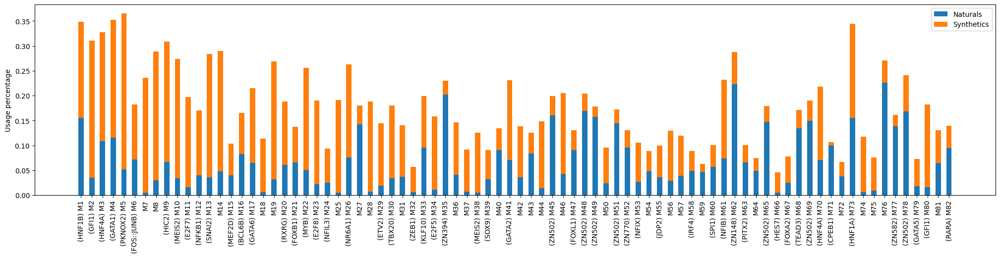

In [ ]:
motif_labels = boda2_streme_tfs['ultimate_id']

weight_counts = {
    "Naturals": np.array(natural_pcts),
    "Synthetics": np.array(synthetic_pcts),
}

width = 0.5

fig, ax = plt.subplots(figsize=(25,5))
bottom = np.zeros(len(boda2_streme_tfs))

for boolean, weight_count in weight_counts.items():
    p = ax.bar(motif_labels, weight_count, width, label=boolean, bottom=bottom)
    bottom += weight_count

#ax.set_title("")
ax.legend(loc="upper right")

plt.xticks(rotation=90)
plt.ylabel('Usage percentage')
plt.show()

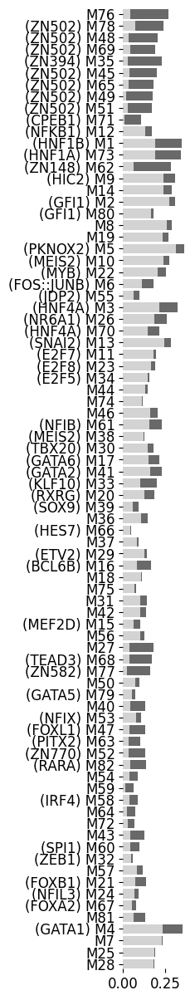

In [ ]:
idx_clustering = clustered_topic_idxs #np.arange(0, num_motifs) #clustered_topic_idxs #clustered_motif_idxs

clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]
clustered_natural_pcts = np.array(natural_pcts)[np.ix_(idx_clustering)]
clustered_synthetic_pcts = np.array(synthetic_pcts)[np.ix_(idx_clustering)]

plt.figure(figsize=(1,15))
b1 = plt.barh(clustered_motif_labels, clustered_synthetic_pcts, color="lightgray")
b2 = plt.barh(clustered_motif_labels, clustered_natural_pcts, left=clustered_synthetic_pcts, color="dimgray")

#plt.legend([b1, b2], ["Synthetics", "Naturals"], title="Group", fontsize=8)
#plt.xlabel('Occurrence percentage', fontsize=12)
plt.gca().invert_yaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.yticks([])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.savefig(f"/content/drive/MyDrive/figures/motif_usage.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()

  0%|          | 0/82 [00:00<?, ?it/s]

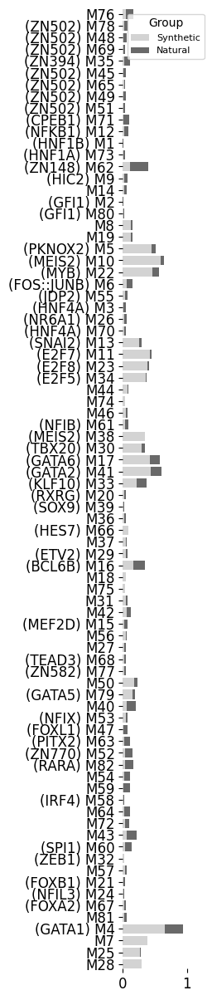

0.6503529411764706
0.28475
0.015705882352941177
0.036375
0.003235294117647059
0.012625
0.5854117647058823
0.05375


  0%|          | 0/82 [00:00<?, ?it/s]

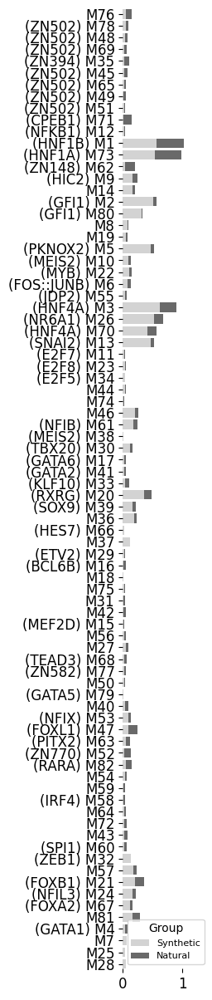

0.03835294117647059
0.04
0.6278823529411764
0.26875
0.515
0.05275
0.1008235294117647
0.029


  0%|          | 0/82 [00:00<?, ?it/s]

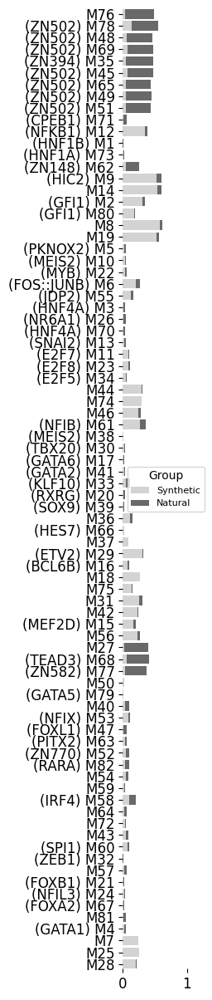

0.02388235294117647
0.0205
0.011647058823529411
0.021375
0.30723529411764705
0.040125
0.03176470588235294
0.020375


In [ ]:
idx_clustering = clustered_topic_idxs
clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]

natural_methods = ['DHS', 'gs']
synthetic_methods = ['sa', 'al', 'fsp']

for target_cell in ['k562', 'hepg2', 'sknsh']:
    cell_df = precise_library_df[precise_library_df['target_cell'] == target_cell].reset_index(drop=True)
    cell_num_naturals = cell_df['method'].isin(natural_methods).sum()
    cell_num_synthetics = cell_df['method'].isin(['sa', 'al', 'fsp']).sum()
    cell_num_all_seqs = len(cell_df)

    cell_natural_pcts = []
    cell_synthetic_pcts = []
    cell_total_pcts = []
    for motif_id in tqdm(motif_list):
        hit_seqs = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
        motif_boda2_df = cell_df[cell_df['ID'].isin(hit_seqs)].reset_index(drop=True)
        motif_num_naturals = motif_boda2_df['method'].isin(natural_methods).sum()
        motif_num_synthetics = motif_boda2_df['method'].isin(synthetic_methods).sum()
        cell_natural_pcts.append(motif_num_naturals/cell_num_naturals)
        cell_synthetic_pcts.append(motif_num_synthetics/cell_num_synthetics)
        cell_total_pcts.append(len(motif_boda2_df)/cell_num_all_seqs)

    clustered_natural_pcts = np.array(cell_natural_pcts)[np.ix_(idx_clustering)]
    clustered_synthetic_pcts = np.array(cell_synthetic_pcts)[np.ix_(idx_clustering)]

    plt.figure(figsize=(1,15))
    b1 = plt.barh(clustered_motif_labels, clustered_synthetic_pcts, color="lightgray")
    b2 = plt.barh(clustered_motif_labels, clustered_natural_pcts, left=clustered_synthetic_pcts, color="dimgray")

    plt.legend([b1, b2], ["Synthetic", "Natural"], title="Group", fontsize=8)
    #plt.xlabel('Occurrence percentage', fontsize=12)
    plt.gca().invert_yaxis()
    plt.margins(y=0)
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    #plt.yticks([])
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xticks([0,1])
    plt.savefig(f"/content/drive/MyDrive/figures/motif_usage_{target_cell}.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
    plt.show()

    print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(GATA1) M4')[0][0]])
    print(clustered_natural_pcts[np.where(clustered_motif_labels == '(GATA1) M4')[0][0]])
    print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(HNF4A) M3')[0][0]])
    print(clustered_natural_pcts[np.where(clustered_motif_labels == '(HNF4A) M3')[0][0]])

    print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(GFI1) M2')[0][0]])
    print(clustered_natural_pcts[np.where(clustered_motif_labels == '(GFI1) M2')[0][0]])
    print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(MEIS2) M10')[0][0]])
    print(clustered_natural_pcts[np.where(clustered_motif_labels == '(MEIS2) M10')[0][0]])

In [ ]:
print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(GATA1) M4')[0][0]])
print(clustered_natural_pcts[np.where(clustered_motif_labels == '(GATA1) M4')[0][0]])
print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(HNF4A) M3')[0][0]])
print(clustered_natural_pcts[np.where(clustered_motif_labels == '(HNF4A) M3')[0][0]])

print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(GFI1) M2')[0][0]])
print(clustered_natural_pcts[np.where(clustered_motif_labels == '(GFI1) M2')[0][0]])
print(clustered_synthetic_pcts[np.where(clustered_motif_labels == '(MEIS2) M10')[0][0]])
print(clustered_natural_pcts[np.where(clustered_motif_labels == '(MEIS2) M10')[0][0]])

0.011647058823529411

56
49


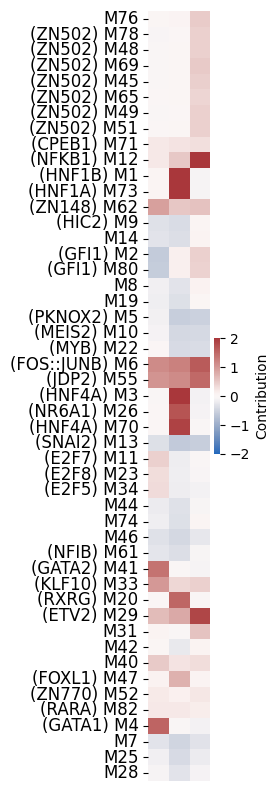

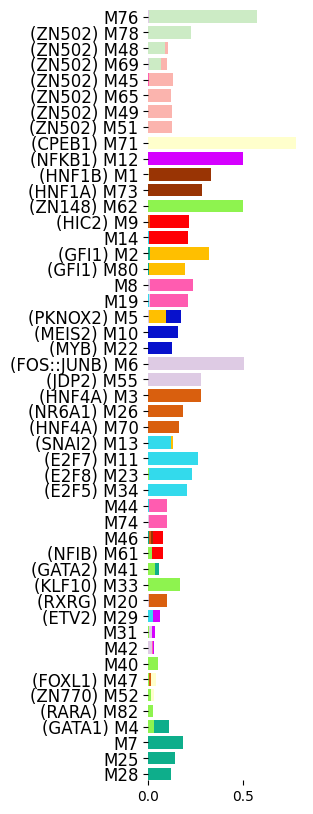

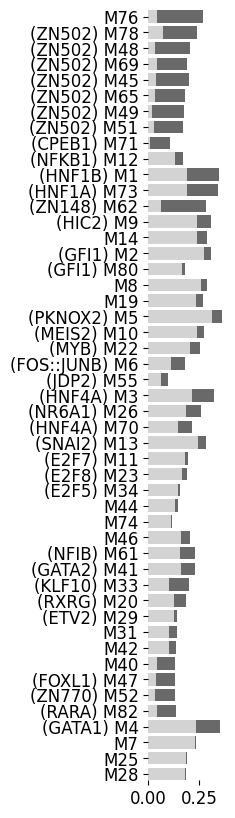

In [ ]:
#--------- Per-topic-top-3 motif list ---------
idx_clustering = clustered_topic_idxs

n = 4
topn_idx_set = []

for i in range(num_topics):
    topn_idx_set += np.argsort(-normal_topic_weights[i, :])[:n].tolist()
print(len(topn_idx_set))

topn_idx_set = list(set(topn_idx_set))
print(len(topn_idx_set))

topn_clustered_idxs = []
for j in idx_clustering:
    if j in topn_idx_set:
        topn_clustered_idxs.append(j)

#-Contributions
idx_clustering = topn_clustered_idxs #clustered_motif_idxs

motif_labels = boda2_streme_tfs['ultimate_id'].tolist()
clustered_motif_labels = [motif_labels[k] for k in idx_clustering]

plt.figure(figsize=(1,10))
sns.heatmap(all_motif_contributions.numpy()[np.ix_(idx_clustering), :].reshape(-1,3), vmin=-2, vmax=2, cmap="vlag",
            cbar_kws={'label': 'Contribution', "shrink": .15})
plt.yticks(np.arange(0, len(idx_clustering))+0.5, labels=clustered_motif_labels, ha='right', rotation=0, fontsize=12)
#plt.xticks(np.arange(3)+0.5, labels=['K562', 'HepG2', 'SKNSH'], rotation=45)
plt.xticks([])
#plt.savefig(f"/content/drive/MyDrive/figures/motif_contributions_topn.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()


#-Topic assigments
weights = normal_topic_weights.copy()
weights = weights[:, np.ix_(idx_clustering)].reshape(num_topics, -1)

plt.figure(figsize=(2,10))
for topic_idx in range(num_topics):
    plt.barh(clustered_motif_labels, weights[topic_idx, :], color=pal[topic_idx])

#plt.legend([b1, b2], ["Naturals", "Synthetics"], title="Group", fontsize=16)
#plt.xlabel('Topic assignment', fontsize=12)
plt.gca().invert_yaxis()
#plt.gca().invert_xaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.xticks([])
#plt.yticks([])
# plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.tick_params(axis='y', which='both', labelleft='off', labelright='on')
#plt.savefig(f"/content/drive/MyDrive/figures/motif_topic_weights_topn.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()


#-Occurrence
clustered_natural_pcts = np.array(natural_pcts)[np.ix_(idx_clustering)]
clustered_synthetic_pcts = np.array(synthetic_pcts)[np.ix_(idx_clustering)]

plt.figure(figsize=(1,10))
b1 = plt.barh(clustered_motif_labels, clustered_synthetic_pcts, color="lightgray")
b2 = plt.barh(clustered_motif_labels, clustered_natural_pcts, left=clustered_synthetic_pcts, color="dimgray")

#plt.legend([b1, b2], ["Synthetics", "Naturals"], title="Group", fontsize=8)
#plt.xlabel('Occurrence percentage', fontsize=12)
plt.gca().invert_yaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.yticks([])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
#plt.savefig(f"/content/drive/MyDrive/figures/motif_usage_topn.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()

In [ ]:
k562_pcts = []
hepg2_pcts = []
sknsh_pcts = []
for motif_id in tqdm(motif_list):
    hit_seqs = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    motif_boda2_df = precise_library_df[precise_library_df['ID'].isin(hit_seqs)].reset_index(drop=True)
    k562_pcts.append( (motif_boda2_df['target_cell'] == 'k562').sum() / num_all_seqs )
    hepg2_pcts.append( (motif_boda2_df['target_cell'] == 'hepg2').sum() / num_all_seqs )
    sknsh_pcts.append( (motif_boda2_df['target_cell'] == 'sknsh').sum() / num_all_seqs )

  0%|          | 0/82 [00:00<?, ?it/s]

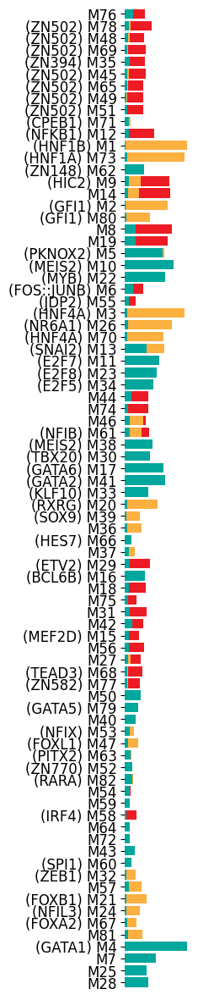

In [ ]:
idx_clustering = clustered_topic_idxs#np.arange(0, 41) #clustered_topic_idxs #clustered_motif_idxs

clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]
clustered_k562_pcts = np.array(k562_pcts)[np.ix_(idx_clustering)]
clustered_hepg2_pcts = np.array(hepg2_pcts)[np.ix_(idx_clustering)]
clustered_sknsh_pcts = np.array(sknsh_pcts)[np.ix_(idx_clustering)]

plt.figure(figsize=(1,15))
b3 = plt.barh(clustered_motif_labels, clustered_sknsh_pcts, color="#ED1C24")
b2 = plt.barh(clustered_motif_labels, clustered_hepg2_pcts, color="#FBB040")
b1 = plt.barh(clustered_motif_labels, clustered_k562_pcts, color='#00A79D')

#plt.legend([b1, b2], ["Naturals", "Synthetics"], title="Group", fontsize=8)
#plt.xlabel('Enrichment', fontsize=12)
plt.gca().invert_yaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.yticks([])
plt.xticks([])
plt.yticks(fontsize=12)#, color='#002D72')
#plt.savefig(f"/content/drive/MyDrive/figures/motif_target_enrichment.pdf", bbox_inches = 'tight', pad_inches=0, dpi=200)
plt.show()

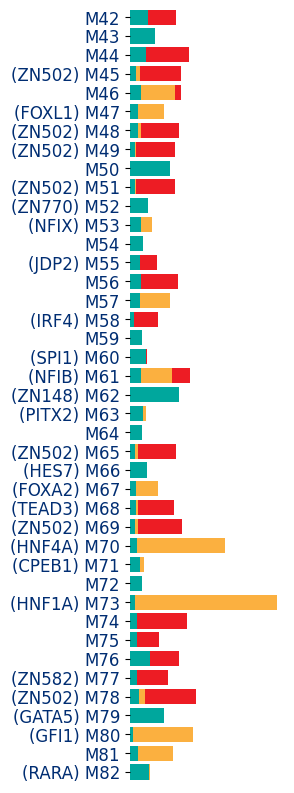

In [ ]:
idx_clustering = np.arange(41, num_motifs) #clustered_topic_idxs #clustered_motif_idxs

clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]
clustered_k562_pcts = np.array(k562_pcts)[np.ix_(idx_clustering)]
clustered_hepg2_pcts = np.array(hepg2_pcts)[np.ix_(idx_clustering)]
clustered_sknsh_pcts = np.array(sknsh_pcts)[np.ix_(idx_clustering)]

plt.figure(figsize=(2,10))
b3 = plt.barh(clustered_motif_labels, clustered_sknsh_pcts, color="#ED1C24")
b2 = plt.barh(clustered_motif_labels, clustered_hepg2_pcts, color="#FBB040")
b1 = plt.barh(clustered_motif_labels, clustered_k562_pcts, color='#00A79D')

#plt.legend([b1, b2], ["Naturals", "Synthetics"], title="Group", fontsize=8)
#plt.xlabel('Enrichment', fontsize=12)
plt.gca().invert_yaxis()
plt.margins(y=0)
for spine in plt.gca().spines.values():
    spine.set_visible(False)
#plt.yticks([])
plt.xticks([])
plt.yticks(fontsize=12, color='#002D72')
#plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
plt.show()

# Get co-occuurrence

In [ ]:
import bottleneck as bn

def top_n_indexes(arr, n):
    idx = bn.argpartition(arr, arr.size-n, axis=None)[-n:]
    width = arr.shape[1]
    return [divmod(i, width) for i in idx]

In [ ]:
row_filter_1 = boda2_df['method'].isin(['DHS', 'gs', 'sa', 'al']) & (boda2_df['round'] == 0)
row_filter_2 = (boda2_df['method'] == 'fsp')

precise_library_df = boda2_df[row_filter_1 | row_filter_2].reset_index(drop=True)


contrib_means = all_motif_contributions.mean(dim=-1)
pos_idxs = torch.where(contrib_means > 0)[0].tolist()
neg_idxs = torch.where(contrib_means <= 0)[0].tolist()

pos_neg_pairs = []
for pos_i in pos_idxs:
    for neg_j in neg_idxs:
        pos_neg_pairs.append(tuple(sorted([pos_i, neg_j])))
pos_neg_pairs = list(set(pos_neg_pairs))

pos_pos_pairs = []
for pos_i in pos_idxs:
    for pos_j in pos_idxs:
        if pos_i != pos_j:
            pos_pos_pairs.append(tuple(sorted([pos_i, pos_j])))
pos_pos_pairs = list(set(pos_pos_pairs))

neg_neg_pairs = []
for neg_i in neg_idxs:
    for neg_j in neg_idxs:
        if neg_i != neg_j:
            neg_neg_pairs.append(tuple(sorted([neg_i, neg_j])))
neg_neg_pairs = list(set(neg_neg_pairs))

len(pos_neg_pairs), len(pos_pos_pairs), len(neg_neg_pairs)

(1485, 1485, 351)

In [ ]:
# paper_library_ids = precise_library_df['ID'].tolist() + boda2_df[boda2_df['method'].isnull()]['ID'].tolist()
# paper_library_fimo = fimo_df[fimo_df['sequence_name'].isin(paper_library_ids)].reset_index(drop=True)
# paper_library_fimo.to_csv('/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/fimo_min8_paper_library.txt', sep='\t', index=None)

In [ ]:
len(paper_library_fimo)/len(fimo_df)

0.7491030950898876

In [ ]:
set(pos_neg_pairs) & set(pos_pos_pairs)

set()

In [ ]:
len(pos_idxs)*len(neg_idxs), (len(pos_idxs)-1)*len(pos_idxs)

(1485, 2970)

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

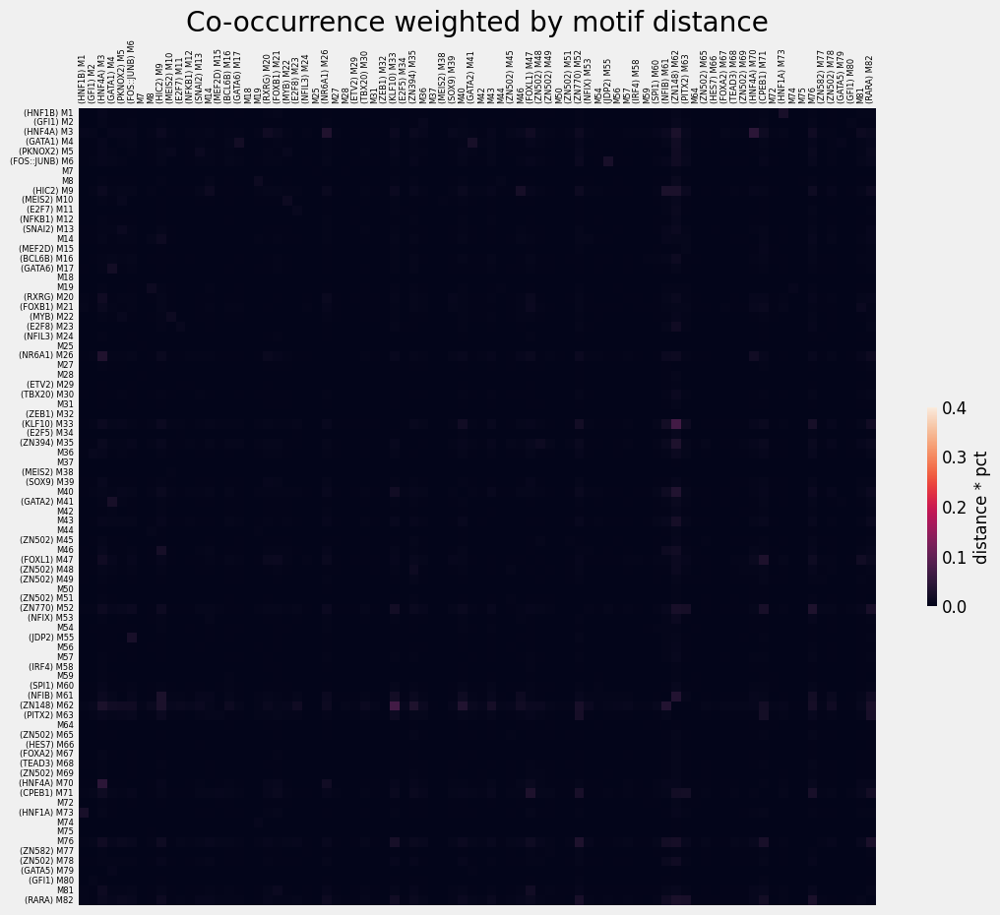

In [ ]:
#--- Co-occurrence
idx_clustering = np.arange(0, num_motifs)
clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()[np.ix_(idx_clustering)]

motif_list = boda2_streme_tfs['motif_id'].tolist()
ultimate_ids = boda2_streme_tfs['ultimate_id']
figsize = (12, 10)

#methods = ['fsp', 'al', 'sa']
#methods = ['DHS', 'gs']
#methods = ['gs']
methods = ['DHS']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']
target_cells = ['k562', 'hepg2', 'sknsh'] #['k562', 'hepg2', 'sknsh']

group_df = precise_library_df[precise_library_df['method'].isin(methods) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)
#-For non-penalized
group_df = group_df[group_df['round'].isin([0])].reset_index(drop=True)

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)
num_seqs = len(group_df)

all_sequence_sets = []
coocurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    row_sequence_sets = []
    for j in range(i+1, num_motifs):
        coocurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        seq_ids = group_df[coocurrence_filter]['ID'].tolist()
        coocurrence_counts[i,j] = len(seq_ids)
        row_sequence_sets.append(seq_ids)
    all_sequence_sets.append((row_sequence_sets))
coocurrence_pcts = coocurrence_counts / num_seqs
coocurrence_pcts = coocurrence_pcts + coocurrence_pcts.T

sorted_coocurrence = coocurrence_pcts[np.ix_(idx_clustering, idx_clustering)]

# with plt.style.context('fivethirtyeight'):
#     plt.figure(figsize=figsize)
#     g = sns.heatmap(sorted_coocurrence, square=True, vmin=0, vmax=0.15,
#                     cbar_kws={'label': 'Pct', "shrink": .25})
#     plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
#     plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
#     g.figure.axes[-1].yaxis.label.set_size(12)
#     g.figure.axes[-1].tick_params(labelsize=12)
#     g.xaxis.tick_top()
#     # g.yaxis.tick_right()
#     plt.grid(False)
#     plt.title('Co-occurrence pcts')

#     plt.show()

figsize = (12, 10)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(fit_data * sorted_coocurrence, square=True, vmin=0, vmax=0.4, #cmap="viridis",
                    cbar_kws={'label': 'distance * pct', "shrink": .25})
    plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    plt.title('Co-occurrence weighted by motif distance')

    plt.show()

In [ ]:
'''
Non-penalized synthetics:
pos/neg: 0.9853055555555555
pos/pos: 0.9706666666666667
neg/neg: 0.9549722222222222

Malinois-natural:
pos/neg: 0.38266666666666665
pos/pos: 0.9355833333333333
neg/neg: 0.15525

DHS-natural:
pos/neg: 0.5363333333333333
pos/pos: 0.79375
neg/neg: 0.26

All synthetics:
pos/neg: 0.9298235294117647
pos/pos: 0.9445686274509804
neg/neg: 0.8535882352941176

All naturals:
pos/neg: 0.4595
pos/pos: 0.8646666666666667
neg/neg: 0.207625

In [ ]:
seq_set = []
for idx_pair in pos_neg_pairs:
    if idx_pair[1] == idx_pair[0]:
        pass
    else:
        seq_set += all_sequence_sets[idx_pair[0]][idx_pair[1] - idx_pair[0] - 1]
print(len(set(seq_set))/num_seqs)

seq_set = []
for idx_pair in pos_pos_pairs:
    seq_set += all_sequence_sets[idx_pair[0]][idx_pair[1] - idx_pair[0] - 1]
print(len(set(seq_set))/num_seqs)

seq_set = []
for idx_pair in neg_neg_pairs:
    seq_set += all_sequence_sets[idx_pair[0]][idx_pair[1] - idx_pair[0] - 1]
print(len(set(seq_set))/num_seqs)

0.5363333333333333
0.79375
0.26


In [ ]:
global_id_set_1 = []
global_id_set_2 = []

In [ ]:
len(set(global_id_set_1))/51000, len(set(global_id_set_2))/24000

(0.7626666666666667, 0.11575)

In [ ]:
len(global_id_set_1), len(global_id_set_2), len(set(global_id_set_1)), len(set(global_id_set_2))

(38896, 2778, 38896, 2778)

In [ ]:
#--- Co-occurrence difference
motif_list = boda2_streme_tfs['motif_id'].tolist()
ultimate_ids = boda2_streme_tfs['ultimate_id']
target_cells = ['sknsh'] #['k562', 'hepg2', 'sknsh']

#--- Group 1
methods = ['fsp', 'al', 'sa']
#methods = ['DHS', 'gs']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']
 #['k562', 'hepg2', 'sknsh']

group_df = precise_library_df[precise_library_df['method'].isin(methods) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)
#-For non-penalized
#group_df = group_df[group_df['round'].isin([0])].reset_index(drop=True)

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)
num_seqs_1 = len(group_df)

all_sequence_sets_1 = []
coocurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    row_sequence_sets = []
    for j in range(i+1, num_motifs):
        coocurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        seq_ids = group_df[coocurrence_filter]['ID'].tolist()
        coocurrence_counts[i,j] = len(seq_ids)
        row_sequence_sets.append(seq_ids)
    all_sequence_sets_1.append((row_sequence_sets))
coocurrence_pcts = coocurrence_counts / num_seqs_1
coocurrence_pcts = coocurrence_pcts + coocurrence_pcts.T

sorted_coocurrence_1 = coocurrence_pcts #[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

#--- Group 2
#methods = ['fsp', 'al', 'sa']
methods = ['DHS', 'gs']
#methods = ['DHS']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']

group_df = precise_library_df[precise_library_df['method'].isin(methods) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)

#-For penalized:
# group_df = precise_library_df[precise_library_df['round'].isin([1,2,3,4,5]) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)
# group_df = group_df[group_df['method'].isin(['fsp'])].reset_index(drop=True)
#---

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)
num_seqs_2 = len(group_df)

all_sequence_sets_2 = []
coocurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    row_sequence_sets = []
    for j in range(i+1, num_motifs):
        coocurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        seq_ids = group_df[coocurrence_filter]['ID'].tolist()
        coocurrence_counts[i,j] = len(seq_ids)
        row_sequence_sets.append(seq_ids)
    all_sequence_sets_2.append((row_sequence_sets))
coocurrence_pcts = coocurrence_counts / num_seqs_2
coocurrence_pcts = coocurrence_pcts + coocurrence_pcts.T

sorted_coocurrence_2 = coocurrence_pcts #[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

In [ ]:
num_seqs_1, num_seqs_2

(17000, 8000)

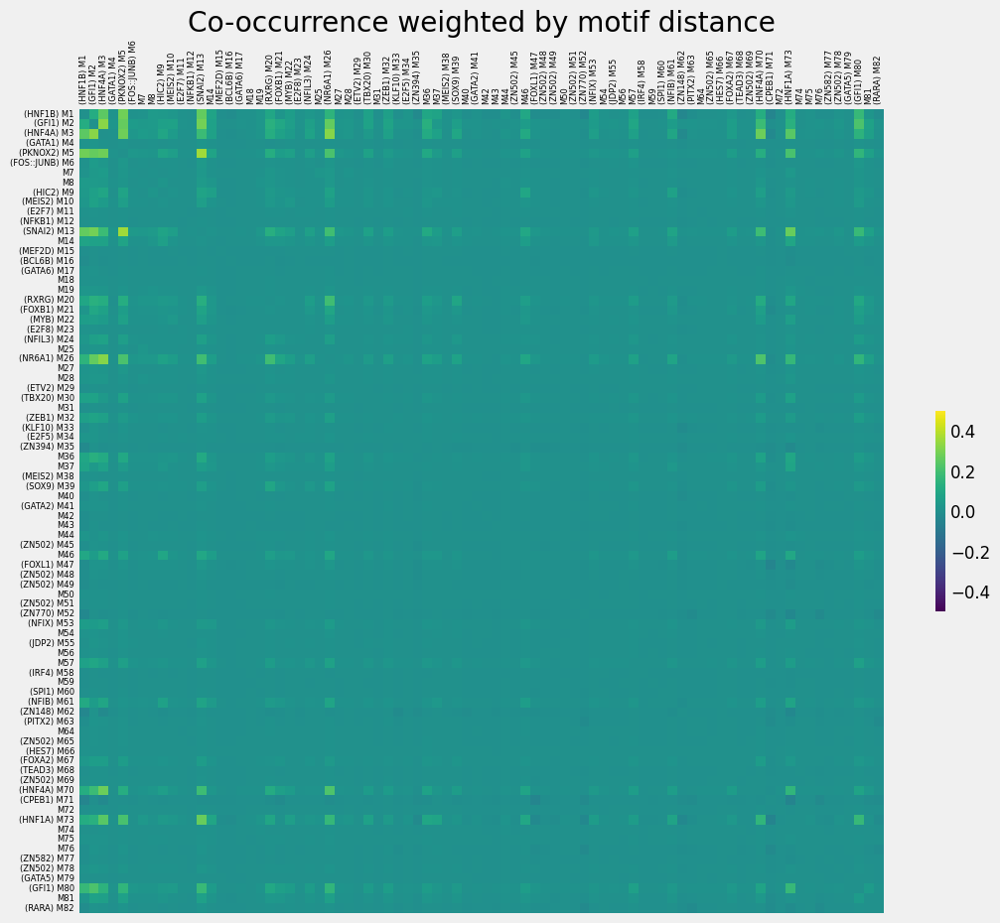

In [ ]:
clustered_motif_labels = boda2_streme_tfs['ultimate_id'].to_numpy()#[np.ix_(idx_clustering)]

figsize = (12, 10)

above_distance_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(above_distance_matrix, square=True, vmin=-0.5, vmax=0.5, cmap="viridis",
                    cbar_kws={'label': '', "shrink": .25})
    plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    plt.title('Co-occurrence weighted by motif distance')

    plt.show()

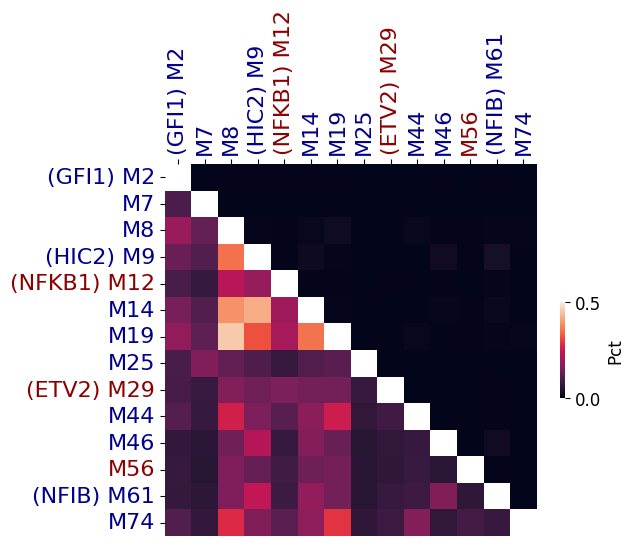

85.4 8.7


In [ ]:
n_top = 50 #20 #50

#---Motif label colors
contrib_means = all_motif_contributions.mean(dim=-1)
pos_idxs = torch.where(contrib_means > 0)[0].tolist()
neg_idxs = torch.where(contrib_means <= 0)[0].tolist()
motif_colors = ['darkred' if (i in pos_idxs) else 'darkblue' for i in range(82)]

some_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
top_idxs = top_n_indexes(some_matrix, n_top)
top_idxs = sorted(set([item for t in top_idxs for item in t]))

reduced_ticks = np.arange(0.5, len(top_idxs) + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in top_idxs]
reduced_colors = [motif_colors[j] for j in top_idxs]

#---Cooccurrence
plot_matrix_l = (sorted_coocurrence_1)[np.ix_(top_idxs, top_idxs)]
plot_matrix_u = (sorted_coocurrence_2)[np.ix_(top_idxs, top_idxs)]

mask_u = np.zeros_like(plot_matrix_u, dtype=bool)
mask_u[np.triu_indices_from(mask_u)] = True

mask_l = np.zeros_like(plot_matrix_l, dtype=bool)
mask_l[np.tril_indices_from(mask_l)] = True

plot_matrix = mask_l * plot_matrix_l + mask_u * plot_matrix_u

#zeros = np.zeros_like(plot_matrix, dtype=bool)
mask = np.eye(len(top_idxs))

max_color = 0.5 #np.round(plot_matrix.max(), 2) #0.45 #np.round(plot_matrix.max(), 2)
figsize = (6, 5)
with plt.style.context('fast'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=max_color, cmap="rocket", mask=mask,
                    cbar_kws={'label': 'Pct', "shrink": .25, "ticks":[0, max_color]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=16)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=16)

    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), reduced_colors):
        ticklabel.set_color(tickcolor)
    for ticklabel, tickcolor in zip(plt.gca().get_yticklabels(), reduced_colors):
        ticklabel.set_color(tickcolor)
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')
    save_path = f'/content/drive/MyDrive/figures/motif_cooccurrence/top50_motif_cooccurrence_raw_{target_cells[0]}_v2.pdf'
    plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()

#----
top_idx_set = set(sorted([tuple(sorted(idx_pair)) for idx_pair in top_n_indexes(some_matrix, n_top)]))

topn_seq_set_1 = []
topn_seq_set_2 = []
for idx_pair in top_idx_set:
    topn_seq_set_1 += all_sequence_sets_1[idx_pair[0]][idx_pair[1] - idx_pair[0] - 1]
    topn_seq_set_2 += all_sequence_sets_2[idx_pair[0]][idx_pair[1] - idx_pair[0] - 1]

set_pct_1 = len(set(topn_seq_set_1))/num_seqs_1
set_pct_2 = len(set(topn_seq_set_2))/num_seqs_2
print(np.round(100*set_pct_1, 1), np.round(100*set_pct_2, 1))

global_id_set_1 += list(set(topn_seq_set_1))
global_id_set_2 += list(set(topn_seq_set_2))

In [ ]:
#---Top 25:
# K562: 83.6 24.9
# HepG2: 86.0 26.0
# SKNSH: 85.4 8.7

# Global: 85.0196, 19.8458

#---Top 10:
# K562: 74.9 7.0
# HepG2: 80.6 20.4
# SKNSH: 73.3 7.2

# Global: 76.2667, 11.575

In [ ]:
#--- HepG2
i, j = 0, 1
print(plot_matrix[j, i], plot_matrix[i, j])

0.36217647058823527 0.0205


In [ ]:
#--- K562
i, j = 0, 3
print(plot_matrix[j, i], plot_matrix[i, j])

0.46788235294117647 0.016625


In [ ]:
#--- HepG2 un-pen vs pen
i, j = 0, 1
print(plot_matrix[j, i], plot_matrix[i, j])

(num_seqs_1 * plot_matrix[j, i] + plot_matrix[i, j] * num_seqs_2)/(num_seqs_1+num_seqs_2)

0.41283333333333333 0.0682


0.3114705882352941

In [ ]:
#--- K562 un-pen vs pen
i, j = 0, 3
print(plot_matrix[j, i], plot_matrix[i, j])

(num_seqs_1 * plot_matrix[j, i] + plot_matrix[i, j] * num_seqs_2)/(num_seqs_1 + num_seqs_2)

0.6575833333333333 0.0126


0.47307058823529413

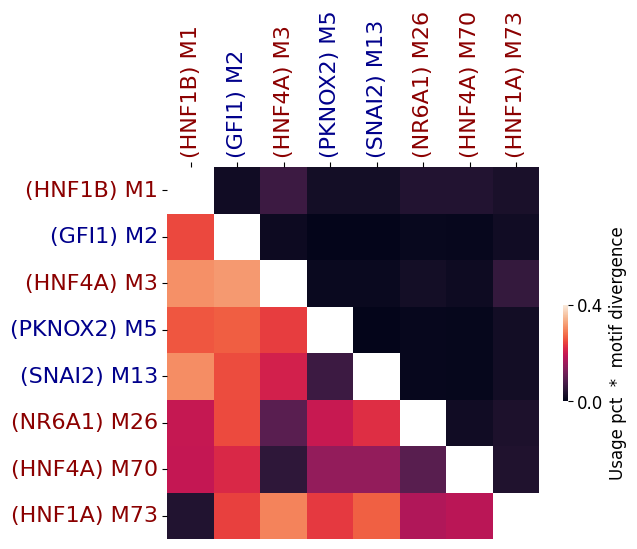

In [ ]:
reduced_ticks = np.arange(0.5, len(top_idxs) + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in top_idxs]

plot_matrix_l = (in_matrix * sorted_coocurrence_1)[np.ix_(top_idxs, top_idxs)]
plot_matrix_u = (in_matrix * sorted_coocurrence_2)[np.ix_(top_idxs, top_idxs)]

mask_u = np.zeros_like(plot_matrix, dtype=bool)
mask_u[np.triu_indices_from(mask)] = True

mask_l = np.zeros_like(plot_matrix, dtype=bool)
mask_l[np.tril_indices_from(mask)] = True

plot_matrix = mask_l * plot_matrix_l + mask_u * plot_matrix_u

#zeros = np.zeros_like(plot_matrix, dtype=bool)
mask = np.eye(len(top_idxs))

max_color = 0.4 #np.round(plot_matrix.max(), 2) #0.45 #np.round(plot_matrix.max(), 2)
figsize = (6, 5)
with plt.style.context('fast'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=max_color, cmap="rocket", mask=mask,
                    cbar_kws={'label': 'Usage pct  *  motif divergence', "shrink": .25, "ticks":[0, max_color]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=16)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=16)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    for ticklabel, tickcolor in zip(plt.gca().get_xticklabels(), reduced_colors):
        ticklabel.set_color(tickcolor)
    for ticklabel, tickcolor in zip(plt.gca().get_yticklabels(), reduced_colors):
        ticklabel.set_color(tickcolor)
    # g.yaxis.tick_right()
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')
    save_path = f'/content/drive/MyDrive/figures/motif_cooccurrence/top50_motif_cooccurrence_corrected_{target_cells[0]}_v3.pdf'
    #plt.savefig(save_path, format='pdf', bbox_inches='tight', transparent=True) #dpi=150,
    #plt.savefig('whatever.pdf', bbox_inches='tight', transparent=True)
    plt.show()

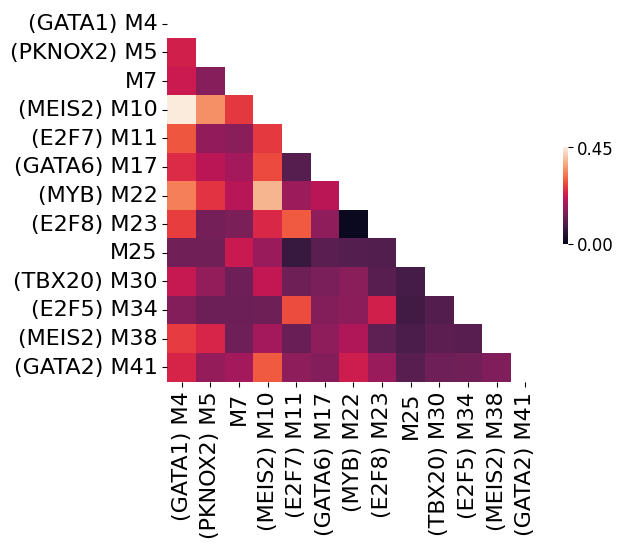

In [ ]:
n_top = 50

plot_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
top_idxs = top_n_indexes(plot_matrix, n_top)
top_idxs = sorted(set([item for t in top_idxs for item in t]))

plot_matrix = plot_matrix[np.ix_(top_idxs, top_idxs)]

reduced_ticks = np.arange(0.5, plot_matrix.shape[0] + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in top_idxs]

mask = np.zeros_like(plot_matrix, dtype=bool)
mask[np.triu_indices_from(mask)] = True

max_color = 0.45 #np.round(plot_matrix.max(), 2)
figsize = (6, 5)
with plt.style.context('default'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=max_color, cmap="rocket", mask=mask,
                    cbar_kws={'label': '', "shrink": .25, "ticks":[0, max_color]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=16)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=16)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    #g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')

    plt.show()

In [ ]:
#--- Co-occurrence difference
motif_list = boda2_streme_tfs['motif_id'].tolist()
ultimate_ids = boda2_streme_tfs['ultimate_id']
target_cells = ['k562', 'hepg2', 'sknsh']

#--- Group 1
methods = ['fsp', 'al', 'sa']
#methods = ['DHS', 'gs']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']
 #['k562', 'hepg2', 'sknsh']
group_df = precise_library_df[precise_library_df['method'].isin(methods) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)

coocurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    for j in range(i+1, num_motifs):
        coocurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        coocurrence_counts[i,j] = len(group_df[coocurrence_filter])
coocurrence_pcts = coocurrence_counts / len(group_df)
coocurrence_pcts = coocurrence_pcts + coocurrence_pcts.T

sorted_coocurrence_1 = coocurrence_pcts #[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

print(len(group_df))

#--- Group 2
#methods = ['fsp', 'al', 'sa']
methods = ['DHS', 'gs']
#methods = ['DHS']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']
group_df = precise_library_df[precise_library_df['method'].isin(methods) & precise_library_df['target_cell'].isin(target_cells)].reset_index(drop=True)

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)

coocurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    for j in range(i+1, num_motifs):
        coocurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        coocurrence_counts[i,j] = len(group_df[coocurrence_filter])
coocurrence_pcts = coocurrence_counts / len(group_df)
coocurrence_pcts = coocurrence_pcts + coocurrence_pcts.T

sorted_coocurrence_2 = coocurrence_pcts #[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

print(len(group_df))

  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

51000


  0%|          | 0/82 [00:00<?, ?it/s]

  0%|          | 0/82 [00:00<?, ?it/s]

24000


In [ ]:
200 / 51000

0.00392156862745098

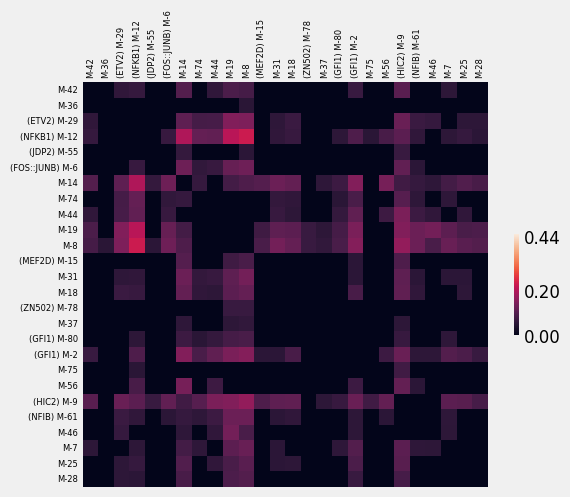

In [ ]:
plot_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
plot_matrix[plot_matrix <= 0.05] = 0

non_zero_rows = np.where(plot_matrix.sum(axis=0) != 0.0)[0]
plot_matrix = plot_matrix[np.ix_(non_zero_rows, non_zero_rows)]

reduced_ticks = np.arange(0.5, plot_matrix.shape[0] + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in non_zero_rows]

figsize = (6, 5)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=0.45, cmap="rocket",
                    cbar_kws={'label': '', "shrink": .25, "ticks":[0, 0.2, 0.44]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=6)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')

    plt.show()

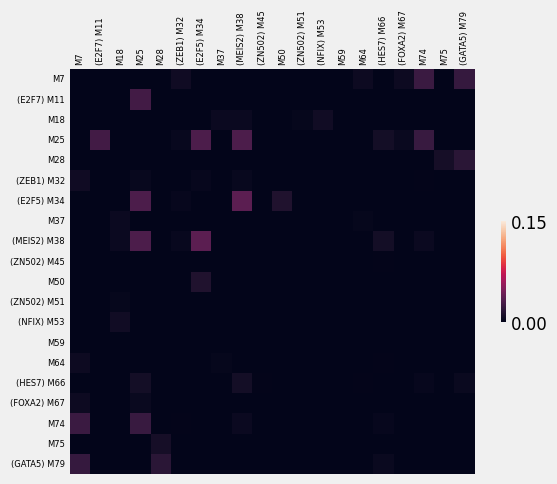

In [ ]:
#plot_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
plot_matrix = fit_data * sorted_coocurrence_1 * ((sorted_coocurrence_2 == 0) & (sorted_coocurrence_1 > 0))
#plot_matrix[(sorted_coocurrence_2 > 0) & (sorted_coocurrence_1 == 0)] = 0

non_zero_rows = np.where(plot_matrix.sum(axis=0) != 0.0)[0]
plot_matrix = plot_matrix[np.ix_(non_zero_rows, non_zero_rows)]

reduced_ticks = np.arange(0.5, plot_matrix.shape[0] + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in non_zero_rows]

figsize = (6, 5)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=0.15, cmap="rocket",
                    cbar_kws={'label': '', "shrink": .25, "ticks":[0, 0.15]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=6)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')

    plt.show()

In [ ]:
min_seqs = 200

condition = (sorted_coocurrence_1 > 100*sorted_coocurrence_2) & (sorted_coocurrence_1 > min_seqs / 51000)
print(np.sum(condition) / 2)

condition = ((sorted_coocurrence_2 == 0) & (sorted_coocurrence_1 > 0)) & (sorted_coocurrence_1 > min_seqs / 51000)
np.sum(condition) / 2

176.0


23.0

In [ ]:
unique_idxs = set(np.where(condition)[0]) | set(np.where(condition)[1])
[(boda2_streme_tfs['ultimate_id'].tolist()[i], boda2_streme_tfs['ultimate_id'].tolist()[j]) for i,j in zip(np.where(condition)[0], np.where(condition)[1])]

[('M7', '(ZEB1) M32'),
 ('M7', 'M64'),
 ('M7', '(FOXA2) M67'),
 ('M7', 'M74'),
 ('M7', '(GATA5) M79'),
 ('(E2F7) M11', 'M25'),
 ('M18', 'M37'),
 ('M18', '(MEIS2) M38'),
 ('M18', '(ZN502) M51'),
 ('M18', '(NFIX) M53'),
 ('M25', '(E2F7) M11'),
 ('M25', '(E2F5) M34'),
 ('M25', '(MEIS2) M38'),
 ('M25', '(HES7) M66'),
 ('M25', '(FOXA2) M67'),
 ('M25', 'M74'),
 ('M28', 'M75'),
 ('M28', '(GATA5) M79'),
 ('(ZEB1) M32', 'M7'),
 ('(ZEB1) M32', '(E2F5) M34'),
 ('(E2F5) M34', 'M25'),
 ('(E2F5) M34', '(ZEB1) M32'),
 ('(E2F5) M34', '(MEIS2) M38'),
 ('(E2F5) M34', 'M50'),
 ('M37', 'M18'),
 ('(MEIS2) M38', 'M18'),
 ('(MEIS2) M38', 'M25'),
 ('(MEIS2) M38', '(E2F5) M34'),
 ('(MEIS2) M38', '(HES7) M66'),
 ('(MEIS2) M38', 'M74'),
 ('M50', '(E2F5) M34'),
 ('(ZN502) M51', 'M18'),
 ('(NFIX) M53', 'M18'),
 ('M64', 'M7'),
 ('(HES7) M66', 'M25'),
 ('(HES7) M66', '(MEIS2) M38'),
 ('(HES7) M66', '(GATA5) M79'),
 ('(FOXA2) M67', 'M7'),
 ('(FOXA2) M67', 'M25'),
 ('M74', 'M7'),
 ('M74', 'M25'),
 ('M74', '(MEIS2) M38

In [ ]:
np.sum(1 * (sorted_coocurrence_1 > 100*sorted_coocurrence_2)) / 2

184.0

In [ ]:
np.sum(1 * (sorted_coocurrence_2 == 0) & (sorted_coocurrence_1 > 0)) / 2

31.0

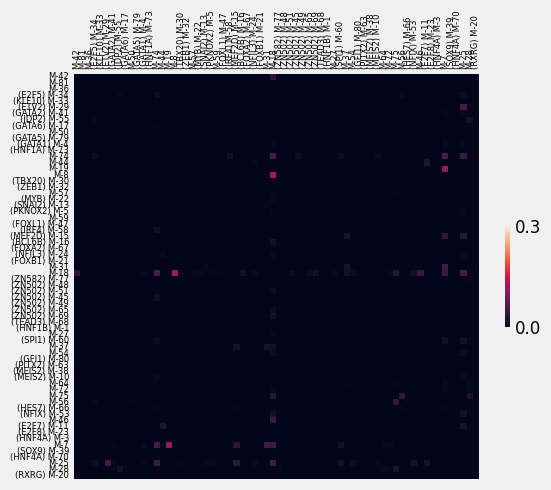

In [ ]:
#plot_matrix = fit_data * (sorted_coocurrence_1 - sorted_coocurrence_2)
#plot_matrix = fit_data * sorted_coocurrence_1 * ((sorted_coocurrence_2 == 0) & (sorted_coocurrence_1 > 0))
plot_matrix = fit_data * sorted_coocurrence_1 #* (sorted_coocurrence_1 >= 5*sorted_coocurrence_2)
plot_matrix[sorted_coocurrence_1 < 100*sorted_coocurrence_2] = 0

non_zero_rows = np.where(plot_matrix.sum(axis=0) != 0.0)[0]
plot_matrix = plot_matrix[np.ix_(non_zero_rows, non_zero_rows)]

reduced_ticks = np.arange(0.5, plot_matrix.shape[0] + 0.5, 1)
reduced_labels = [clustered_motif_labels[j] for j in non_zero_rows]

figsize = (6, 5)
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(plot_matrix, square=True, vmin=0, vmax=0.3, cmap="rocket",
                    cbar_kws={'label': '', "shrink": .25, "ticks":[0, 0.3]})
    plt.xticks(reduced_ticks, labels=reduced_labels, rotation=90, fontsize=6)
    plt.yticks(reduced_ticks, labels=reduced_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    #plt.title('Co-occurrence weighted by motif distance')

    plt.show()
    sorted_coocurrence_1 - sorted_coocurrence_2

# Mutual information

In [ ]:
#--- Co-occurrence
motif_list = boda2_streme_tfs['motif_id'].tolist()
ultimate_ids = boda2_streme_tfs['ultimate_id']

#methods = ['fsp', 'al', 'sa']
methods = ['DHS', 'gs']
#methods = ['DHS', 'gs', 'fsp', 'al', 'sa']
target_cells = ['hepg2'] #['k562', 'hepg2', 'sknsh']
group_df = boda2_df[boda2_df['method'].isin(methods) & boda2_df['target_cell'].isin(target_cells)].reset_index(drop=True)

for motif_id in tqdm(motif_list):
    motif_seq_set = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    seq_filter = group_df['ID'].isin(motif_seq_set)
    group_df[motif_id] = 0
    group_df.loc[seq_filter, motif_id] = 1

group_df.rename(dict(zip(motif_list, ultimate_ids)), axis=1, inplace=True)

  0%|          | 0/82 [00:00<?, ?it/s]

In [ ]:
co_occurrence_counts = np.zeros((num_motifs, num_motifs))
for i in tqdm(range(num_motifs)):
    for j in range(i+1, num_motifs):
        co_occurrence_filter = (group_df[ultimate_ids[i]] == 1) & (group_df[ultimate_ids[j]] == 1)
        co_occurrence_counts[i,j] = len(group_df[co_occurrence_filter])
co_occurrence_pcts = co_occurrence_counts / len(group_df)

occurrence_pcts = group_df[ultimate_ids].sum(axis=0).to_numpy() / len(group_df)

co_occurrence_pcts = (co_occurrence_pcts + co_occurrence_pcts.T) + np.eye(num_motifs) * occurrence_pcts
sorted_coocurrence = co_occurrence_pcts[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

occurrence_pcts = occurrence_pcts.reshape(1, -1)

occurrence_pct_products = np.dot(occurrence_pcts.T, occurrence_pcts)

mutual_information = co_occurrence_pcts / occurrence_pct_products
sorted_mutual_information = mutual_information[np.ix_(clustered_motif_idxs, clustered_motif_idxs)]

  0%|          | 0/82 [00:00<?, ?it/s]

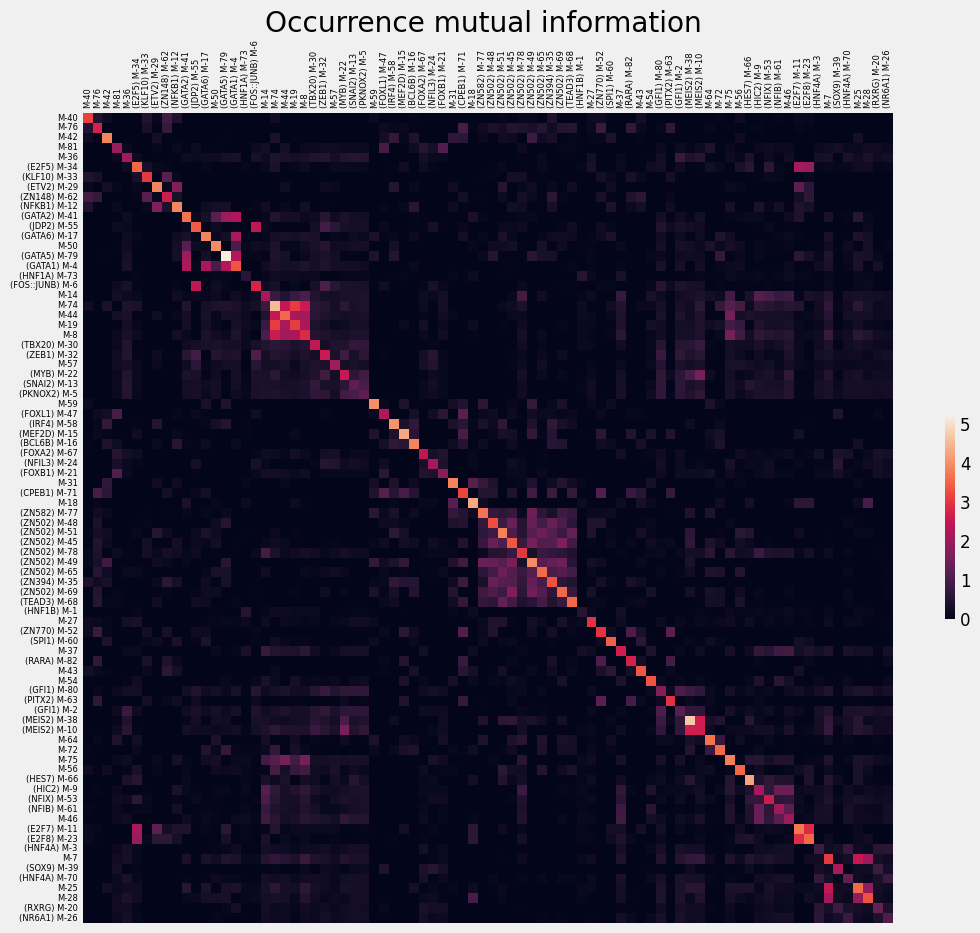

In [ ]:
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(np.log(sorted_mutual_information + 1e-6), square=True, vmin=0, #cmap="viridis",
                    cbar_kws={'label': '', "shrink": .25})
    plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    plt.title('Occurrence mutual information ')

    plt.show()

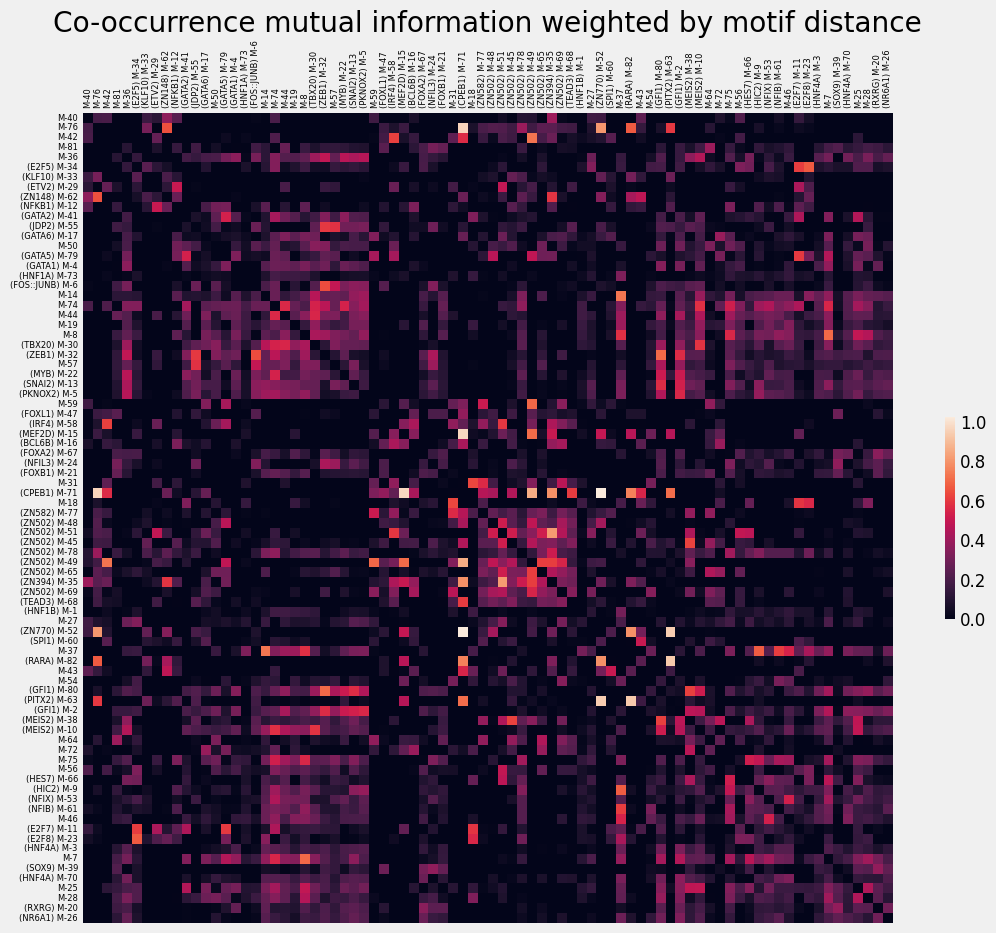

In [ ]:
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=figsize)
    g = sns.heatmap(fit_data * np.log(sorted_mutual_information + 1e-6), square=True, vmin=0, #cmap="viridis",
                    cbar_kws={'label': '', "shrink": .25})
    plt.xticks(all_ticks, labels=clustered_motif_labels, rotation=90, fontsize=6)
    plt.yticks(all_ticks, labels=clustered_motif_labels, rotation=0, fontsize=6)
    g.figure.axes[-1].yaxis.label.set_size(12)
    g.figure.axes[-1].tick_params(labelsize=12)
    g.xaxis.tick_top()
    # g.yaxis.tick_right()
    plt.grid(False)
    plt.title('Co-occurrence mutual information weighted by motif distance')

    plt.show()

# Motif logos

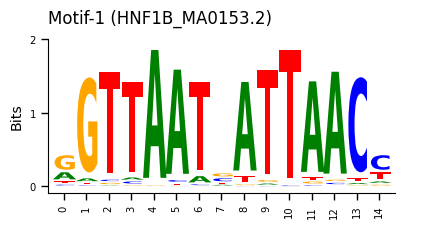

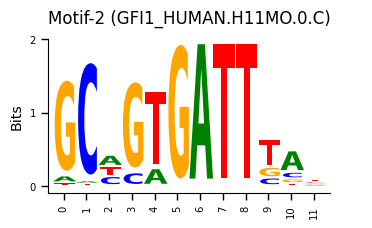

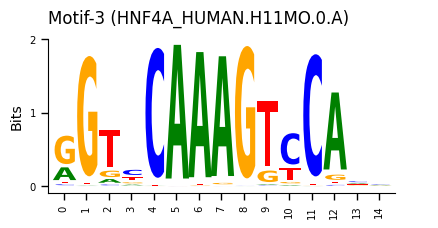

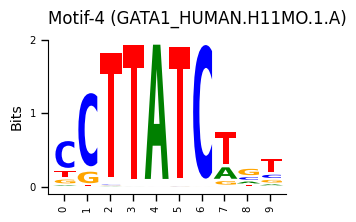

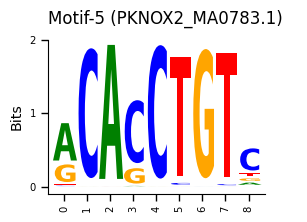

...

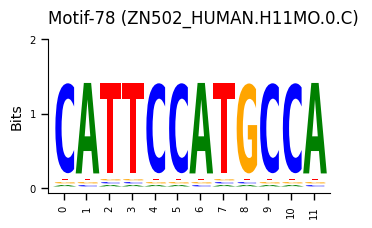

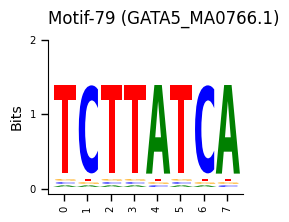

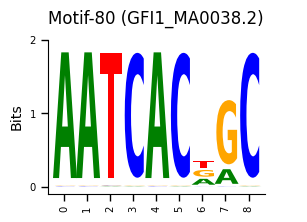

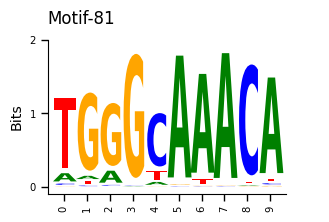

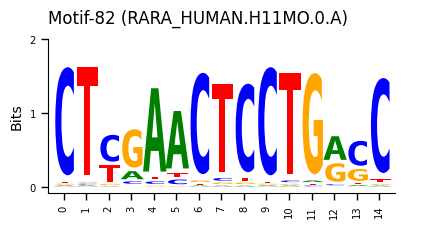

In [ ]:
# for i in range(num_clusters):
#     idxs = np.where(cluster_model.biclusters_[0][i])[0]
#     if len(idxs):
#         print(idxs)
#         for j in sorted(idxs):
for j in range(num_motifs):
    motif_row = boda2_streme_tfs.iloc[j]
    motif_name = motif_row['formal_id']
    motif_icm = torch.tensor(motif_row['icm'])
    matrix_to_dms(motif_icm, y_max=2, fontaspect=.55, widthscale=0.8,
                    axisfontscale=0.6, heightscale=0.8)
    plt.yticks([0,1,2])
    plt.xlabel('')
    plt.ylabel('Bits')
    plt.title(motif_name, y=1.05, loc='left')
    save_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/motif_logos_min8/' + motif_name + '.pdf'
    #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()
        # print('')

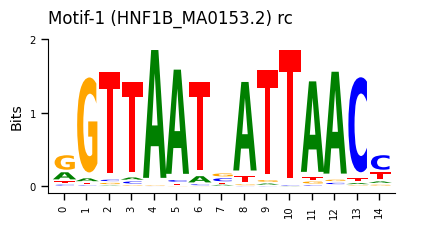

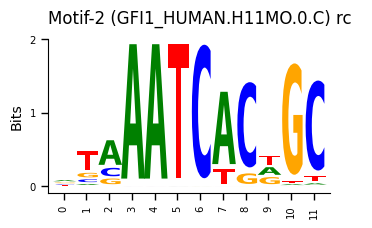

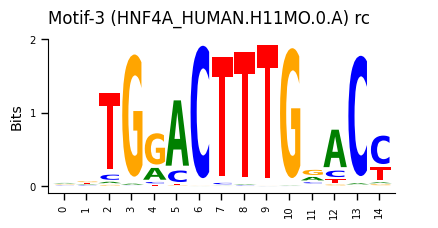

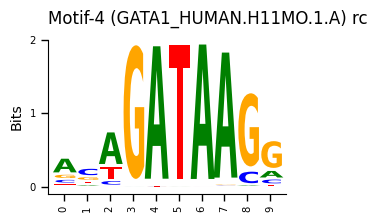

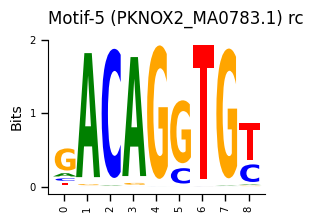

...

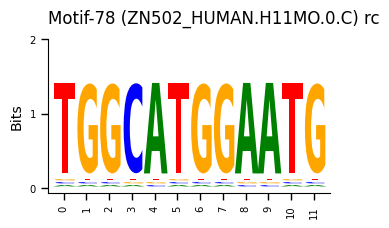

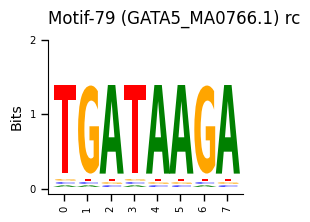

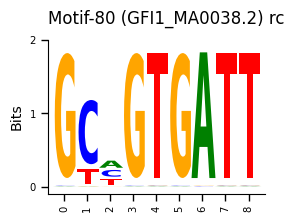

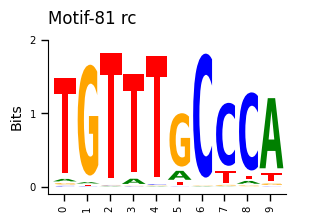

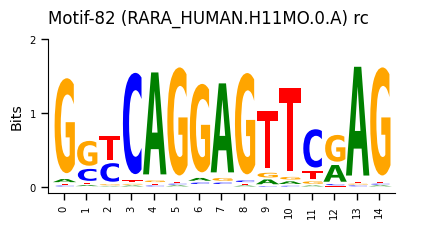

In [ ]:
for j in range(num_motifs):
    motif_row = boda2_streme_tfs.iloc[j]
    motif_name = motif_row['formal_id']
    motif_icm = torch.tensor(motif_row['icm_rc'])
    matrix_to_dms(motif_icm, y_max=2, fontaspect=.55, widthscale=0.8,
                    axisfontscale=0.6, heightscale=0.8)
    plt.yticks([0,1,2])
    plt.xlabel('')
    plt.ylabel('Bits')
    plt.title(f'{motif_name} rc', y=1.05, loc='left')
    save_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/motif_logos_min8/' + motif_name + '_rc.pdf'
    #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()
        # print('')

In [ ]:
num_motifs = len(boda2_streme_tfs)

titles = []
for i in range(num_motifs):
    row = boda2_streme_tfs.iloc[i]
    ultimate_id = row['ultimate_id']
    name_type = len(ultimate_id.split(' '))
    if name_type == 1:
        name = f'M{i+1}' #row['name'].split('-')[1] #row['name'].split('-')[1] #f'motif_{i}' #row['name'].split('-')[1]
        titles.append(name)
    else:
        name = f'M{i+1}' + ' (' + row['short_name_best'] + ')'
        titles.append(name)

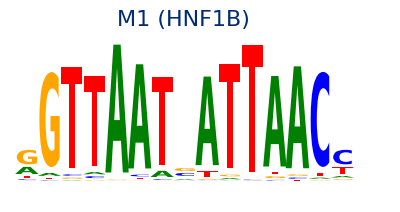

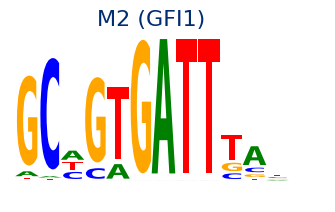

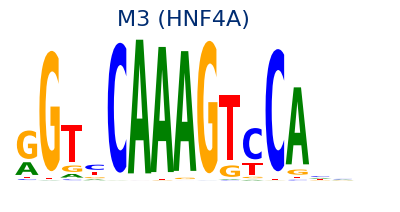

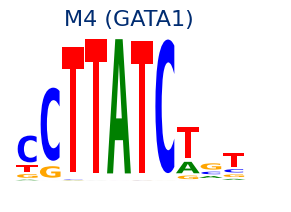

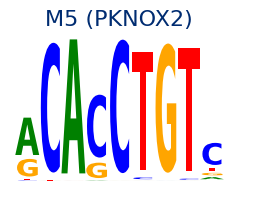

...

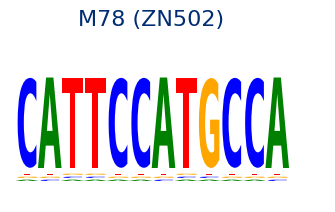

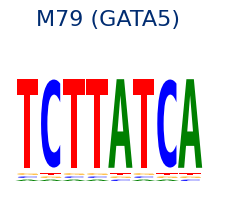

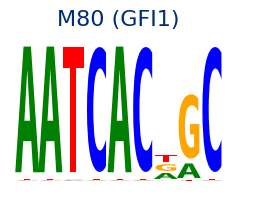

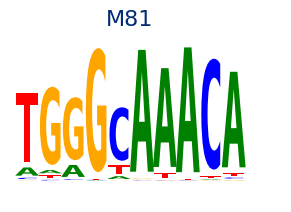

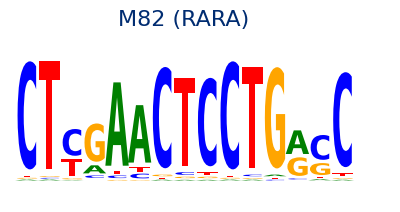

In [ ]:
for j, motif_name in enumerate(titles):
    motif_row = boda2_streme_tfs.iloc[j]
    #motif_name = motif_row['ultimate_id']
    motif_icm = torch.tensor(motif_row['icm'])
    matrix_to_dms(motif_icm, y_max=2, fontaspect=.55, widthscale=0.8,
                    axisfontscale=0.6, heightscale=0.8)
    plt.xticks([])
    plt.yticks([])
    plt.xlabel('')
    plt.ylabel('')
    plt.title(motif_name, fontsize=16, color='#002C71')
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    #plt.title(motif_name, y=1.05, loc='left')
    save_path = '/content/drive/MyDrive/data/BODA2_MPRA/STREME_library_analysis/motif_logos_min8_alt_2/' + motif_name + '.pdf'
    #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()
        # print('')

# Dartboard plots

In [ ]:
words = []
for i in range(num_motifs):
    row = boda2_streme_tfs.iloc[i]
    ultimate_id = row['ultimate_id']
    name_type = len(ultimate_id.split(' '))
    if name_type == 1:
        name = f'M{i+1}' #row['name'].split('-')[1] #row['name'].split('-')[1] #f'motif_{i}' #row['name'].split('-')[1]
        words.append(name)
    else:
        name = row['short_name_best']
        words.append(name)

boda2_streme_tfs['word_id'] = words

In [ ]:
def CustomCmap(from_rgb,to_rgb):
    # from color r,g,b
    r1,g1,b1 = from_rgb
    # to color r,g,b
    r2,g2,b2 = to_rgb
    cdict = {'red': ((0, r1, r1),
                   (1, r2, r2)),
           'green': ((0, g1, g1),
                    (1, g2, g2)),
           'blue': ((0, b1, b1),
                   (1, b2, b2))}
    return mpl.colors.LinearSegmentedColormap('custom_cmap', cdict)



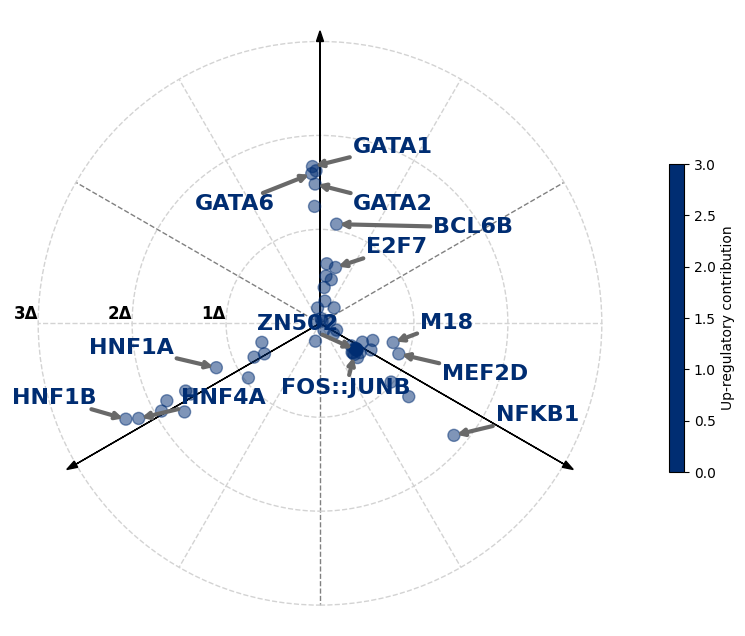

In [ ]:
custom_cmap = CustomCmap(mpl.colors.to_rgb('#002D72'), mpl.colors.to_rgb('#002D72'))

cell_types = ['K562', 'HepG2', 'SKNSH']
contrib_columns = ['contrib_K562', 'contrib_HepG2', 'contrib_SKNSH']

pos_filter = (boda2_streme_tfs[contrib_columns].mean(axis=1) >= 0)
unique_names = boda2_streme_tfs[pos_filter]['ultimate_id'].tolist()
short_names_in_group = boda2_streme_tfs[pos_filter]['word_id'].tolist()

# motifs_to_display = ['(HNF1B) M1',
#                      '(HNF4A) M3',
#                      '(GATA1) M4',
#                      '(FOS::JUNB) M6',
#                      '(NFKB1) M12',
#                      '(GATA6) M17',
#                      ]
motifs_to_display = unique_names[:10]
motifs_to_display += ['(ZN502) M48',
                          '(HNF1A) M73',
                          '(GATA2) M41'
                          ]

point_array = boda2_streme_tfs[pos_filter][contrib_columns].to_numpy()
point_array[unique_names.index('(HNF1B) M1'), 1] = point_array[0, 1] / 2
point_array[unique_names.index('(HNF1A) M73'), 1] = point_array[0, 1] / 2

title=None #'Activators'
axis_labels=None #cell_types
R=3
figsize=(10,8)
min_color=0
max_color=3
cmap=custom_cmap #mpl.cm.get_cmap('winter_r') #mpl.cm.Blues
axis_color='black' #'#002D72' #'black'
soft_guideline_color='lightgrey'
mid_guideline_color='grey'
soft_guideline_stlye='--'
mid_guideline_stlye='--'
soft_guideline_width=1
mid_guideline_width=1
label_padding = 0.5
axis_arrow_head_scale=0.025
axis_label_fontsize=20
title_fontsize=28
title_y = 1.08
colorbar_label='Up-regulatory contribution'
colorbar_aspect=20
colorbar_shrink=0.5
dot_alpha=0.5
rasterized=True
dot_size=300
color_list=None
colorbar=True
inner_radii = None#[0.75, 2]
dot_edgecolor = 'gray'

x1, y1 = R*np.cos(np.deg2rad(30)), R*np.sin(np.deg2rad(30))
floor_R =  np.floor(R)
floor_x1, floor_y1 = floor_R*np.cos(np.deg2rad(30)), floor_R*np.sin(np.deg2rad(30))

fig, ax = plt.subplots(figsize=figsize)
plt.axis('equal')

#--- Get coloring for minimum
if color_list is None:
    #min_color, max_color = point_array.min(axis=1).min(), point_array.min(axis=1).max()
    color_values = point_array.max(axis=1) #point_array.min(axis=1)
    norm = mpl.colors.Normalize(vmin=min_color, vmax=max_color)
    color_list = cmap(color_values)

#--- Remove frame
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

#---Remove ticks
plt.xticks([])
plt.yticks([])

#--- Line guides
ax.plot( [0, 0], [0, -floor_R], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)
ax.plot([0, floor_x1], [0, floor_y1], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)
ax.plot([0, -floor_x1], [0,  floor_y1], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)

ax.plot([0, floor_R], [0, 0], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, -floor_R], [0, 0], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

ax.plot([0, -floor_y1], [0, floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, floor_y1], [0, floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

ax.plot([0, -floor_y1], [0, -floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, floor_y1], [0, -floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

#--- Circles

if not inner_radii:
    inner_radii = np.arange(1, floor_R+1)
for radius in inner_radii:
    ax.add_patch(plt.Circle((0,0), radius, color=soft_guideline_color, fill=False,
                            linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1))

#--- Main axes
ax.arrow(0, 0, 0, R, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)
ax.arrow(0, 0, x1, -y1, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)
ax.arrow(0, 0, -x1, -y1, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)

if axis_labels:
    ax.text(0, R + 0.75*label_padding, axis_labels[0], ha='center', va='center', fontsize=axis_label_fontsize)
    ax.text(-x1 - label_padding, -y1 - label_padding, axis_labels[1], ha='center', va='center', fontsize=axis_label_fontsize)
    ax.text(x1 + label_padding, -y1 - label_padding, axis_labels[2], ha='center', va='center', fontsize=axis_label_fontsize)

#--- Radii labels
for radius in inner_radii:
    ax.text(-radius, 0, f'{int(radius)}\u0394', ha='right', va='bottom', fontsize=12, fontweight='demibold', color='black')

#--- Plot points
shifted_points = point_array - point_array.min(axis=1)[:, None]

Xs = []
Ys = []
for row in range(shifted_points.shape[0]):
    point = shifted_points[row, :]
    min_dim = point.argmin()
    max_dim = point.argmax()

    mid_dim = [0, 1, 2]
    mid_dim.remove(min_dim)
    mid_dim.remove(max_dim)
    mid_dim = mid_dim[0]

    temp_r = point[max_dim]
    temp_theta_shift = 60 * point[mid_dim] / point[max_dim]
    if max_dim == 0:
        if mid_dim == 1:
            temp_theta = 90 + temp_theta_shift
        elif mid_dim == 2:
            temp_theta = 90 - temp_theta_shift
    elif max_dim == 1:
        if mid_dim == 0:
            temp_theta = 210 - temp_theta_shift
        elif mid_dim == 2:
            temp_theta = 210 + temp_theta_shift
    elif max_dim == 2:
        if mid_dim == 1:
            temp_theta = 330 - temp_theta_shift
        elif mid_dim == 0:
            temp_theta = -30 + temp_theta_shift

    temp_x = temp_r * np.cos(np.deg2rad(temp_theta))
    temp_y = temp_r * np.sin(np.deg2rad(temp_theta))
    Xs.append(temp_x)
    Ys.append(temp_y)

ax.scatter(Xs, Ys, color=color_list, alpha=dot_alpha, marker='.', rasterized=rasterized, zorder=2, s=dot_size)
if title:
    plt.title(title, fontsize=title_fontsize, y=title_y)

#--- Plot colorbar
if colorbar:
    cax, cbar_kwds = mpl.colorbar.make_axes(ax, location = 'right',
                              fraction=0.15, shrink=colorbar_shrink, aspect=colorbar_aspect)
    cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm, orientation='vertical')
    if colorbar_label:
        cb.set_label(colorbar_label)

TEXTS = []
for text in motifs_to_display:
    i = unique_names.index(text)
    print_text = short_names_in_group[i]
    x = Xs[i]
    y = Ys[i]
    c = '#002D72' #'#0085CA' #'#002D72' #display_dict[text]
    txt_to_append = ax.text(x, y, print_text, color=c, fontsize=16, fontweight='bold')
    #txt_to_append.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='dimgray')])
    TEXTS.append(txt_to_append)

adjust_text(
    TEXTS,
    expand_points=(2, 2),
    arrowprops=dict(
        arrowstyle="->",
        color='dimgray', #GREY50,
        lw=3,
        alpha=1
    ),
    ax=fig.axes[0]
)
#plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
plt.show()

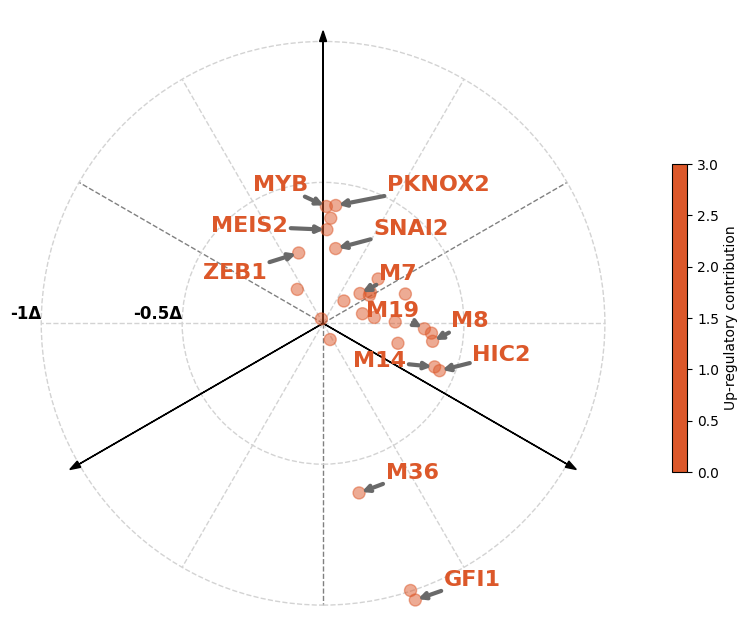

In [ ]:
custom_cmap = CustomCmap(mpl.colors.to_rgb('#DC582A'), mpl.colors.to_rgb('#DC582A'))

cell_types = ['K562', 'HepG2', 'SKNSH']
contrib_columns = ['contrib_K562', 'contrib_HepG2', 'contrib_SKNSH']

pos_filter = (boda2_streme_tfs[contrib_columns].mean(axis=1) < 0)
unique_names = boda2_streme_tfs[pos_filter]['ultimate_id'].tolist()
short_names_in_group = boda2_streme_tfs[pos_filter]['word_id'].tolist()

# motifs_to_display = ['(HNF1B) M1',
#                      '(HNF4A) M3',
#                      '(GATA1) M4',
#                      '(FOS::JUNB) M6',
#                      '(NFKB1) M12',
#                      '(GATA6) M17',
#                      ]
motifs_to_display = unique_names[:10]
motifs_to_display += ['(ZEB1) M32',
                      'M36',
                          ]

point_array = boda2_streme_tfs[pos_filter][contrib_columns].to_numpy()

title=None #'Activators'
axis_labels=None #cell_types
R=1
figsize=(10,8)
min_color=0
max_color=3
cmap=custom_cmap #mpl.cm.get_cmap('winter_r') #mpl.cm.Blues
axis_color='black' #'#002D72' #'black'
soft_guideline_color='lightgrey'
mid_guideline_color='grey'
soft_guideline_stlye='--'
mid_guideline_stlye='--'
soft_guideline_width=1
mid_guideline_width=1
label_padding = 0.5
axis_arrow_head_scale=0.025
axis_label_fontsize=20
title_fontsize=28
title_y = 1.08
colorbar_label='Up-regulatory contribution'
colorbar_aspect=20
colorbar_shrink=0.5
dot_alpha=0.5
rasterized=True
dot_size=300
color_list=None
colorbar=True
inner_radii = [0.5, 1]
dot_edgecolor = 'gray'

x1, y1 = R*np.cos(np.deg2rad(30)), R*np.sin(np.deg2rad(30))
floor_R =  np.floor(R)
floor_x1, floor_y1 = floor_R*np.cos(np.deg2rad(30)), floor_R*np.sin(np.deg2rad(30))

fig, ax = plt.subplots(figsize=figsize)
plt.axis('equal')

#--- Get coloring for minimum
if color_list is None:
    #min_color, max_color = point_array.min(axis=1).min(), point_array.min(axis=1).max()
    color_values = point_array.max(axis=1) #point_array.min(axis=1)
    norm = mpl.colors.Normalize(vmin=min_color, vmax=max_color)
    color_list = cmap(color_values)

#--- Remove frame
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

#---Remove ticks
plt.xticks([])
plt.yticks([])

#--- Line guides
ax.plot( [0, 0], [0, -floor_R], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)
ax.plot([0, floor_x1], [0, floor_y1], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)
ax.plot([0, -floor_x1], [0,  floor_y1], color=mid_guideline_color, linestyle=mid_guideline_stlye, linewidth=mid_guideline_width, zorder=1)

ax.plot([0, floor_R], [0, 0], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, -floor_R], [0, 0], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

ax.plot([0, -floor_y1], [0, floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, floor_y1], [0, floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

ax.plot([0, -floor_y1], [0, -floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)
ax.plot([0, floor_y1], [0, -floor_x1], color=soft_guideline_color, linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1)

#--- Circles

if not inner_radii:
    inner_radii = np.arange(1, floor_R+1)
for radius in inner_radii:
    ax.add_patch(plt.Circle((0,0), radius, color=soft_guideline_color, fill=False,
                            linestyle=soft_guideline_stlye, linewidth=soft_guideline_width, zorder=1))

#--- Main axes
ax.arrow(0, 0, 0, R, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)
ax.arrow(0, 0, x1, -y1, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)
ax.arrow(0, 0, -x1, -y1, color=axis_color, shape='full', head_width=axis_arrow_head_scale * R, zorder=2)

if axis_labels:
    ax.text(0, R + 0.75*label_padding, axis_labels[0], ha='center', va='center', fontsize=axis_label_fontsize)
    ax.text(-x1 - label_padding, -y1 - label_padding, axis_labels[1], ha='center', va='center', fontsize=axis_label_fontsize)
    ax.text(x1 + label_padding, -y1 - label_padding, axis_labels[2], ha='center', va='center', fontsize=axis_label_fontsize)

# #--- Radii labels
for radius in inner_radii:
    ax.text(-radius, 0, f'-{radius}\u0394', ha='right', va='bottom', fontsize=12, fontweight='demibold', color='black')

#--- Plot points
shifted_points = point_array - point_array.min(axis=1)[:, None]

Xs = []
Ys = []
for row in range(shifted_points.shape[0]):
    point = shifted_points[row, :]
    min_dim = point.argmin()
    max_dim = point.argmax()

    mid_dim = [0, 1, 2]
    mid_dim.remove(min_dim)
    mid_dim.remove(max_dim)
    mid_dim = mid_dim[0]

    temp_r = point[max_dim]
    temp_theta_shift = 60 * point[mid_dim] / point[max_dim]
    if max_dim == 0:
        if mid_dim == 1:
            temp_theta = 90 + temp_theta_shift
        elif mid_dim == 2:
            temp_theta = 90 - temp_theta_shift
    elif max_dim == 1:
        if mid_dim == 0:
            temp_theta = 210 - temp_theta_shift
        elif mid_dim == 2:
            temp_theta = 210 + temp_theta_shift
    elif max_dim == 2:
        if mid_dim == 1:
            temp_theta = 330 - temp_theta_shift
        elif mid_dim == 0:
            temp_theta = -30 + temp_theta_shift

    temp_x = temp_r * np.cos(np.deg2rad(temp_theta))
    temp_y = temp_r * np.sin(np.deg2rad(temp_theta))
    Xs.append(temp_x)
    Ys.append(temp_y)

ax.scatter(Xs, Ys, color=color_list, alpha=dot_alpha, marker='.', rasterized=rasterized, zorder=2, s=dot_size)
if title:
    plt.title(title, fontsize=title_fontsize, y=title_y)

#--- Plot colorbar
if colorbar:
    cax, cbar_kwds = mpl.colorbar.make_axes(ax, location = 'right',
                              fraction=0.15, shrink=colorbar_shrink, aspect=colorbar_aspect)
    cb = mpl.colorbar.ColorbarBase(cax, cmap=cmap, norm=norm, orientation='vertical')
    if colorbar_label:
        cb.set_label(colorbar_label)

TEXTS = []
for text in motifs_to_display:
    i = unique_names.index(text)
    print_text = short_names_in_group[i]
    x = Xs[i]
    y = Ys[i]
    c = '#DC582A' #'#8A1B61' #'#0085CA' #'#002D72' #display_dict[text]
    txt_to_append = ax.text(x, y, print_text, color=c, fontsize=16, fontweight='bold')
    #txt_to_append.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='dimgray')])
    TEXTS.append(txt_to_append)

adjust_text(
    TEXTS,
    expand_points=(2, 2),
    arrowprops=dict(
        arrowstyle="->",
        color='dimgray', #GREY50,
        lw=3,
        alpha=1
    ),
    ax=fig.axes[0]
)
#plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
plt.show()

# Sequence examples (run till word clouds first)

In [ ]:
selected_ids = ['20211212_75659__621411__391::fsp__sknsh__0', #N5 #BODA_SKNSH_Test1
                '20211206_24503__33072627__1223::al__hepg2__0', #L2

                '20211212_45907__313665__213::fsp__hepg2__0', #BODA_HEPG2_Test1
                '20211212_61436__944763__262::fsp__hepg2__0', #BODA_HEPG2_Test2
                '20211207_212124__46481152__2927::al__sknsh__0', #N3 #BODA_SKNSH_Test2
                '20211207_152258__777391__191::sa__sknsh__0', #N2
                '20211207_212124__46481152__3404::al__sknsh__0', #N4
                '20211206_24503__33072627__1816::al__hepg2__0', #L3
                '20211207_100944__255626__132::sa__hepg2__0', #L4

                '20211207_63610__124703__1517::sa__hepg2__0', #?
                '20211207_212124__46481152__3727::al__sknsh__0', #L?

                '20211212_55149__346635__38::fsp__hepg2__0',
                '20211212_52639__969454__182::fsp__hepg2__0',
                '20211212_12620__229779__1223::fsp__hepg2__0',
                '20211212_55149__346635__486::fsp__hepg2__0',
                '20211212_55149__346635__150::fsp__hepg2__0',
                '20211212_52639__969454__185::fsp__hepg2__0',
                '20211212_12620__229779__1181::fsp__hepg2__0',
                '20211212_12620__229779__56::fsp__hepg2__0',
                ]

cell_colors = ['#00A79D', '#FBB040', '#ED1C24']

motif_short_names_dict = dict(zip(boda2_streme_tfs['motif_id'], boda2_streme_tfs['ultimate_id']))

cm = plt.get_cmap('gist_rainbow')
#cm = plt.get_cmap('tab20b')
color_dict = dict(zip(boda2_streme_tfs['motif_id'], [cm(1.*i/len(boda2_streme_tfs)) for i in range(len(boda2_streme_tfs))]))

for single_seq_id in selected_ids:
    print(single_seq_id)
    #--- Get sequence and contributions
    single_seq_df = no_controls_df[no_controls_df['ID'] == single_seq_id]
    test_str = single_seq_df['sequence'].item()
    test_onehot = utils.dna2tensor(test_str).view(4,-1)
    seq_contribution_tensor = torch.stack([str2tensor(single_seq_df[contribution_column].item()).repeat(4,1) * test_onehot for contribution_column in contribution_columns])

    #--- Get FIMO hits
    seq_scan_df = fimo_df[fimo_df['sequence_name'] == single_seq_id].sort_values('start')[:-1]
    seq_scan_df = seq_scan_df[~seq_scan_df[['motif_id', 'start', 'stop']].duplicated()]
    print(single_seq_df[['K562_signal', 'HepG2_signal', 'SKNSH_signal']])
    print(single_seq_df[['K562_pred_aggreg', 'HepG2_pred_aggreg', 'SKNSH_pred_aggreg']])

    find_motif_names  = []
    motifs_start_ends = []
    orientations      = []
    num_hits = len(seq_scan_df)
    for i in range(num_hits):
        hit_row = seq_scan_df.iloc[i]
        m_start, m_end = int(hit_row['start'] - 1), int(hit_row['stop'])
        motif_range = set(np.arange(m_start, m_end))
        find_motif_names.append(hit_row['motif_id'])
        motifs_start_ends.append((m_start, m_end))
        orientations.append(hit_row['strand'])

    #--- Plot logo and FIMO hits
    fig, ax = matrix_to_dms(test_onehot, y_max=2, colors=['green','blue','orange','red'], \
                            fontaspect=0.5, widthscale=0.3, axisfontscale=0.6, heightscale=0.25)

    y_bottom = 0.8
    y_top = 1.5
    for idx, motif_name in enumerate(find_motif_names):
        color = color_dict[motif_name]
        noised_y_top = y_top + 0.5 * float(np.random.rand(1))
        plt.vlines(motifs_start_ends[idx][0], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        plt.vlines(motifs_start_ends[idx][1], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        #plt.hlines(y_bottom, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)
        plt.hlines(noised_y_top, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)

        text = f'{motif_short_names_dict[motif_name]}{orientations[idx]}'
        x = motifs_start_ends[idx][0]
        #x = int(0.5 * (motifs_start_ends[idx][0] + motifs_start_ends[idx][1]) + np.random.rand(1))
        y = noised_y_top + 0.5
        plt.text(x, y, text, fontsize=10, rotation=90)

    # plt.axis('off')
    ax.spines['bottom'].set_position(('outward', 15))
    plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12, y=-0.2, rotation=0)
    #ax.tick_params(axis='x', which='major', pad=10, length=0)
    plt.xlabel('')
    #ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.margins(x=0)
    save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_hits.pdf'
    plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()

    #--- Plot contribution tracks
    contrib_tracks = seq_contribution_tensor.sum(dim=1).numpy()
    with plt.style.context('fast'):
        plt.figure(figsize=(21.1, 1))
        for i in range(3):
            ysmoothed = gaussian_filter1d(contrib_tracks[i,:], sigma=0.75)
            plt.plot(ysmoothed, color=cell_colors[i], linewidth=2)
        plt.hlines(0, 0, 200, linestyles='dashed', colors='grey', linewidth=1.0)
        plt.margins(x=0)
        plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12)
        plt.yticks([])
        for spine in plt.gca().spines.values():
            spine.set_visible(False)
        #plt.axis('off')
        save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_contributions.pdf'
        #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
        plt.show()


    print(contrib_tracks.sum(axis=-1).tolist())
    print('')

Output hidden; open in https://colab.research.google.com to view.

20211212_52639__969454__185::fsp__hepg2__0
       K562_signal  HepG2_signal  SKNSH_signal
66454    -0.787379      5.526433     -2.181965
       K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
66454         -0.751453          10.927252          -0.877665


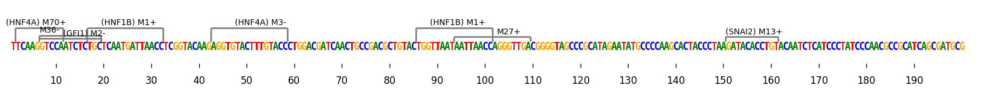

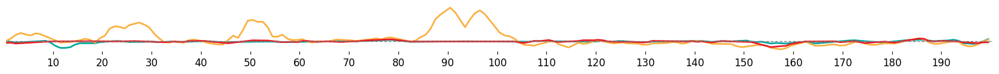

[-1.3003222942352295, 10.88323974609375, -1.1714189052581787]



In [ ]:
selected_ids = [
                '20211212_52639__969454__185::fsp__hepg2__0',
                ]

cell_colors = ['#00A79D', '#FBB040', '#ED1C24']

motif_short_names_dict = dict(zip(boda2_streme_tfs['motif_id'], boda2_streme_tfs['ultimate_id']))

cm = plt.get_cmap('gist_rainbow')
#cm = plt.get_cmap('tab20b')
color_dict = dict(zip(boda2_streme_tfs['motif_id'], [cm(1.*i/len(boda2_streme_tfs)) for i in range(len(boda2_streme_tfs))]))

for single_seq_id in selected_ids:
    print(single_seq_id)
    #--- Get sequence and contributions
    single_seq_df = no_controls_df[no_controls_df['ID'] == single_seq_id]
    test_str = single_seq_df['sequence'].item()
    test_onehot = utils.dna2tensor(test_str).view(4,-1)
    seq_contribution_tensor = torch.stack([str2tensor(single_seq_df[contribution_column].item()).repeat(4,1) * test_onehot for contribution_column in contribution_columns])

    #--- Get FIMO hits
    seq_scan_df = fimo_df[fimo_df['sequence_name'] == single_seq_id].sort_values('start')[:-1]
    seq_scan_df = seq_scan_df[~seq_scan_df[['motif_id', 'start', 'stop']].duplicated()]
    #seq_scan_df = seq_scan_df[seq_scan_df['motif_id'] != '73-GTTAATGATTAA']
    #seq_scan_df = seq_scan_df[seq_scan_df['motif_id'] != '36-GCACAGATTKSA']

    print(single_seq_df[['K562_signal', 'HepG2_signal', 'SKNSH_signal']])
    print(single_seq_df[['K562_pred_aggreg', 'HepG2_pred_aggreg', 'SKNSH_pred_aggreg']])

    find_motif_names  = []
    motifs_start_ends = []
    orientations      = []
    num_hits = len(seq_scan_df)
    for i in range(num_hits):
        hit_row = seq_scan_df.iloc[i]
        m_start, m_end = int(hit_row['start'] - 1), int(hit_row['stop'])
        motif_range = set(np.arange(m_start, m_end))
        find_motif_names.append(hit_row['motif_id'])
        motifs_start_ends.append((m_start, m_end))
        orientations.append(hit_row['strand'])

    #--- Plot logo and FIMO hits
    fig, ax = matrix_to_dms(test_onehot, y_max=3, colors=['green','blue','orange','red'], \
                            fontaspect=0.5, widthscale=0.3, axisfontscale=0.6, heightscale=0.25)

    y_bottom = 1
    y_top = 1.5
    for idx, motif_name in enumerate(find_motif_names):
        color = 'gray' #color_dict[motif_name]
        noised_y_top = y_top + 0.5 * float(np.random.rand(1))
        noised_x = motifs_start_ends[idx][0]

        if motif_name == '1-RGTTAATSATTAACY':
            noised_y_top = 2.5
            noised_x = motifs_start_ends[idx][0] + 3
        elif motif_name == '27-ATCAACCCGAGTGGA':
            noised_y_top = 1.5
            noised_x = motifs_start_ends[idx][0] + 9
        elif motif_name == '2-GCHGTGATTTAY':
            noised_y_top = 1.3
            noised_x = motifs_start_ends[idx][0] + 5
        elif motif_name == '70-CAAAGTCCA':
            noised_y_top = 2.5
            noised_x = motifs_start_ends[idx][0] + -2
        elif motif_name == '3-GGTYCAAAGTCCAHH':
            noised_y_top = 2.5
            noised_x = motifs_start_ends[idx][0] + 5
        elif motif_name == '13-DTGCACCTGC':
            noised_y_top = 1.5
            noised_x = motifs_start_ends[idx][0] + 0

        plt.vlines(motifs_start_ends[idx][0], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        plt.vlines(motifs_start_ends[idx][1], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        #plt.hlines(y_bottom, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)
        plt.hlines(noised_y_top, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)

        text = f'{motif_short_names_dict[motif_name]}{orientations[idx]}'
        x = motifs_start_ends[idx][0]
        #x = int(0.5 * (motifs_start_ends[idx][0] + motifs_start_ends[idx][1]) + np.random.rand(1))
        y = noised_y_top + 0.3
        #plt.text(x, y, text, fontsize=10, rotation=90)
        plt.text(noised_x, y, text, fontsize=10, rotation=0)

    # plt.axis('off')
    ax.spines['bottom'].set_position(('outward', 15))
    plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12, y=-0.2, rotation=0)
    #ax.tick_params(axis='x', which='major', pad=10, length=0)
    plt.xlabel('')
    #ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.margins(x=0)
    save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_hits_fig3.pdf'
    #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()

    #--- Plot contribution tracks
    contrib_tracks = seq_contribution_tensor.sum(dim=1).numpy()
    with plt.style.context('fast'):
        plt.figure(figsize=(21.1, 1))
        for i in range(3):
            ysmoothed = gaussian_filter1d(contrib_tracks[i,:], sigma=0.75)
            plt.plot(ysmoothed, color=cell_colors[i], linewidth=2)
        plt.hlines(0, 0, 200, linestyles='dashed', colors='grey', linewidth=1.0)
        plt.margins(x=0)
        plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12)
        plt.yticks([])
        for spine in plt.gca().spines.values():
            spine.set_visible(False)
        #plt.axis('off')
        save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_contributions_fig3.pdf'
        #plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
        plt.show()


    print(contrib_tracks.sum(axis=-1).tolist())
    print('')

20211206_24503__33072627__1223::al__hepg2__0
      K562_signal  HepG2_signal  SKNSH_signal
4047    -0.640067      4.536725     -1.210069
      K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
4047         -1.473612           3.897686          -1.561373


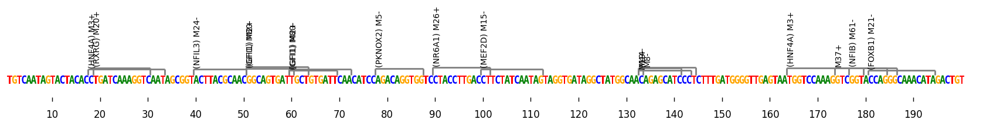

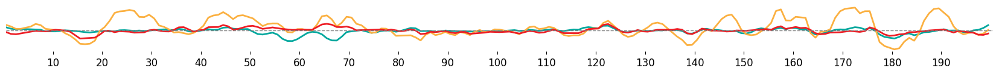

[-1.7438488006591797, 5.721625328063965, -1.0920780897140503]

20211206_24503__33072627__1816::al__hepg2__0
      K562_signal  HepG2_signal  SKNSH_signal
4673    -1.265041      4.496574     -1.623743
      K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
4673         -1.687145           4.563019          -1.542181


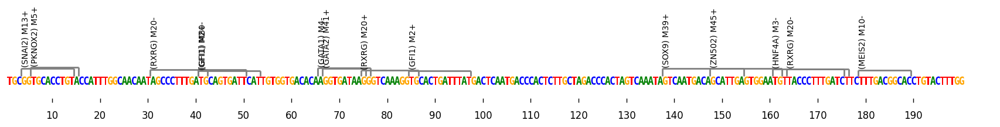

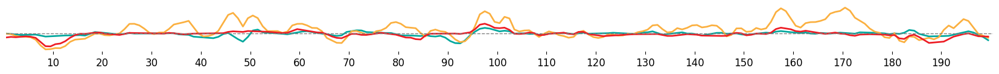

[-1.1678022146224976, 7.470920562744141, -2.0641098022460938]

20211207_100944__255626__132::sa__hepg2__0
      K562_signal  HepG2_signal  SKNSH_signal
9545    -0.686803      6.034644     -1.087801
      K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
9545          -0.74098           6.233065          -0.691755


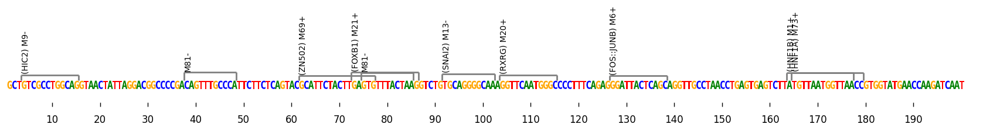

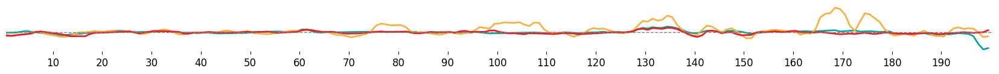

[-0.5468612909317017, 6.61850118637085, -1.5503711700439453]

20211212_75659__621411__391::fsp__sknsh__0
       K562_signal  HepG2_signal  SKNSH_signal
73683    -0.866327     -0.314954      4.515997
       K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
73683         -1.135667          -0.072624           4.762061


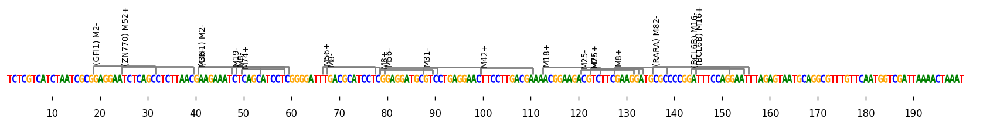

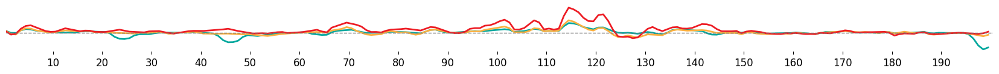

[0.8224451541900635, 2.609685182571411, 12.559229850769043]

20211207_212124__46481152__2927::al__sknsh__0
       K562_signal  HepG2_signal  SKNSH_signal
27660    -0.356682     -0.227919      2.857992
       K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
27660         -0.757103          -0.760395           4.194355


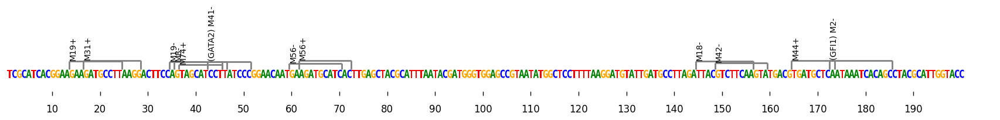

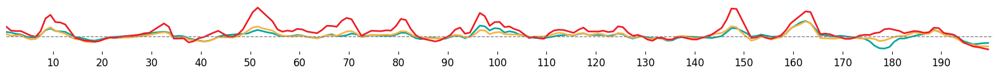

[2.2866368293762207, 1.8068938255310059, 13.448846817016602]

20211207_152258__777391__191::sa__sknsh__0
       K562_signal  HepG2_signal  SKNSH_signal
15279    -0.426725     -0.114046      3.615757
       K562_pred_aggreg  HepG2_pred_aggreg  SKNSH_pred_aggreg
15279          -0.79163          -0.441454           4.862652


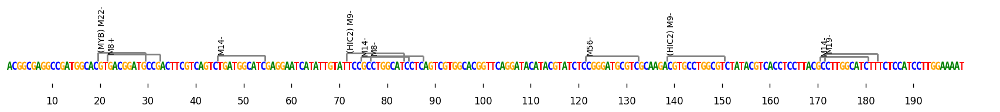

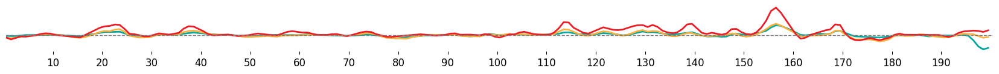

[1.8823604583740234, 2.061509132385254, 12.638376235961914]



In [ ]:
selected_ids = [
                '20211206_24503__33072627__1223::al__hepg2__0','20211206_24503__33072627__1816::al__hepg2__0','20211207_100944__255626__132::sa__hepg2__0',
                '20211212_75659__621411__391::fsp__sknsh__0','20211207_212124__46481152__2927::al__sknsh__0','20211207_152258__777391__191::sa__sknsh__0'
                ]

cell_colors = ['#00A79D', '#FBB040', '#ED1C24']

motif_short_names_dict = dict(zip(boda2_streme_tfs['motif_id'], boda2_streme_tfs['ultimate_id']))

cm = plt.get_cmap('gist_rainbow')
#cm = plt.get_cmap('tab20b')
color_dict = dict(zip(boda2_streme_tfs['motif_id'], [cm(1.*i/len(boda2_streme_tfs)) for i in range(len(boda2_streme_tfs))]))

for single_seq_id in selected_ids:
    print(single_seq_id)
    #--- Get sequence and contributions
    single_seq_df = no_controls_df[no_controls_df['ID'] == single_seq_id]
    test_str = single_seq_df['sequence'].item()
    test_onehot = utils.dna2tensor(test_str).view(4,-1)
    seq_contribution_tensor = torch.stack([str2tensor(single_seq_df[contribution_column].item()).repeat(4,1) * test_onehot for contribution_column in contribution_columns])

    #--- Get FIMO hits
    seq_scan_df = fimo_df[fimo_df['sequence_name'] == single_seq_id].sort_values('start')[:-1]
    seq_scan_df = seq_scan_df[~seq_scan_df[['motif_id', 'start', 'stop']].duplicated()]
    # seq_scan_df = seq_scan_df[seq_scan_df['motif_id'] != '73-GTTAATGATTAA']
    # seq_scan_df = seq_scan_df[seq_scan_df['motif_id'] != '36-GCACAGATTKSA']

    print(single_seq_df[['K562_signal', 'HepG2_signal', 'SKNSH_signal']])
    print(single_seq_df[['K562_pred_aggreg', 'HepG2_pred_aggreg', 'SKNSH_pred_aggreg']])

    find_motif_names  = []
    motifs_start_ends = []
    orientations      = []
    num_hits = len(seq_scan_df)
    for i in range(num_hits):
        hit_row = seq_scan_df.iloc[i]
        m_start, m_end = int(hit_row['start'] - 1), int(hit_row['stop'])
        motif_range = set(np.arange(m_start, m_end))
        find_motif_names.append(hit_row['motif_id'])
        motifs_start_ends.append((m_start, m_end))
        orientations.append(hit_row['strand'])

    #--- Plot logo and FIMO hits
    fig, ax = matrix_to_dms(test_onehot, y_max=3, colors=['green','blue','orange','red'], \
                            fontaspect=0.5, widthscale=0.3, axisfontscale=0.6, heightscale=0.25)

    y_bottom = 1
    y_top = 1.5
    for idx, motif_name in enumerate(find_motif_names):
        color = 'gray' #color_dict[motif_name]
        noised_y_top = y_top + 0.5 * float(np.random.rand(1))
        noised_x = motifs_start_ends[idx][0]

        # if motif_name == '1-RGTTAATSATTAACY':
        #     noised_y_top = 2.5
        #     noised_x = motifs_start_ends[idx][0] + 3
        # elif motif_name == '27-ATCAACCCGAGTGGA':
        #     noised_y_top = 1.5
        #     noised_x = motifs_start_ends[idx][0] + 9
        # elif motif_name == '2-GCHGTGATTTAY':
        #     noised_y_top = 1.3
        #     noised_x = motifs_start_ends[idx][0] + 5
        # elif motif_name == '70-CAAAGTCCA':
        #     noised_y_top = 2.5
        #     noised_x = motifs_start_ends[idx][0] + -2
        # elif motif_name == '3-GGTYCAAAGTCCAHH':
        #     noised_y_top = 2.5
        #     noised_x = motifs_start_ends[idx][0] + 5
        # elif motif_name == '13-DTGCACCTGC':
        #     noised_y_top = 1.5
        #     noised_x = motifs_start_ends[idx][0] + 0

        plt.vlines(motifs_start_ends[idx][0], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        plt.vlines(motifs_start_ends[idx][1], y_bottom, noised_y_top, linestyles='solid', colors=color, linewidth=2.0)
        #plt.hlines(y_bottom, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)
        plt.hlines(noised_y_top, motifs_start_ends[idx][0], motifs_start_ends[idx][1], linestyles='solid', colors=color, linewidth=2.0)

        text = f'{motif_short_names_dict[motif_name]}{orientations[idx]}'
        x = motifs_start_ends[idx][0]
        #x = int(0.5 * (motifs_start_ends[idx][0] + motifs_start_ends[idx][1]) + np.random.rand(1))
        y = noised_y_top + 0.3
        #plt.text(x, y, text, fontsize=10, rotation=90)
        plt.text(noised_x, y, text, fontsize=10, rotation=90)

    # plt.axis('off')
    ax.spines['bottom'].set_position(('outward', 15))
    plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12, y=-0.2, rotation=0)
    #ax.tick_params(axis='x', which='major', pad=10, length=0)
    plt.xlabel('')
    #ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.margins(x=0)
    save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_hits_supfig52.pdf'
    plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
    plt.show()

    #--- Plot contribution tracks
    contrib_tracks = seq_contribution_tensor.sum(dim=1).numpy()
    with plt.style.context('fast'):
        plt.figure(figsize=(21.1, 1))
        for i in range(3):
            ysmoothed = gaussian_filter1d(contrib_tracks[i,:], sigma=0.75)
            plt.plot(ysmoothed, color=cell_colors[i], linewidth=2)
        plt.hlines(0, 0, 200, linestyles='dashed', colors='grey', linewidth=1.0)
        plt.margins(x=0)
        plt.xticks(np.arange(9, 199, 10)+0.5, labels=np.arange(9, 199, 10)+1, fontsize=12)
        plt.yticks([])
        for spine in plt.gca().spines.values():
            spine.set_visible(False)
        #plt.axis('off')
        save_path = f'/content/drive/MyDrive/figures/contribution_scores_examples/min8_motifs_hits_invivo_seqs/{single_seq_id}_contributions_supfig52.pdf'
        plt.savefig(save_path, format='pdf', dpi=150, bbox_inches='tight', transparent=True)
        plt.show()


    print(contrib_tracks.sum(axis=-1).tolist())
    print('')

In [ ]:
selected_ids = [
                '20211206_24503__33072627__1223::al__hepg2__0','20211206_24503__33072627__1816::al__hepg2__0','20211207_100944__255626__132::sa__hepg2__0',
                '20211212_75659__621411__391::fsp__sknsh__0','20211207_212124__46481152__2927::al__sknsh__0','20211207_152258__777391__191::sa__sknsh__0'
                ]

cell_colors = ['#00A79D', '#FBB040', '#ED1C24']

motif_short_names_dict = dict(zip(boda2_streme_tfs['motif_id'], boda2_streme_tfs['ultimate_id']))

cm = plt.get_cmap('gist_rainbow')
#cm = plt.get_cmap('tab20b')
color_dict = dict(zip(boda2_streme_tfs['motif_id'], [cm(1.*i/len(boda2_streme_tfs)) for i in range(len(boda2_streme_tfs))]))

for single_seq_id in selected_ids:
    print(single_seq_id)
    #--- Get sequence and contributions
    single_seq_df = no_controls_df[no_controls_df['ID'] == single_seq_id]
    test_str = single_seq_df['sequence'].item()
    test_onehot = utils.dna2tensor(test_str).view(4,-1)
    seq_contribution_tensor = torch.stack([str2tensor(single_seq_df[contribution_column].item()).repeat(4,1) * test_onehot for contribution_column in contribution_columns])

    #--- Get FIMO hits
    seq_scan_df = fimo_df[fimo_df['sequence_name'] == single_seq_id].sort_values('start')[:-1]
    seq_scan_df = seq_scan_df[~seq_scan_df[['motif_id', 'start', 'stop']].duplicated()]
    display(seq_scan_df)
    print('')
    print('')

20211206_24503__33072627__1223::al__hepg2__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
743449,3-GGTYCAAAGTCCAHH,STREME-3,20211206_24503__33072627__1223::al__hepg2__0,18,33,+,11.50000,1.420000e-05,0.03430,TGATCAAAGGTCAAT
107048,20-GATCAAAGGKC,STREME-20,20211206_24503__33072627__1223::al__hepg2__0,19,30,+,19.03950,4.540000e-07,0.01870,GATCAAAGGTC
1182549,24-GTTRTGTAAC,STREME-24,20211206_24503__33072627__1223::al__hepg2__0,40,50,-,11.14470,3.790000e-05,0.45400,GTTGCGTAAG
340800,2-GCHGTGATTTAY,STREME-2,20211206_24503__33072627__1223::al__hepg2__0,51,63,+,16.13110,3.240000e-06,0.01210,GCAGTGATTGCT
556096,80-AATCACDGC,STREME-80,20211206_24503__33072627__1223::al__hepg2__0,51,60,-,16.08990,7.340000e-06,0.02670,AATCACTGC
446637,2-GCHGTGATTTAY,STREME-2,20211206_24503__33072627__1223::al__hepg2__0,60,72,+,15.68850,4.300000e-06,0.01360,GCTGTGATTCAA
688647,80-AATCACDGC,STREME-80,20211206_24503__33072627__1223::al__hepg2__0,60,69,-,15.89890,1.140000e-05,0.02870,AATCACAGC
1378308,5-ACACCTGTC,STREME-5,20211206_24503__33072627__1223::al__hepg2__0,78,87,-,11.08200,5.890000e-05,0.07190,CCACCTGTC
1398541,26-GACCTTGAMCY,STREME-26,20211206_24503__33072627__1223::al__hepg2__0,90,101,+,5.57895,6.060000e-05,0.17300,TACCTTGACCT
1594435,15-CTAWAAATAGMH,STREME-15,20211206_24503__33072627__1223::al__hepg2__0,100,112,-,9.63380,8.220000e-05,0.39200,CTATTGATAGAA




20211206_24503__33072627__1816::al__hepg2__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
631072,13-DTGCACCTGC,STREME-13,20211206_24503__33072627__1816::al__hepg2__0,4,14,+,14.98570,0.000010,0.03990,GTGCACCTGT
1102423,5-ACACCTGTC,STREME-5,20211206_24503__33072627__1816::al__hepg2__0,6,15,+,12.83610,0.000033,0.04770,GCACCTGTA
488352,20-GATCAAAGGKC,STREME-20,20211206_24503__33072627__1816::al__hepg2__0,31,42,-,14.63160,0.000005,0.06070,CATCAAAGGGC
198288,2-GCHGTGATTTAY,STREME-2,20211206_24503__33072627__1816::al__hepg2__0,41,53,+,17.09840,0.000001,0.00931,GCAGTGATTCAT
555496,80-AATCACDGC,STREME-80,20211206_24503__33072627__1816::al__hepg2__0,41,50,-,16.08990,0.000007,0.02670,AATCACTGC
1060737,4-CCTTATCTST,STREME-4,20211206_24503__33072627__1816::al__hepg2__0,66,76,-,12.78690,0.000031,0.08740,CCTTATCACC
1711824,41-GMGATAAS,STREME-41,20211206_24503__33072627__1816::al__hepg2__0,67,75,+,3.45122,0.000098,0.23200,GTGATAAG
833715,20-GATCAAAGGKC,STREME-20,20211206_24503__33072627__1816::al__hepg2__0,75,86,+,12.18420,0.000017,0.12100,GGTCAAAGGTG
437935,2-GCHGTGATTTAY,STREME-2,20211206_24503__33072627__1816::al__hepg2__0,85,97,+,15.80330,0.000004,0.01320,GCACTGATTTAT
743216,39-ACAAWGGGCCCWTTGT,STREME-39,20211206_24503__33072627__1816::al__hepg2__0,138,154,+,11.10980,0.000014,0.12200,TCAATGACAGCATTGA




20211207_100944__255626__132::sa__hepg2__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
1163967,9-ATGCCAGGCDR,STREME-9,20211207_100944__255626__132::sa__hepg2__0,4,15,-,3.39394,3.670000e-05,0.06620,CTGCCAGGCGA
650968,81-TGGGCAAACA,STREME-81,20211207_100944__255626__132::sa__hepg2__0,38,48,-,14.05620,9.910000e-06,0.30700,TGGGCAAACT
514635,69-CATTCCATTCGAGTC,STREME-69,20211207_100944__255626__132::sa__hepg2__0,62,77,+,7.13483,6.290000e-06,0.01150,CATTCTACTTGAGTG
1025393,21-AATATTTRCHYAG,STREME-21,20211207_100944__255626__132::sa__hepg2__0,73,86,+,11.15790,2.870000e-05,0.26400,AGTGTTTACTAAG
1585923,81-TGGGCAAACA,STREME-81,20211207_100944__255626__132::sa__hepg2__0,75,85,-,8.97753,8.050000e-05,0.61700,TTAGTAAACA
1726815,13-DTGCACCTGC,STREME-13,20211207_100944__255626__132::sa__hepg2__0,92,102,-,3.07143,9.910000e-05,0.12000,TTGCCCCTGC
889113,20-GATCAAAGGKC,STREME-20,20211207_100944__255626__132::sa__hepg2__0,104,115,+,11.93420,2.040000e-05,0.13200,GTTCAATGGGC
1540841,6-KATGASTCATM,STREME-6,20211207_100944__255626__132::sa__hepg2__0,127,138,+,11.47620,7.620000e-05,0.14400,GATTACTCAGC
151490,1-RGTTAATSATTAACY,STREME-1,20211207_100944__255626__132::sa__hepg2__0,164,179,+,16.95560,8.940000e-07,0.00122,TGTTAATGGTTAACC
116000,73-GTTAATGATTAA,STREME-73,20211207_100944__255626__132::sa__hepg2__0,165,177,+,18.12240,6.010000e-07,0.00133,GTTAATGGTTAA




20211212_75659__621411__391::fsp__sknsh__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
816058,2-GCHGTGATTTAY,STREME-2,20211212_75659__621411__391::fsp__sknsh__0,19,31,-,13.26230,0.000016,0.0303,GCTGAGATTCCT
1313230,52-CTCRGCCTCCCAAA,STREME-52,20211212_75659__621411__391::fsp__sknsh__0,25,39,+,5.89888,0.000051,0.6260,CTCAGCCTCTTAAC
1700085,36-GCACAGATTKSA,STREME-36,20211212_75659__621411__391::fsp__sknsh__0,41,53,-,2.86517,0.000096,0.3530,GCTGAGATTTCT
574565,2-GCHGTGATTTAY,STREME-2,20211212_75659__621411__391::fsp__sknsh__0,41,53,-,14.81970,0.000008,0.0190,GCTGAGATTTCT
977203,19-AAGATGCTAW,STREME-19,20211212_75659__621411__391::fsp__sknsh__0,48,58,-,13.14290,0.000025,0.1170,AGGATGCTGA
692432,8-AAGGATGCTC,STREME-8,20211212_75659__621411__391::fsp__sknsh__0,49,59,-,13.95450,0.000011,0.0493,GAGGATGCTG
759620,74-AGCATCCT,STREME-74,20211212_75659__621411__391::fsp__sknsh__0,50,58,+,15.22420,0.000015,0.0670,AGCATCCT
1020430,56-GATGCATCCC,STREME-56,20211212_75659__621411__391::fsp__sknsh__0,67,77,+,11.74390,0.000028,0.2210,GACGCATCCT
1518405,8-AAGGATGCTC,STREME-8,20211212_75659__621411__391::fsp__sknsh__0,68,78,-,9.83333,0.000073,0.1210,GAGGATGCGT
1518406,8-AAGGATGCTC,STREME-8,20211212_75659__621411__391::fsp__sknsh__0,79,89,+,9.83333,0.000073,0.1210,GAGGATGCGT




20211207_212124__46481152__2927::al__sknsh__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
1726105,19-AAGATGCTAW,STREME-19,20211207_212124__46481152__2927::al__sknsh__0,14,24,+,10.44290,9.900000e-05,0.16300,AAGATGCCTT
466143,31-ATTCCTTAAGA,STREME-31,20211207_212124__46481152__2927::al__sknsh__0,17,28,+,15.02630,4.920000e-06,0.11700,ATGCCTTAAGG
1136491,19-AAGATGCTAW,STREME-19,20211207_212124__46481152__2927::al__sknsh__0,35,45,-,12.58570,3.470000e-05,0.12800,AGGATGCTAC
269501,8-AAGGATGCTC,STREME-8,20211207_212124__46481152__2927::al__sknsh__0,36,46,-,16.45450,2.020000e-06,0.02520,AAGGATGCTA
758805,74-AGCATCCT,STREME-74,20211207_212124__46481152__2927::al__sknsh__0,37,45,+,15.22420,1.470000e-05,0.06700,AGCATCCT
1569831,41-GMGATAAS,STREME-41,20211207_212124__46481152__2927::al__sknsh__0,43,51,-,3.64634,7.980000e-05,0.23200,GGGATAAG
691969,56-GATGCATCCC,STREME-56,20211207_212124__46481152__2927::al__sknsh__0,60,70,-,13.96340,1.140000e-05,0.13600,GATGCATCTT
231306,56-GATGCATCCC,STREME-56,20211207_212124__46481152__2927::al__sknsh__0,62,72,+,16.64630,1.650000e-06,0.08210,GATGCATCAC
1445909,18-CKTAAGACGTM,STREME-18,20211207_212124__46481152__2927::al__sknsh__0,145,156,-,10.02860,6.610000e-05,0.35500,TTGAAGACGTA
738609,42-TCCTTGAAGA,STREME-42,20211207_212124__46481152__2927::al__sknsh__0,149,159,-,12.93900,1.390000e-05,0.22300,TACTTGAAGA




20211207_152258__777391__191::sa__sknsh__0


,motif_id,motif_alt_id,sequence_name,start,stop,strand,score,p-value,q-value,matched_sequence
1497024,22-CAACTGTCA,STREME-22,20211207_152258__777391__191::sa__sknsh__0,20,29,-,10.68290,7.130000e-05,0.12400,CATCCGTCA
1710814,8-AAGGATGCTC,STREME-8,20211207_152258__777391__191::sa__sknsh__0,22,32,+,8.77273,9.770000e-05,0.13800,ACGGATGCCG
1541597,14-GATGCCAAS,STREME-14,20211207_152258__777391__191::sa__sknsh__0,45,54,-,10.48570,7.630000e-05,0.11700,GATGCCATC
88605,9-ATGCCAGGCDR,STREME-9,20211207_152258__777391__191::sa__sknsh__0,72,83,-,18.51520,3.060000e-07,0.00749,ATGCCAGGCGG
862349,14-GATGCCAAS,STREME-14,20211207_152258__777391__191::sa__sknsh__0,75,84,-,14.08570,1.880000e-05,0.05730,GATGCCAGG
1195765,8-AAGGATGCTC,STREME-8,20211207_152258__777391__191::sa__sknsh__0,77,87,-,11.50000,3.940000e-05,0.08780,GAGGATGCCA
617650,56-GATGCATCCC,STREME-56,20211207_152258__777391__191::sa__sknsh__0,122,132,-,14.15850,9.410000e-06,0.13200,GACGCATCCC
1661925,9-ATGCCAGGCDR,STREME-9,20211207_152258__777391__191::sa__sknsh__0,139,150,-,1.71212,9.090000e-05,0.12700,ACGCCAGGCAC
537593,14-GATGCCAAS,STREME-14,20211207_152258__777391__191::sa__sknsh__0,171,180,-,15.74290,6.620000e-06,0.05730,GATGCCAAG
1265939,19-AAGATGCTAW,STREME-19,20211207_152258__777391__191::sa__sknsh__0,172,182,-,12.22860,4.610000e-05,0.13800,AAGATGCCAA


# Extras

In [ ]:
idx = 11
print(boda2_streme_tfs.iloc[idx][['ultimate_id', *contrib_columns]])
single_contribs = boda2_streme_tfs.iloc[idx][contrib_columns].to_numpy()
#single_contribs[1] = single_contribs[1] / 2

ultimate_id      (NFKB1) M12
contrib_K562         0.19901
contrib_HepG2       0.506418
contrib_SKNSH       2.057957
Name: 11, dtype: object


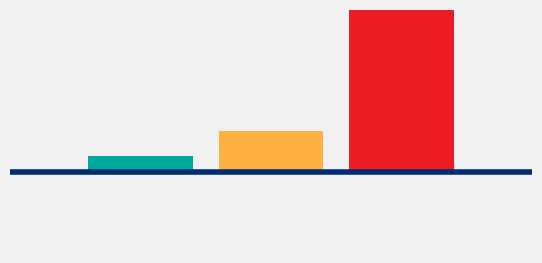

In [ ]:
with plt.style.context('fivethirtyeight'):
    plt.figure(figsize=(6,3))
    plt.bar(x=cell_types, height=single_contribs, color = ['#00A79D', '#FBB040', '#ED1C24'])
    plt.hlines(0,-1,3, color='#002D72')
    plt.ylim(-1,2)
    plt.margins(x=0, y=0)
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
    plt.yticks([])
    plt.xticks([])
    #plt.yticks(fontsize=24, color='#002D72')
    # plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
    plt.show()

In [ ]:
row_filter_1 = boda2_df['method'].isin(['DHS', 'gs', 'sa', 'al', 'fsp']) & (boda2_df['round'] == 0)

round_0_df = boda2_df[row_filter_1].reset_index(drop=True)
print(len(round_0_df))

num_naturals = round_0_df['method'].isin(['DHS', 'gs']).sum()
num_synthetics = round_0_df['method'].isin(['sa', 'al', 'fsp']).sum()
num_all_seqs = len(round_0_df)
num_naturals, num_synthetics, num_all_seqs

natural_pcts = []
synthetic_pcts = []
total_pcts = []
for motif_id in tqdm(motif_list):
    hit_seqs = fimo_df[fimo_df['motif_id'] == motif_id]['sequence_name'].unique()
    motif_boda2_df = round_0_df[round_0_df['ID'].isin(hit_seqs)].reset_index(drop=True)
    motif_num_naturals = motif_boda2_df['method'].isin(['DHS', 'gs']).sum()
    motif_num_synthetics = motif_boda2_df['method'].isin(['sa', 'al', 'fsp']).sum()
    natural_pcts.append(motif_num_naturals/num_naturals)
    synthetic_pcts.append(motif_num_synthetics/num_synthetics)
    total_pcts.append(len(motif_boda2_df)/num_all_seqs)

60000


  0%|          | 0/82 [00:00<?, ?it/s]

(NFKB1) M12
3.991666666666667 15.588888888888889


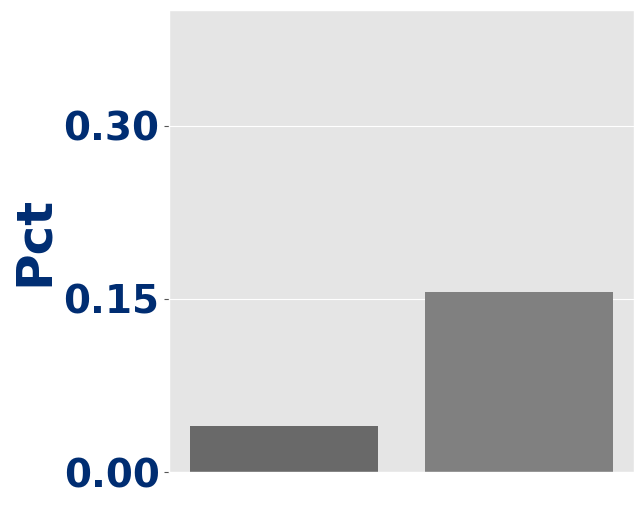

In [ ]:
idx = 11   #1, 2, 3, 7, 9, 11

print(boda2_streme_tfs.iloc[idx]['ultimate_id'])

print(100*natural_pcts[idx], 100*synthetic_pcts[idx])
with plt.style.context('ggplot'):
    plt.figure(figsize=(6,6))
    plt.bar(x=[0,1], height=[natural_pcts[idx], synthetic_pcts[idx]], color = ['dimgray', 'grey'])
    plt.ylim(0, .4)
    # for spine in plt.gca().spines.values():
    #     spine.set_visible(False)
    #plt.yticks([])
    plt.xticks([])
    plt.yticks(ticks=[0, .15, 0.30], fontsize=28, color='#002D72', fontweight='bold')
    plt.ylabel('Pct', fontsize=36, color='#002D72', fontweight='bold')
    # plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
    plt.show()

(GATA1) M4 (MEIS2) M10


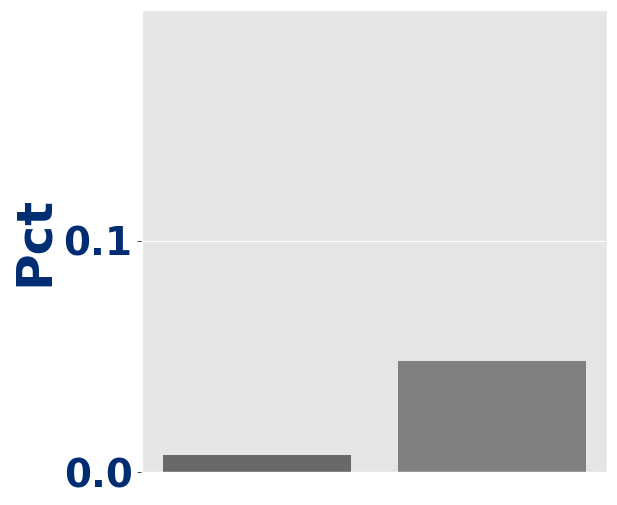

(HNF4A) M3 (GFI1) M2


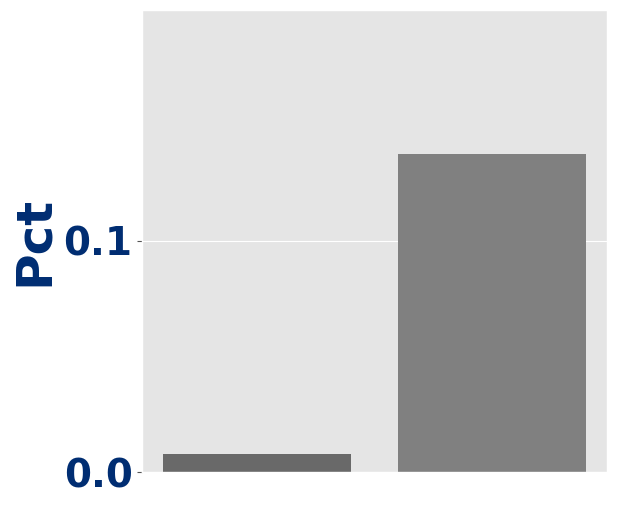

(NFKB1) M12 M8


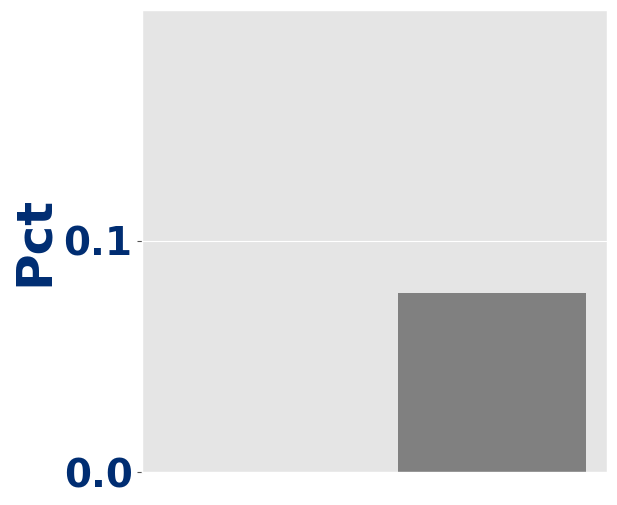

(GATA1) M4 (SNAI2) M13


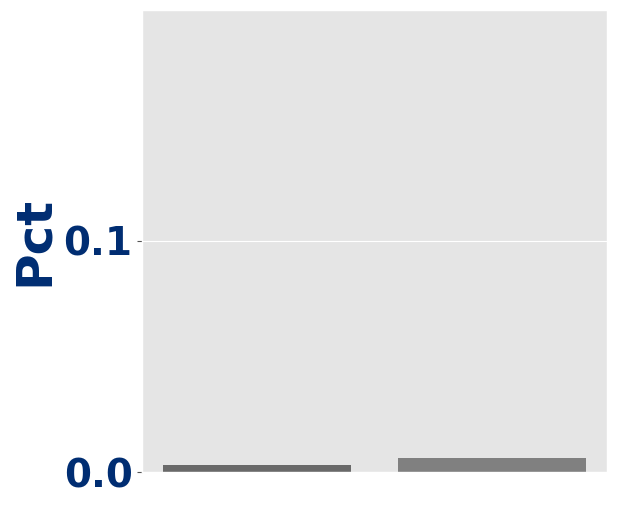

In [ ]:
idx_pairs = [[3, 9], [2,1], [11, 7], [3,12]]

set_naturals = round_0_df[round_0_df['method'].isin(['DHS', 'gs'])]#['sequence']#.unique()
set_synthetics = round_0_df[round_0_df['method'].isin(['sa', 'al', 'fsp'])]#['sequence']@.unique()

for idx_pair in idx_pairs:
    print(boda2_streme_tfs.iloc[idx_pair[0]]['ultimate_id'], boda2_streme_tfs.iloc[idx_pair[1]]['ultimate_id'])
    active_set = fimo_df[fimo_df['motif_alt_id'] == f'STREME-{idx_pair[0]}']['sequence_name'].unique()
    silence_set = fimo_df[fimo_df['motif_alt_id'] == f'STREME-{idx_pair[1]}']['sequence_name'].unique()
    intersection = set(active_set) & set(silence_set)
    nat_pct = len(set_naturals[set_naturals['ID'].isin(intersection)]) / len(set_naturals)
    syn_pct = len(set_synthetics[set_synthetics['ID'].isin(intersection)]) / len(set_synthetics)
    with plt.style.context('ggplot'):
        plt.figure(figsize=(6,6))
        plt.bar(x=[0,1], height=[nat_pct, syn_pct], color = ['dimgray', 'grey'])
        plt.ylim(0, .2)
        # for spine in plt.gca().spines.values():
        #     spine.set_visible(False)
        #plt.yticks([])
        plt.xticks([])
        plt.yticks(ticks=[0, .1], fontsize=28, color='#002D72', fontweight='bold')
        plt.ylabel('Pct', fontsize=36, color='#002D72', fontweight='bold')
        # plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
        plt.show()

(GATA1) M4 (HNF1B) M1


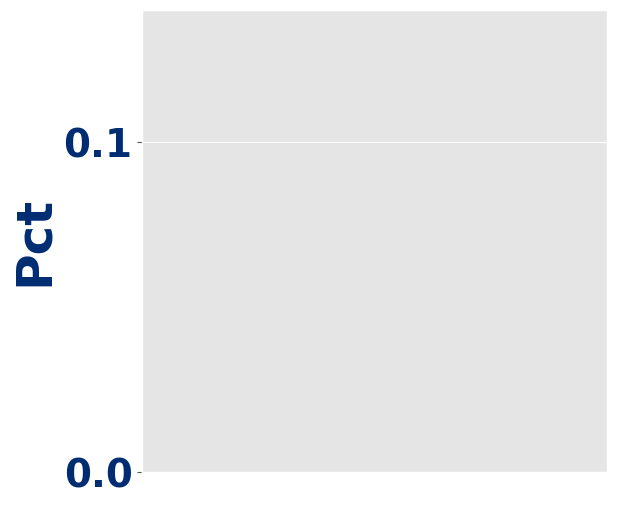

(GATA1) M4 (GFI1) M2


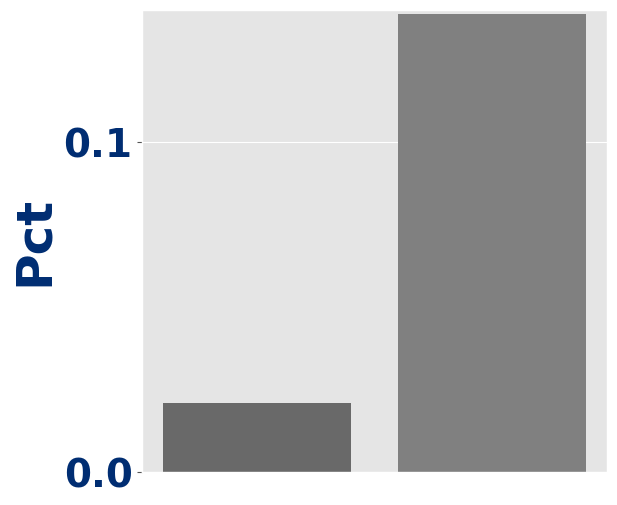

(GATA1) M4 (HNF4A) M3


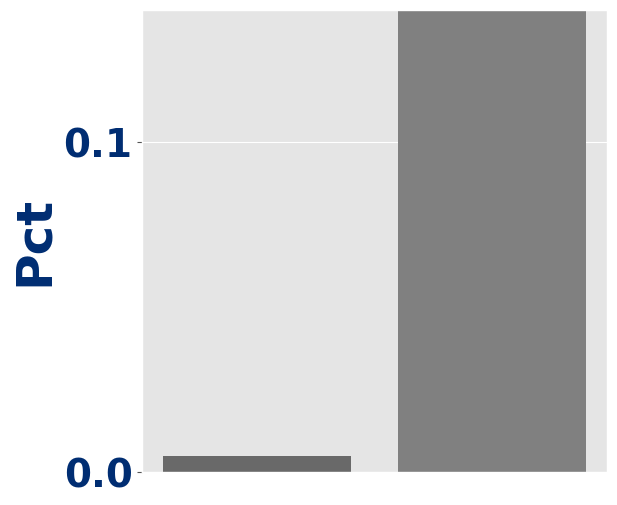

(GATA1) M4 (GATA1) M4


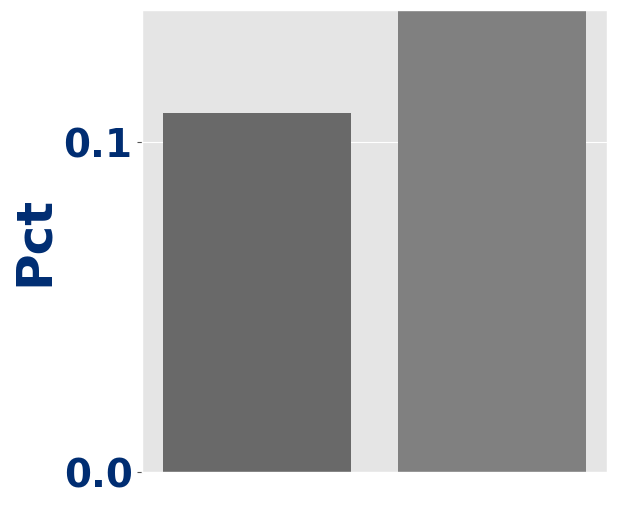

(GATA1) M4 (PKNOX2) M5


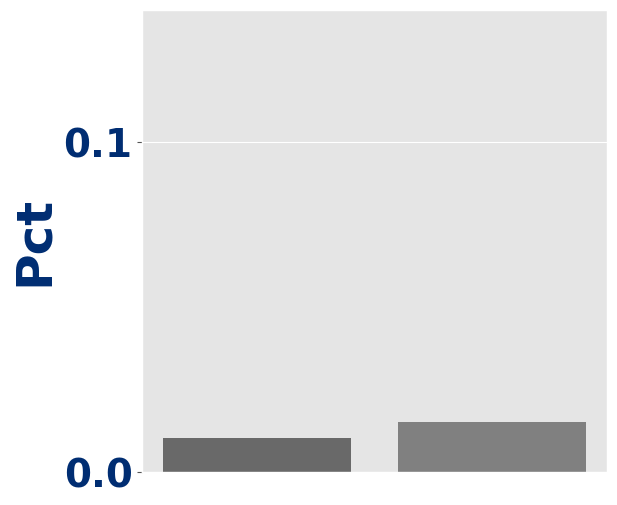

(GATA1) M4 (FOS::JUNB) M6


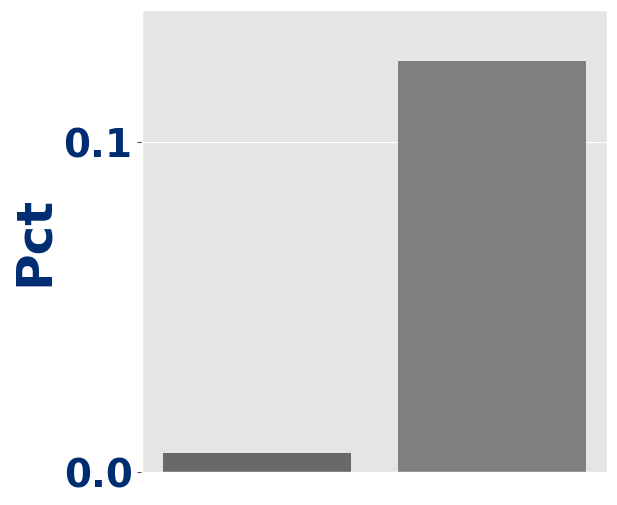

(GATA1) M4 M7


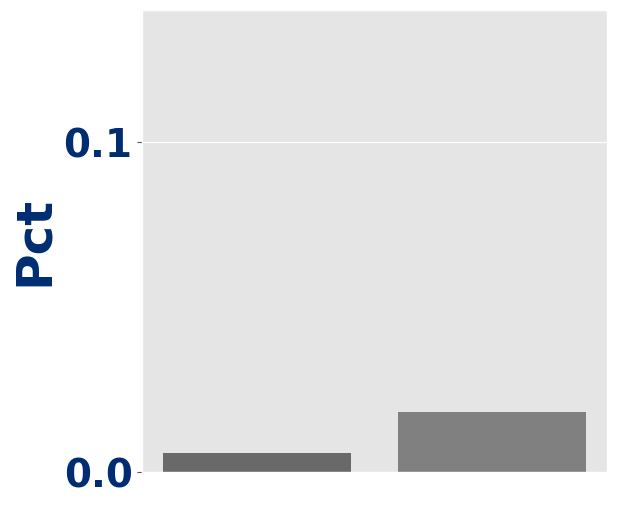

(GATA1) M4 M8


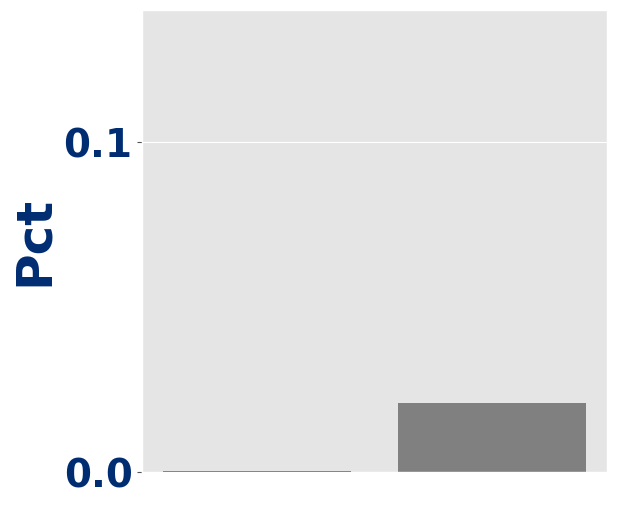

(GATA1) M4 (HIC2) M9


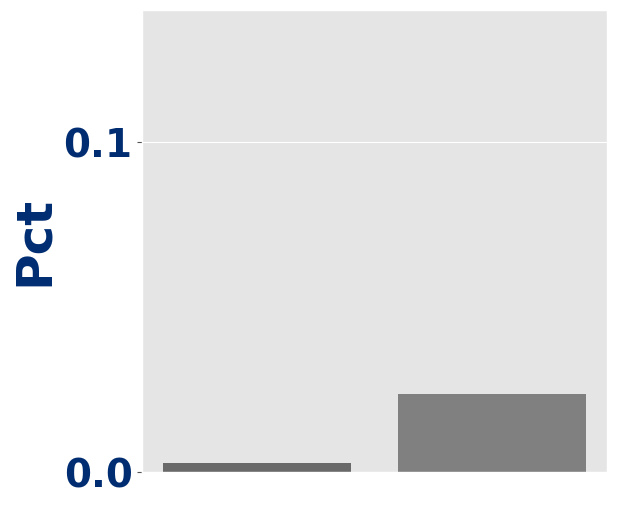

(GATA1) M4 (MEIS2) M10


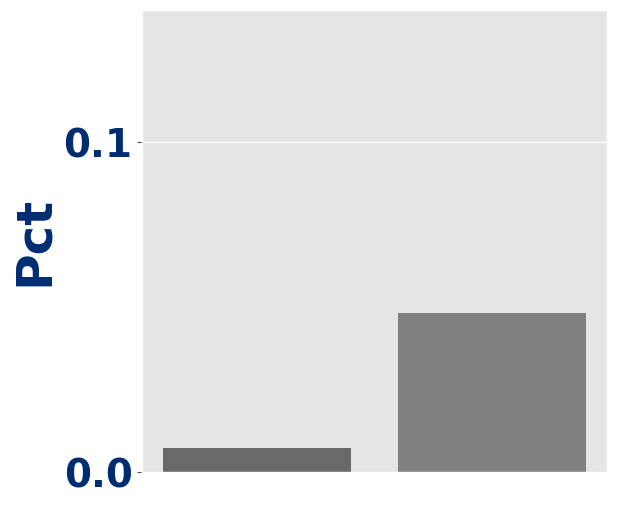

(GATA1) M4 (E2F7) M11


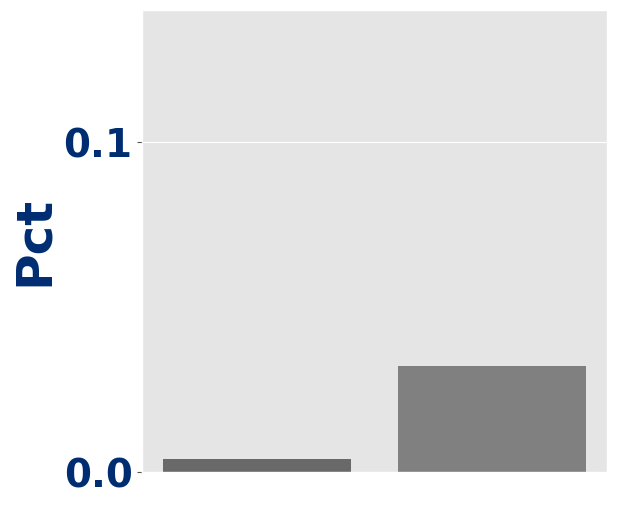

(GATA1) M4 (NFKB1) M12


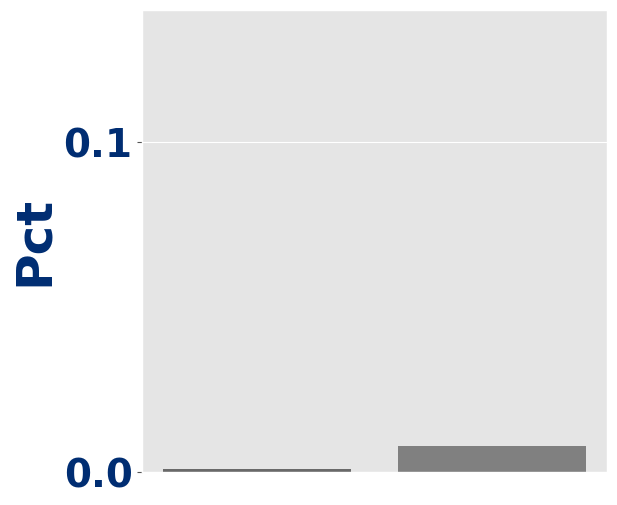

(GATA1) M4 (SNAI2) M13


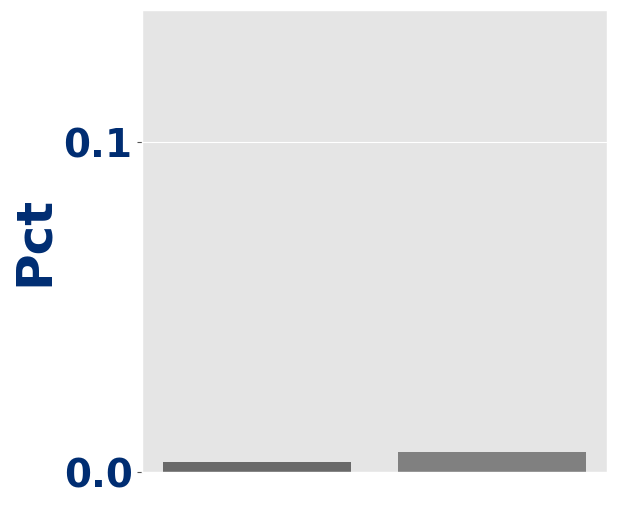

(GATA1) M4 M14


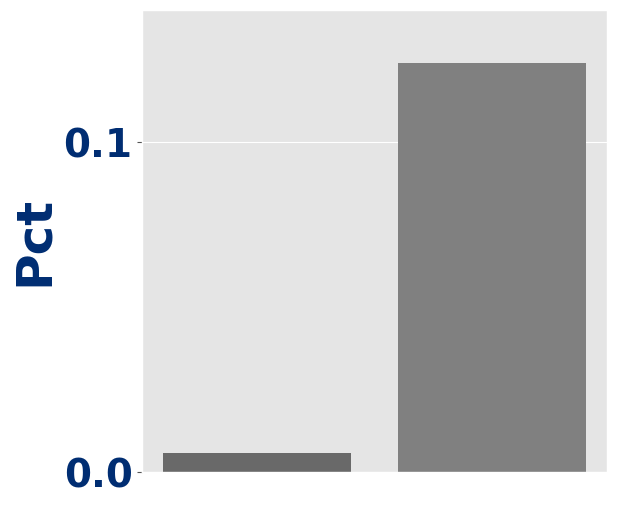

(GATA1) M4 (MEF2D) M15


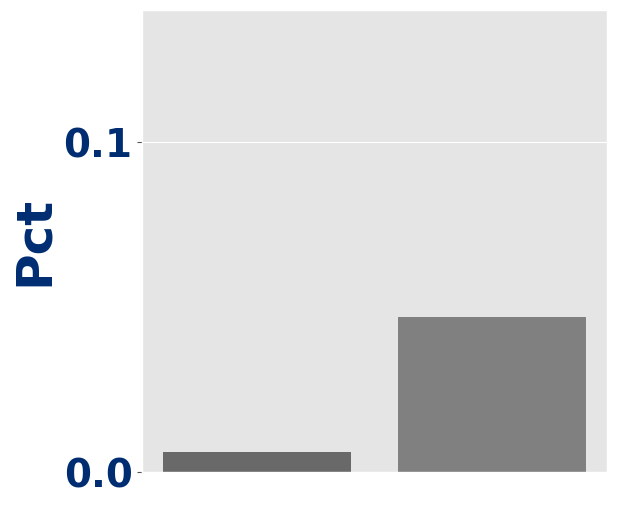

In [ ]:
idx_pairs = [[3, i] for i in range(15)]

set_naturals = round_0_df[round_0_df['method'].isin(['DHS', 'gs'])]
set_synthetics = round_0_df[round_0_df['method'].isin(['sa', 'al', 'fsp'])]

for idx_pair in idx_pairs:
    print(boda2_streme_tfs.iloc[idx_pair[0]]['ultimate_id'], boda2_streme_tfs.iloc[idx_pair[1]]['ultimate_id'])
    active_set = fimo_df[fimo_df['motif_alt_id'] == f'STREME-{idx_pair[0]}']['sequence_name'].unique()
    silence_set = fimo_df[fimo_df['motif_alt_id'] == f'STREME-{idx_pair[1]}']['sequence_name'].unique()
    intersection = set(active_set) & set(silence_set)
    nat_pct = len(set_naturals[set_naturals['ID'].isin(intersection)]) / len(set_naturals)
    syn_pct = len(set_synthetics[set_synthetics['ID'].isin(intersection)]) / len(set_synthetics)
    with plt.style.context('ggplot'):
        plt.figure(figsize=(6,6))
        plt.bar(x=[0,1], height=[nat_pct, syn_pct], color = ['dimgray', 'grey'])
        plt.ylim(0, .14)
        # for spine in plt.gca().spines.values():
        #     spine.set_visible(False)
        #plt.yticks([])
        plt.xticks([])
        plt.yticks(ticks=[0, .1, ], fontsize=28, color='#002D72', fontweight='bold')
        plt.ylabel('Pct', fontsize=36, color='#002D72', fontweight='bold')
        # plt.savefig('temp_fig.pdf', format='pdf', transparent=True, dpi=150, bbox_inches='tight')
        plt.show()